In [ ]:
!pip install missingpy pandas-profiling -U

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 49 kB 2.8 MB/s 
     |████████████████████████████████| 325 kB 8.8 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 9.9 MB 59.0 MB/s 
     |████████████████████████████████| 102 kB 63.6 MB/s 
     |████████████████████████████████| 679 kB 60.1 MB/s 
     |████████████████████████████████| 4.7 MB 60.5 MB/s 
     |████████████████████████████████| 296 kB 66.8 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=ae877fdb1ebd68559c11d82f8058b5146b4cf20abd05a5fd902b350647dcfbf4
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
Successfully built htmlmin
  Attempting uninstall: typeguard
    Found existing installation: typeguard 2.7.1
    Uninstalling typeguard-2.7.1:
      Successfully uninstalled typegua

In [ ]:
import sys
import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest
from pandas_profiling import ProfileReport

In [ ]:
#imports
import os
import pandas as pd
import numpy as np
import random
import math
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from datetime import datetime
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import matplotlib.pyplot as plt
from scipy import stats
from statsmodels.stats.anova import AnovaRM
from statsmodels.formula.api import ols
from sklearn.preprocessing import StandardScaler
import missingno as msno
from statsmodels.stats.diagnostic import het_breuschpagan
import statsmodels.tsa.api as smt
from sklearn.dummy import DummyRegressor

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
original_df = pd.read_csv(r"allChannelData.csv")
df = original_df

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (35) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


# Data Cleaning

In [ ]:
df.sample(n=5)

,views,redViews,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,estimatedMinutesWatched,estimatedRedMinutesWatched,averageViewDuration,averageViewPercentage,annotationClickThroughRate,annotationCloseRate,annotationImpressions,annotationClickableImpressions,annotationClosableImpressions,annotationClicks,annotationCloses,cardClickRate,cardTeaserClickRate,cardImpressions,cardTeaserImpressions,cardClicks,cardTeaserClicks,subscribersGained,subscribersLost,grossRevenue,monetizedPlaybacks,playbackBasedCpm,adImpressions,cpm,dataStartDate,dataEndDate,Video Publish Times,length,estimatedHoursWatched,CumulativeSubscribers,Channel,titleLength,descriptionLength,numOfKeywords,PlaylistCategory
248220,0,0,0,0,0,0,0,0,0,0,0:00:00,0.0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,2022-10-01,2022-11-01,05/11/2020,609,0.0,0,2,30,187,19,45
3494,0,0,0,0,0,0,0,0,0,0,0:00:00,0.0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,2020-11-01,2020-12-01,11/14/2022,778.0,0.0,0,1,39,193,1,6
231199,0,0,0,0,0,0,0,0,0,0,0:00:00,0.0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,2022-07-01,2022-08-01,04/22/2020,13776,0.0,0,2,15,187,0,45
226115,0,0,0,0,0,0,0,0,0,0,0:00:00,0.0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,2022-06-01,2022-07-01,12/23/2020,650,0.0,0,2,33,512,0,15
204587,0,0,0,0,0,0,0,0,0,0,0:00:00,0.0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.0,0,0.0,0,0.0,2022-03-01,2022-04-01,08/01/2020,1726,0.0,0,2,11,301,19,45


In [ ]:
df.columns

Index(['views', 'redViews', 'comments', 'likes', 'dislikes', 'shares',
       'videosAddedToPlaylists', 'videosRemovedFromPlaylists',
       'estimatedMinutesWatched', 'estimatedRedMinutesWatched',
       'averageViewDuration', 'averageViewPercentage',
       'annotationClickThroughRate', 'annotationCloseRate',
       'annotationImpressions', 'annotationClickableImpressions',
       'annotationClosableImpressions', 'annotationClicks', 'annotationCloses',
       'cardClickRate', 'cardTeaserClickRate', 'cardImpressions',
       'cardTeaserImpressions', 'cardClicks', 'cardTeaserClicks',
       'subscribersGained', 'subscribersLost', 'grossRevenue',
       'monetizedPlaybacks', 'playbackBasedCpm', 'adImpressions', 'cpm',
       'dataStartDate', 'dataEndDate', 'Video Publish Times', 'length',
       'estimatedHoursWatched', 'CumulativeSubscribers', 'Channel',
       'titleLength', 'descriptionLength', 'numOfKeywords',
       'PlaylistCategory'],
      dtype='object')

## Summary Stats

In [ ]:
summary_df = df.describe(include='all')
summary_df = summary_df.T
summary_df

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
views,288835.0,NaN,NaN,NaN,1295.633071,8387.893711,0.0,0.0,0.0,2.0,730749.0
redViews,288835.0,NaN,NaN,NaN,52.950345,346.582899,0.0,0.0,0.0,0.0,32461.0
comments,288835.0,NaN,NaN,NaN,2.822051,43.2113,0.0,0.0,0.0,0.0,6018.0
likes,288835.0,NaN,NaN,NaN,73.507729,456.774941,-81.0,0.0,0.0,0.0,18001.0
dislikes,288835.0,NaN,NaN,NaN,0.849911,6.877958,-193.0,0.0,0.0,0.0,1638.0
shares,288835.0,NaN,NaN,NaN,7.833317,61.818454,0.0,0.0,0.0,0.0,6108.0
videosAddedToPlaylists,288835.0,NaN,NaN,NaN,9.205134,54.298329,0.0,0.0,0.0,0.0,4984.0
videosRemovedFromPlaylists,288835.0,NaN,NaN,NaN,5.377316,28.422843,0.0,0.0,0.0,0.0,4314.0
estimatedMinutesWatched,288835.0,NaN,NaN,NaN,10033.754929,70158.314132,0.0,0.0,0.0,2.0,3676005.0
estimatedRedMinutesWatched,288835.0,NaN,NaN,NaN,512.656537,3741.776855,0.0,0.0,0.0,0.0,218681.0


In [ ]:
summary_df[(summary_df['min'] == 0) & (summary_df['max'] == 0) & (summary_df['mean'] == 0)]

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
annotationClickThroughRate,288835.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
annotationCloseRate,288835.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
annotationImpressions,288835.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
annotationClickableImpressions,288835.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
annotationClosableImpressions,288835.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
annotationClicks,288835.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
annotationCloses,288835.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Convert Video Publish Time to Days Since Data Retreival

In [ ]:
def convert_yyyymmdd_to_datetime(date):
    if date is None:
        return None
    if isinstance(date, str):
        if '-' in date:
            return datetime.strptime(date, "%Y-%m-%d")
        elif '/'in date:
            return datetime.strptime(date, "%m/%d/%Y")
        else:
            return None


In [ ]:

remove = 0
removed = []
for index, val in enumerate(df['Video Publish Times']):
    vid_pub_time = convert_yyyymmdd_to_datetime(val)
    data_end_date = convert_yyyymmdd_to_datetime(df['dataEndDate'][index])
    if vid_pub_time is None or data_end_date is None:
        continue
    if data_end_date < vid_pub_time:
        remove += 1
        removed.append(index)
print(remove)

151270


In [ ]:
len(df) - remove

137565

In [ ]:
df = df[~df.index.isin(removed)]

In [ ]:
df = df[df['Video Publish Times'] != 'NaT']

In [ ]:
df.reset_index(drop=True, inplace=True)
df.sample(7)

,views,redViews,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,estimatedMinutesWatched,estimatedRedMinutesWatched,averageViewDuration,averageViewPercentage,annotationClickThroughRate,annotationCloseRate,annotationImpressions,annotationClickableImpressions,annotationClosableImpressions,annotationClicks,annotationCloses,cardClickRate,cardTeaserClickRate,cardImpressions,cardTeaserImpressions,cardClicks,cardTeaserClicks,subscribersGained,subscribersLost,grossRevenue,monetizedPlaybacks,playbackBasedCpm,adImpressions,cpm,dataStartDate,dataEndDate,Video Publish Times,length,estimatedHoursWatched,CumulativeSubscribers,Channel,titleLength,descriptionLength,numOfKeywords,PlaylistCategory
92024,1,0,0,0,0,0,0,0,1,0,0:01:49,6.02,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.000,0,0.000,0,0.000,2022-04-01,2022-05-01,08/18/2020,1827,0.016667,0,2,11,334,19,45
14064,0,0,0,0,0,0,0,0,0,0,0:00:00,0.00,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.000,0,0.000,0,0.000,2021-12-01,2022-01-01,01/08/2021,599,0.000000,0,1,69,180,1,45
19757,30,3,0,-5,1,0,2,4,119,11,0:03:59,41.51,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.066,13,5.077,17,3.882,2022-03-01,2022-04-01,02/20/2022,576,1.983333,0,1,21,1249,38,13
78272,0,0,0,0,0,0,0,1,0,0,0:00:00,0.00,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.000,0,0.000,0,0.000,2021-12-01,2022-01-01,09/14/2021,762,0.000000,0,2,73,105,1,29
82041,1,0,0,-1,0,0,0,1,0,0,0:00:10,0.97,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.000,0,0.000,0,0.000,2022-01-01,2022-02-01,07/09/2021,1077,0.000000,0,2,53,404,1,29
114783,2,0,0,-3,0,0,0,0,11,0,0:05:50,48.88,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.001,1,1.000,2,0.500,2022-09-01,2022-10-01,07/21/2021,717,0.183333,0,2,63,460,30,19
129783,0,0,0,0,0,0,0,0,0,0,0:00:00,0.00,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0.000,0,0.000,0,0.000,2022-10-01,2022-10-31,01/25/2022,454,0.000000,0,3,61,665,59,25


In [ ]:
diff = []
for index, data_end_date in enumerate(df['dataEndDate']):
    vid_pub_time = convert_yyyymmdd_to_datetime(df['Video Publish Times'][index])
    data_end_date = convert_yyyymmdd_to_datetime(data_end_date)
    data_start_date = convert_yyyymmdd_to_datetime(df['dataStartDate'][index])

    if vid_pub_time is None or data_start_date is None:
        diff.append(None)
        continue
    if vid_pub_time.year > (data_start_date.year):
        diff.append(0)
    elif vid_pub_time.month >= (data_start_date.month) and vid_pub_time.year == (data_start_date.year):
        diff.append(0)
    else:
        if (data_start_date - vid_pub_time).days <= 0:
            print(data_start_date, vid_pub_time)
        diff.append((data_start_date - vid_pub_time).days)


In [ ]:
df['daysFromPublishDateToDataRetrieval'] = diff

In [ ]:
df.value_counts(['daysFromPublishDateToDataRetrieval']).sort_index()

daysFromPublishDateToDataRetrieval
0                                     10028
1                                       289
2                                       313
3                                       304
4                                       297
                                      ...  
2231                                      1
2258                                      1
2262                                      1
2288                                      1
2292                                      1
Length: 1410, dtype: int64

## Drop All 0 Columns and Redundant Columns

In [ ]:
# remove columns with all 0 values
df = df.drop('annotationClickThroughRate', axis=1, errors='ignore')
df = df.drop('annotationCloseRate', axis=1, errors='ignore')
df = df.drop('annotationClickableImpressions', axis=1, errors='ignore')
df = df.drop('annotationClosableImpressions', axis=1, errors='ignore')
df = df.drop('annotationImpressions', axis=1, errors='ignore')
df = df.drop('annotationClicks', axis=1, errors='ignore')
df = df.drop('annotationCloses', axis=1, errors='ignore')

# Remove redundant columns
df = df.drop('estimatedHoursWatched', axis=1, errors='ignore')
df = df.drop('dataEndDate', axis=1, errors='ignore')
df = df.drop('dataStartDate', axis=1, errors='ignore')
df = df.drop('Video Publish Times', axis=1, errors='ignore')
df = df.drop('titleLength', axis=1, errors='ignore')
df = df.drop('descriptionLength', axis=1, errors='ignore')

In [ ]:
df.columns

Index(['views', 'redViews', 'comments', 'likes', 'dislikes', 'shares',
       'videosAddedToPlaylists', 'videosRemovedFromPlaylists',
       'estimatedMinutesWatched', 'estimatedRedMinutesWatched',
       'averageViewDuration', 'averageViewPercentage', 'cardClickRate',
       'cardTeaserClickRate', 'cardImpressions', 'cardTeaserImpressions',
       'cardClicks', 'cardTeaserClicks', 'subscribersGained',
       'subscribersLost', 'grossRevenue', 'monetizedPlaybacks',
       'playbackBasedCpm', 'adImpressions', 'cpm', 'length',
       'CumulativeSubscribers', 'Channel', 'numOfKeywords', 'PlaylistCategory',
       'daysFromPublishDateToDataRetrieval'],
      dtype='object')

## Convert All Time to Seconds

In [ ]:
def get_sec(time_str: str):
    """Get seconds from time."""
    if time_str is None:
        return None
    if isinstance(time_str, int) or isinstance(time_str, float):
        return time_str
    if isinstance(time_str, str) and ':' not in time_str:
        if time_str[:2] == 'PT':
            time_str = time_str[2:]
            duration = 0
            if 'H' in time_str:
                duration += 3600 * int(time_str.split('H')[0])
                time_str = time_str.split('H')[1]

            if 'M' in time_str:
                duration += 60 * int(time_str.split('M')[0])
                time_str = time_str.split('M')[1]

            if 'S' in time_str:
                duration += int(time_str.split('S')[0])
                time_str = time_str.split('S')[1]

            return duration
        else:
            try:
                return float(time_str)
            except:
                try:
                    return int(time_str)
                except:
                    return None
    elif isinstance(time_str, str) and ':' in time_str:
        h, m, s = time_str.split(':')
        return int(h) * 3600 + int(m) * 60 + int(s)
    else:
        return None

In [ ]:
df = df[df['length'].isna() == False]

In [ ]:
df['length'] = df['length'].apply(get_sec)

In [ ]:
df['averageViewDuration'] = df['averageViewDuration'].apply(get_sec)

In [ ]:
df.isna().sum()[df.isna().sum() != 0]

length    84
dtype: int64

## Check Missing Observations

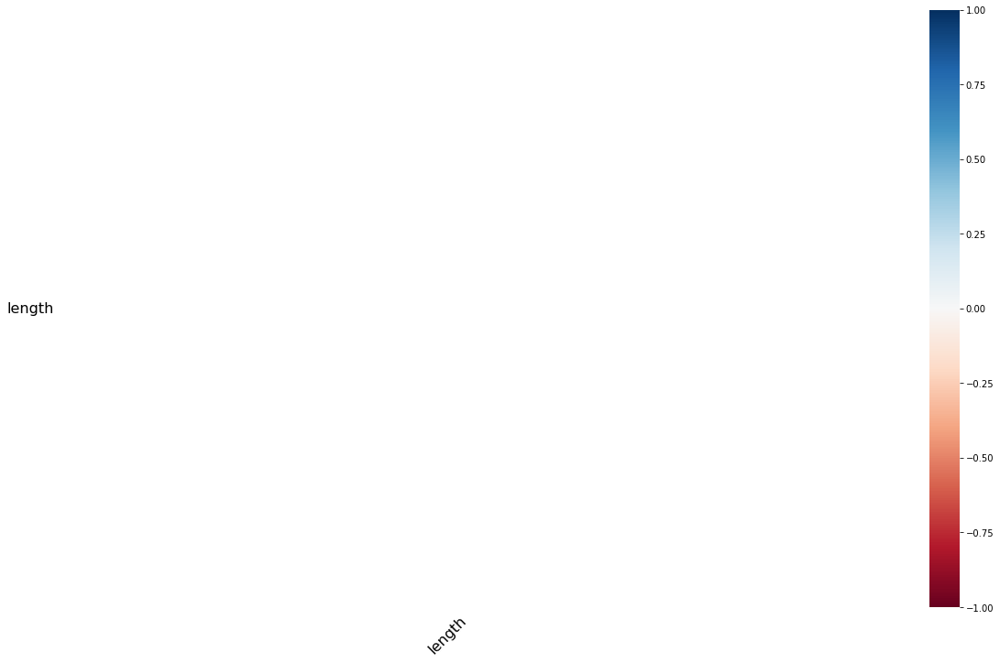

In [ ]:
msno.heatmap(df)

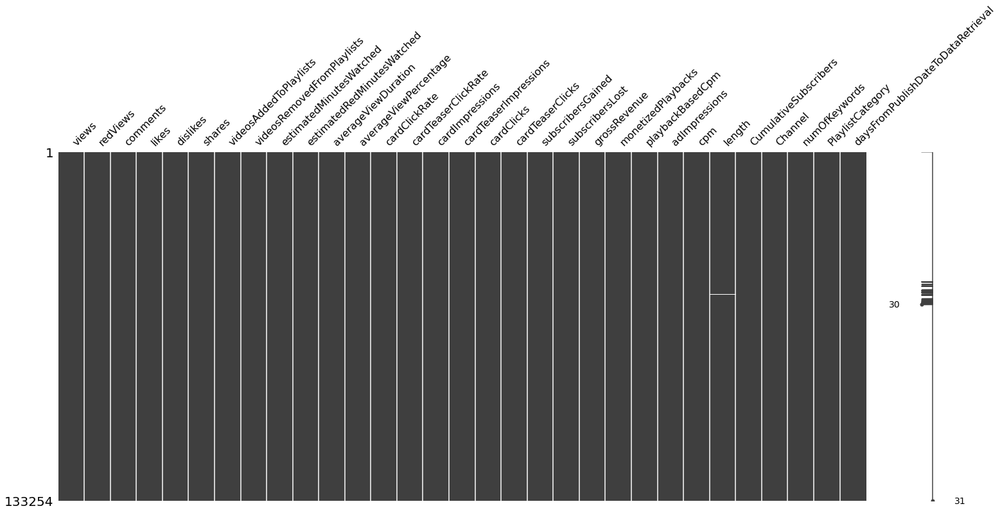

In [ ]:
msno.matrix(df.sort_values("grossRevenue"));

## Use imputation to replace negative predictor values for likes & dislikes

In [ ]:
summary_df = df.describe(include='all')
summary_df = summary_df.T
summary_df

,count,mean,std,min,25%,50%,75%,max
views,133170.0,2159.193602,10499.123501,0.0,0.0,2.00,13.000,730749.000
redViews,133170.0,92.106263,451.276751,0.0,0.0,0.00,0.000,32461.000
comments,133170.0,4.116565,23.777574,0.0,0.0,0.00,0.000,3041.000
likes,133170.0,120.277878,544.201395,-81.0,-2.0,0.00,0.000,18001.000
dislikes,133170.0,1.405054,8.865805,-80.0,0.0,0.00,0.000,1638.000
shares,133170.0,11.991590,62.700418,0.0,0.0,0.00,0.000,2952.000
videosAddedToPlaylists,133170.0,15.255966,64.298396,0.0,0.0,0.00,0.000,1819.000
videosRemovedFromPlaylists,133170.0,9.385350,34.372455,0.0,0.0,0.00,2.000,1675.000
estimatedMinutesWatched,133170.0,16650.691064,82663.759487,0.0,0.0,3.00,56.000,2458178.000
estimatedRedMinutesWatched,133170.0,879.384659,4390.837129,0.0,0.0,0.00,0.000,170741.000


In [ ]:
test_df = df
test_df['dislikes'] = df['dislikes'].mask(df['dislikes'] < 0, np.nan)
test_df['likes'] = df['likes'].mask(df['likes'] < 0, np.nan)
df = test_df

test_df.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
views,133170.0,2159.193602,10499.123501,0.0,0.0,2.00,13.000,730749.000
redViews,133170.0,92.106263,451.276751,0.0,0.0,0.00,0.000,32461.000
comments,133170.0,4.116565,23.777574,0.0,0.0,0.00,0.000,3041.000
likes,74428.0,217.584740,713.038788,0.0,0.0,0.00,0.000,18001.000
dislikes,132999.0,1.414996,8.856528,0.0,0.0,0.00,0.000,1638.000
shares,133170.0,11.991590,62.700418,0.0,0.0,0.00,0.000,2952.000
videosAddedToPlaylists,133170.0,15.255966,64.298396,0.0,0.0,0.00,0.000,1819.000
videosRemovedFromPlaylists,133170.0,9.385350,34.372455,0.0,0.0,0.00,2.000,1675.000
estimatedMinutesWatched,133170.0,16650.691064,82663.759487,0.0,0.0,3.00,56.000,2458178.000
estimatedRedMinutesWatched,133170.0,879.384659,4390.837129,0.0,0.0,0.00,0.000,170741.000


In [ ]:
df.isna().sum()

views                                     0
redViews                                  0
comments                                  0
likes                                 58742
dislikes                                171
shares                                    0
videosAddedToPlaylists                    0
videosRemovedFromPlaylists                0
estimatedMinutesWatched                   0
estimatedRedMinutesWatched                0
averageViewDuration                       0
averageViewPercentage                     0
cardClickRate                             0
cardTeaserClickRate                       0
cardImpressions                           0
cardTeaserImpressions                     0
cardClicks                                0
cardTeaserClicks                          0
subscribersGained                         0
subscribersLost                           0
grossRevenue                              0
monetizedPlaybacks                        0
playbackBasedCpm                

The missing values will be imputed with MissForest
I used this repository: https://github.com/epsilon-machine/missingpy

And initially got the idea from here: https://towardsdatascience.com/missforest-the-best-missing-data-imputation-algorithm-4d01182aed3


In [ ]:
impute_df = test_df
imputer = MissForest()
imputed_results = imputer.fit_transform(impute_df)
print(imputed_results)

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


Iteration: 0


/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


Iteration: 1


/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


Iteration: 2


/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


Iteration: 3
[[1.18871e+05 6.55400e+03 3.04100e+03 ... 1.00000e+00 2.20000e+01
  0.00000e+00]
 [3.27910e+04 1.79300e+03 8.00000e+01 ... 1.00000e+00 4.50000e+01
  0.00000e+00]
 [3.06970e+04 1.21700e+03 5.00000e+01 ... 1.00000e+00 4.50000e+01
  0.00000e+00]
 ...
 [1.50000e+01 0.00000e+00 0.00000e+00 ... 9.60000e+01 3.00000e+00
  1.48000e+02]
 [5.00000e+00 0.00000e+00 0.00000e+00 ... 9.60000e+01 3.00000e+00
  1.21000e+02]
 [5.00000e+00 0.00000e+00 0.00000e+00 ... 8.60000e+01 3.00000e+00
  1.08000e+02]]


In [ ]:
imputed_results.shape

(133170, 31)

In [ ]:
test_df.columns

Index(['views', 'redViews', 'comments', 'likes', 'dislikes', 'shares',
       'videosAddedToPlaylists', 'videosRemovedFromPlaylists',
       'estimatedMinutesWatched', 'estimatedRedMinutesWatched',
       'averageViewDuration', 'averageViewPercentage', 'cardClickRate',
       'cardTeaserClickRate', 'cardImpressions', 'cardTeaserImpressions',
       'cardClicks', 'cardTeaserClicks', 'subscribersGained',
       'subscribersLost', 'grossRevenue', 'monetizedPlaybacks',
       'playbackBasedCpm', 'adImpressions', 'cpm', 'length',
       'CumulativeSubscribers', 'Channel', 'numOfKeywords', 'PlaylistCategory',
       'daysFromPublishDateToDataRetrieval'],
      dtype='object')

In [ ]:
impute_df = pd.DataFrame(imputed_results, columns = test_df.columns)

In [ ]:
impute_df.to_csv("imputedData.csv", index = False)

In [ ]:
impute_df.isna().sum()

views                                 0
redViews                              0
comments                              0
likes                                 0
dislikes                              0
shares                                0
videosAddedToPlaylists                0
videosRemovedFromPlaylists            0
estimatedMinutesWatched               0
estimatedRedMinutesWatched            0
averageViewDuration                   0
averageViewPercentage                 0
cardClickRate                         0
cardTeaserClickRate                   0
cardImpressions                       0
cardTeaserImpressions                 0
cardClicks                            0
cardTeaserClicks                      0
subscribersGained                     0
subscribersLost                       0
grossRevenue                          0
monetizedPlaybacks                    0
playbackBasedCpm                      0
adImpressions                         0
cpm                                   0


In [ ]:
df = impute_df

## Summary Stats Again

In [ ]:
df.columns

Index(['views', 'redViews', 'comments', 'likes', 'dislikes', 'shares',
       'videosAddedToPlaylists', 'videosRemovedFromPlaylists',
       'estimatedMinutesWatched', 'estimatedRedMinutesWatched',
       'averageViewDuration', 'averageViewPercentage', 'cardClickRate',
       'cardTeaserClickRate', 'cardImpressions', 'cardTeaserImpressions',
       'cardClicks', 'cardTeaserClicks', 'subscribersGained',
       'subscribersLost', 'grossRevenue', 'monetizedPlaybacks',
       'playbackBasedCpm', 'adImpressions', 'cpm', 'length',
       'CumulativeSubscribers', 'Channel', 'numOfKeywords', 'PlaylistCategory',
       'daysFromPublishDateToDataRetrieval'],
      dtype='object')

In [ ]:
summary_df = df.describe(include='all')
summary_df = summary_df.T
summary_df

,count,mean,std,min,25%,50%,75%,max
views,133170.0,2159.193602,10499.123501,0.0,0.0,2.00,13.000,730749.000
redViews,133170.0,92.106263,451.276751,0.0,0.0,0.00,0.000,32461.000
comments,133170.0,4.116565,23.777574,0.0,0.0,0.00,0.000,3041.000
likes,133170.0,121.799494,543.898989,0.0,0.0,0.00,0.340,18001.000
dislikes,133170.0,1.420680,8.860767,0.0,0.0,0.00,0.000,1638.000
shares,133170.0,11.991590,62.700418,0.0,0.0,0.00,0.000,2952.000
videosAddedToPlaylists,133170.0,15.255966,64.298396,0.0,0.0,0.00,0.000,1819.000
videosRemovedFromPlaylists,133170.0,9.385350,34.372455,0.0,0.0,0.00,2.000,1675.000
estimatedMinutesWatched,133170.0,16650.691064,82663.759487,0.0,0.0,3.00,56.000,2458178.000
estimatedRedMinutesWatched,133170.0,879.384659,4390.837129,0.0,0.0,0.00,0.000,170741.000


In [ ]:
df.isna().sum()[df.isna().sum() != 0]

Series([], dtype: int64)

In [ ]:
gross_revenue_col = df.pop('grossRevenue')
df.insert(0, 'grossRevenue', gross_revenue_col)

## Show Duplicate rows

In [ ]:
duplicate_df = df[df.duplicated()]
duplicate_df

,grossRevenue,views,redViews,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,estimatedMinutesWatched,estimatedRedMinutesWatched,averageViewDuration,averageViewPercentage,cardClickRate,cardTeaserClickRate,cardImpressions,cardTeaserImpressions,cardClicks,cardTeaserClicks,subscribersGained,subscribersLost,monetizedPlaybacks,playbackBasedCpm,adImpressions,cpm,length,CumulativeSubscribers,Channel,numOfKeywords,PlaylistCategory,daysFromPublishDateToDataRetrieval
864,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,557.0,0.0,1.0,1.0,45.0,99.0
1539,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,557.0,0.0,1.0,1.0,45.0,130.0
1635,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312.0,0.0,1.0,1.0,45.0,141.0
3066,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312.0,0.0,1.0,1.0,45.0,200.0
4513,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312.0,0.0,1.0,1.0,45.0,261.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129711,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,595.0,0.0,3.0,72.0,25.0,51.0
129793,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,491.0,0.0,3.0,59.0,25.0,200.0
131857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,481.0,0.0,4.0,1.0,15.0,308.0
132476,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,481.0,0.0,4.0,1.0,15.0,339.0


## Drop 0 views, 0 adImpressions, etc.

In [ ]:
remove_df = df[(df['adImpressions'] == 0)]
remove_df

In [ ]:
df = df.drop(remove_df.index,errors='ignore')
df.reset_index(drop=True, inplace=True)

In [ ]:
remove_df = df[(df['views'] == 0) & (df['redViews'] == 0)]
remove_df

In [ ]:
df = df.drop(remove_df.index,errors='ignore')
df.reset_index(drop=True, inplace=True)

In [ ]:
len(df)

62916

## Drop Lowly Correlated Variables (<0.5)

In [ ]:
#Only numerical values
num_df = df
num_df = num_df.drop('Channel', axis=1)
num_df = num_df.drop('PlaylistCategory', axis=1)

In [ ]:
num_df.corr()

,grossRevenue,views,redViews,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,estimatedMinutesWatched,estimatedRedMinutesWatched,averageViewDuration,averageViewPercentage,cardClickRate,cardTeaserClickRate,cardImpressions,cardTeaserImpressions,cardClicks,cardTeaserClicks,subscribersGained,subscribersLost,monetizedPlaybacks,playbackBasedCpm,adImpressions,cpm,length,CumulativeSubscribers,numOfKeywords,daysFromPublishDateToDataRetrieval
grossRevenue,1.000000,0.896221,0.867498,0.693357,0.904362,0.675779,0.818165,0.911066,0.871958,0.906425,0.866161,0.169409,0.186656,0.241542,0.005648,0.180609,0.487047,0.278366,0.227961,0.667617,0.734069,0.973013,-0.000306,0.985759,-0.002446,-0.002389,0.618290,0.047816,-0.247163
views,0.896221,1.000000,0.969096,0.747849,0.880637,0.824809,0.831151,0.893728,0.869344,0.878297,0.844381,0.131921,0.195644,0.237707,0.004142,0.177861,0.492966,0.286460,0.213413,0.770972,0.748367,0.933356,-0.004962,0.922657,-0.006601,-0.024462,0.728067,0.075308,-0.243247
redViews,0.867498,0.969096,1.000000,0.787051,0.831578,0.788898,0.788561,0.855399,0.852084,0.865456,0.875825,0.142872,0.191271,0.236057,0.004152,0.143633,0.481286,0.259902,0.177021,0.756490,0.749917,0.903988,-0.004773,0.892692,-0.006399,-0.011914,0.712182,0.101310,-0.243733
comments,0.693357,0.747849,0.787051,1.000000,0.697669,0.642609,0.722934,0.713733,0.687493,0.752633,0.774180,0.142968,0.147946,0.166525,0.004886,0.116571,0.363252,0.203246,0.153278,0.615336,0.688951,0.707748,-0.003673,0.703339,-0.005035,0.018493,0.568122,0.040434,-0.205367
likes,0.904362,0.880637,0.831578,0.697669,1.000000,0.697455,0.881143,0.965812,0.922696,0.911857,0.862574,0.182742,0.209009,0.258220,0.006603,0.200442,0.446746,0.276990,0.250792,0.550869,0.763905,0.913221,-0.004530,0.916127,-0.006517,-0.002401,0.487780,0.050279,-0.270249
dislikes,0.675779,0.824809,0.788898,0.642609,0.697455,1.000000,0.707118,0.690591,0.644885,0.715884,0.677037,0.141513,0.158386,0.161316,0.003484,0.127363,0.334572,0.198537,0.162012,0.631346,0.629282,0.678266,-0.003291,0.678270,-0.004600,0.016640,0.593884,0.011417,-0.193743
shares,0.818165,0.831151,0.788561,0.722934,0.881143,0.707118,1.000000,0.892757,0.809781,0.845905,0.787315,0.159831,0.178684,0.197961,0.005111,0.166836,0.386598,0.242974,0.211005,0.625167,0.723906,0.834746,-0.004070,0.833160,-0.005744,0.003760,0.573809,0.018316,-0.224304
videosAddedToPlaylists,0.911066,0.893728,0.855399,0.713733,0.965812,0.690591,0.892757,1.000000,0.966756,0.902931,0.854630,0.174700,0.220386,0.257608,0.005686,0.185523,0.462071,0.273353,0.231880,0.602464,0.770275,0.923616,-0.004878,0.922974,-0.006848,-0.016498,0.542689,0.057401,-0.281510
videosRemovedFromPlaylists,0.871958,0.869344,0.852084,0.687493,0.922696,0.644885,0.809781,0.966756,1.000000,0.847362,0.822990,0.162834,0.231090,0.275452,0.006030,0.173274,0.460810,0.261907,0.214833,0.555688,0.732187,0.893937,-0.005717,0.889937,-0.007652,-0.034579,0.497482,0.093345,-0.310708
estimatedMinutesWatched,0.906425,0.878297,0.865456,0.752633,0.911857,0.715884,0.845905,0.902931,0.847362,1.000000,0.974735,0.233865,0.151279,0.218201,0.003903,0.148387,0.422584,0.240840,0.186930,0.664655,0.804399,0.902469,-0.003422,0.911012,-0.005394,0.071267,0.605133,0.062330,-0.240485


In [ ]:
corr_df = num_df.corr()
test_corr_df = corr_df[corr_df<0.5]
test_corr_df

,grossRevenue,views,redViews,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,estimatedMinutesWatched,estimatedRedMinutesWatched,averageViewDuration,averageViewPercentage,cardClickRate,cardTeaserClickRate,cardImpressions,cardTeaserImpressions,cardClicks,cardTeaserClicks,subscribersGained,subscribersLost,monetizedPlaybacks,playbackBasedCpm,adImpressions,cpm,length,CumulativeSubscribers,numOfKeywords,daysFromPublishDateToDataRetrieval
grossRevenue,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.169409,0.186656,0.241542,0.005648,0.180609,0.487047,0.278366,0.227961,NaN,NaN,NaN,-0.000306,NaN,-0.002446,-0.002389,NaN,0.047816,-0.247163
views,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.131921,0.195644,0.237707,0.004142,0.177861,0.492966,0.286460,0.213413,NaN,NaN,NaN,-0.004962,NaN,-0.006601,-0.024462,NaN,0.075308,-0.243247
redViews,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142872,0.191271,0.236057,0.004152,0.143633,0.481286,0.259902,0.177021,NaN,NaN,NaN,-0.004773,NaN,-0.006399,-0.011914,NaN,0.101310,-0.243733
comments,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142968,0.147946,0.166525,0.004886,0.116571,0.363252,0.203246,0.153278,NaN,NaN,NaN,-0.003673,NaN,-0.005035,0.018493,NaN,0.040434,-0.205367
likes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.182742,0.209009,0.258220,0.006603,0.200442,0.446746,0.276990,0.250792,NaN,NaN,NaN,-0.004530,NaN,-0.006517,-0.002401,0.487780,0.050279,-0.270249
dislikes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.141513,0.158386,0.161316,0.003484,0.127363,0.334572,0.198537,0.162012,NaN,NaN,NaN,-0.003291,NaN,-0.004600,0.016640,NaN,0.011417,-0.193743
shares,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.159831,0.178684,0.197961,0.005111,0.166836,0.386598,0.242974,0.211005,NaN,NaN,NaN,-0.004070,NaN,-0.005744,0.003760,NaN,0.018316,-0.224304
videosAddedToPlaylists,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.174700,0.220386,0.257608,0.005686,0.185523,0.462071,0.273353,0.231880,NaN,NaN,NaN,-0.004878,NaN,-0.006848,-0.016498,NaN,0.057401,-0.281510
videosRemovedFromPlaylists,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.162834,0.231090,0.275452,0.006030,0.173274,0.460810,0.261907,0.214833,NaN,NaN,NaN,-0.005717,NaN,-0.007652,-0.034579,0.497482,0.093345,-0.310708
estimatedMinutesWatched,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.233865,0.151279,0.218201,0.003903,0.148387,0.422584,0.240840,0.186930,NaN,NaN,NaN,-0.003422,NaN,-0.005394,0.071267,NaN,0.062330,-0.240485


In [ ]:
# Drop Columns with <0.5 corr with dependent variable (grossRevenue)
# variables dropped: playbackBasedCpm, averageViewDuration, averageViewPercentage,
# cardClickRate, cardTeaserClickRate, cardImpressions, cardTeaserImpressions, cardClicks, cardTeaserClicks,
# playbackBasedCpm, cpm, length, numOfKeywords, daysFromPublishDateToDataRetrieval

df.drop(["averageViewDuration", "averageViewPercentage",
"cardClickRate", "cardTeaserClickRate", "cardImpressions", "cardTeaserImpressions", "cardClicks", "cardTeaserClicks",
"playbackBasedCpm", "cpm", "length", "numOfKeywords", "daysFromPublishDateToDataRetrieval"], axis=1, inplace=True, errors='ignore')

## Add Dummy Variables for Channels

In [ ]:
# Make sure there are only 4 channels
len(np.where(df['Channel'] == 4, 1, 0)) == len(np.where(df['Channel'] == 3, 1, 0)) == len(np.where(df['Channel'] == 2, 1, 0)) == len(np.where(df['Channel'] == 1, 1, 0))

True

In [ ]:
df['Channel1'] = np.where(df['Channel'] == 1, 1, 0)
df['Channel2'] = np.where(df['Channel'] == 2, 1, 0)
df['Channel3'] = np.where(df['Channel'] == 3, 1, 0)
df['Channel4'] = np.where(df['Channel'] == 4, 1, 0)

## Drop Monetized Playbacks

'monetizedPlaybacks' was dropped because it's not as accurate as adImpressions (they're basically the same thing but 'adImpressions' is better)

See example from Google: "If your video is viewed 10 times, and 8 of those views contained ads, you would have 10 views and 8 estimated monetized playbacks. If one of those estimated monetized playbacks actually had 2 ads, you would have 9 ad impressions."

In [ ]:
df.drop(["monetizedPlaybacks"], axis=1, inplace=True, errors='ignore')

In [ ]:
df.columns

Index(['grossRevenue', 'views', 'redViews', 'comments', 'likes', 'dislikes',
       'shares', 'videosAddedToPlaylists', 'videosRemovedFromPlaylists',
       'estimatedMinutesWatched', 'estimatedRedMinutesWatched',
       'subscribersGained', 'subscribersLost', 'adImpressions',
       'CumulativeSubscribers', 'Channel', 'PlaylistCategory', 'Channel1',
       'Channel2', 'Channel3', 'Channel4'],
      dtype='object')

## Combine views & redViews

In [ ]:
df['totalViews'] = df['views'] + df['redViews']

In [ ]:
df.drop(['views', 'redViews'], axis=1,inplace=True, errors='ignore')

## Combine estimatedRedMinutesWatched & estimatedMinutesWatched

In [ ]:
df['estimatedTotalMinutesWatched'] = df['estimatedMinutesWatched'] + df['estimatedRedMinutesWatched']

In [ ]:
df.drop(['estimatedMinutesWatched', 'estimatedRedMinutesWatched'], axis=1,inplace=True, errors='ignore')

# Save to CSV

In [ ]:
df.reset_index(drop=True, inplace=True)
df.to_csv("FinalCleanedData.csv", index=False)

# Read CSV

In [ ]:
df = pd.read_csv('FinalCleanedData.csv')
df.sample(n=5)

,grossRevenue,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,subscribersLost,adImpressions,CumulativeSubscribers,PlaylistCategory,Channel1,Channel2,Channel3,Channel4,totalViews,estimatedTotalMinutesWatched,Channel
38752,0.008,0.0,0.22,0.0,0.0,1.0,3.0,0.0,0.0,1.0,0.0,19.0,0,1,0,0,4.0,26.0,2
29083,0.003,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15.0,0,1,0,0,2.0,11.0,2
1544,153.021,137.0,1371.00,12.0,124.0,195.0,104.0,9.0,3.0,27684.0,6.0,45.0,1,0,0,0,20655.0,95039.0,1
3665,2.366,1.0,7.11,0.0,2.0,5.0,11.0,0.0,0.0,752.0,0.0,32.0,1,0,0,0,733.0,3146.0,1
34809,528.442,44.0,3114.00,41.0,190.0,351.0,184.0,37.0,6.0,97850.0,31.0,19.0,0,1,0,0,51624.0,390742.0,2


In [ ]:
unimputed_df = df #Fix later

# EDA Pandas Profiling for Fully Cleaned Data

In [ ]:
profile = ProfileReport(df)
profile.to_file("fully-cleaned-df-report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# EDA

In [ ]:
df.describe(include='all')

,grossRevenue,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,subscribersLost,adImpressions,CumulativeSubscribers,PlaylistCategory,Channel1,Channel2,Channel3,Channel4,totalViews,estimatedTotalMinutesWatched,Channel
count,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,62916.000000,6.291600e+04,62916.000000
mean,31.362255,8.553420,254.550769,2.923346,25.006739,31.809524,19.324146,3.927936,0.811828,6859.033251,3.116107,27.234424,0.327039,0.620383,0.020964,0.031614,4687.546220,3.669695e+04,1.757152
std,102.604443,33.817388,767.177603,11.929330,89.005026,90.355063,47.906060,22.575875,2.953472,22356.882830,20.870433,12.685139,0.469135,0.485296,0.143266,0.174970,15339.538687,1.232509e+05,0.644585
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-105.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000e+00,1.000000
25%,0.014000,0.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,19.000000,0.000000,0.000000,0.000000,0.000000,4.000000,1.500000e+01,1.000000
50%,0.068000,0.000000,0.350000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,14.000000,0.000000,29.000000,0.000000,1.000000,0.000000,0.000000,14.000000,6.000000e+01,2.000000
75%,0.618000,0.000000,2.000000,0.000000,1.000000,1.000000,5.000000,0.000000,0.000000,134.000000,0.000000,37.000000,1.000000,1.000000,0.000000,0.000000,118.000000,6.822500e+02,2.000000
max,1864.061000,3041.000000,18001.000000,1638.000000,2952.000000,1819.000000,1675.000000,1268.000000,159.000000,427568.000000,1208.000000,45.000000,1.000000,1.000000,1.000000,1.000000,763210.000000,2.628919e+06,4.000000


In [ ]:
df[df['grossRevenue'] <=1]

,grossRevenue,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,subscribersLost,adImpressions,CumulativeSubscribers,PlaylistCategory,Channel1,Channel2,Channel3,Channel4,totalViews,estimatedTotalMinutesWatched,Channel
11,0.661,2.0,18.00,0.0,3.0,2.0,5.0,3.0,0.0,248.0,3.0,45.0,1,0,0,0,354.0,1192.0,1
13,0.840,1.0,7.00,0.0,1.0,3.0,5.0,1.0,0.0,187.0,1.0,45.0,1,0,0,0,213.0,757.0,1
14,0.734,2.0,6.00,0.0,3.0,1.0,2.0,0.0,0.0,175.0,0.0,45.0,1,0,0,0,170.0,555.0,1
15,0.656,1.0,11.00,0.0,4.0,3.0,1.0,0.0,0.0,172.0,0.0,45.0,1,0,0,0,167.0,686.0,1
16,0.740,0.0,7.00,0.0,8.0,3.0,2.0,1.0,0.0,215.0,1.0,45.0,1,0,0,0,154.0,744.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62911,0.013,0.0,0.20,0.0,0.0,1.0,3.0,0.0,0.0,5.0,0.0,3.0,0,0,0,1,2.0,18.0,4
62912,0.031,0.0,0.29,0.0,0.0,1.0,2.0,0.0,0.0,10.0,0.0,3.0,0,0,0,1,10.0,59.0,4
62913,0.023,0.0,0.11,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,3.0,0,0,0,1,7.0,43.0,4
62914,0.175,0.0,1.00,0.0,0.0,0.0,0.0,0.0,0.0,25.0,0.0,3.0,0,0,0,1,15.0,96.0,4


In [ ]:
df[df['grossRevenue'] > 1]

,grossRevenue,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,subscribersLost,adImpressions,CumulativeSubscribers,PlaylistCategory,Channel1,Channel2,Channel3,Channel4,totalViews,estimatedTotalMinutesWatched,Channel
0,953.390,3041.0,6959.00,99.0,920.0,669.0,275.0,359.0,20.0,165866.0,339.0,22.0,1,0,0,0,125425.0,2573425.0,1
1,338.717,80.0,2306.00,13.0,336.0,320.0,160.0,33.0,5.0,53340.0,28.0,45.0,1,0,0,0,34584.0,168806.0,1
2,157.797,50.0,887.00,31.0,295.0,133.0,51.0,192.0,6.0,43591.0,186.0,45.0,1,0,0,0,31914.0,141398.0,1
3,58.737,22.0,516.00,8.0,106.0,75.0,33.0,50.0,3.0,13168.0,47.0,45.0,1,0,0,0,10102.0,35850.0,1
4,69.852,40.0,518.00,15.0,225.0,98.0,48.0,77.0,4.0,15752.0,73.0,45.0,1,0,0,0,9421.0,55630.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62657,1.109,0.0,12.00,0.0,0.0,0.0,3.0,0.0,0.0,260.0,0.0,3.0,0,0,0,1,190.0,983.0,4
62658,1.084,0.0,4.44,0.0,0.0,3.0,7.0,0.0,0.0,282.0,0.0,3.0,0,0,0,1,181.0,679.0,4
62659,1.231,0.0,4.76,0.0,0.0,1.0,3.0,0.0,0.0,227.0,0.0,3.0,0,0,0,1,175.0,1125.0,4
62664,1.542,0.0,0.00,0.0,0.0,0.0,1.0,0.0,0.0,158.0,0.0,15.0,0,0,0,1,103.0,346.0,4


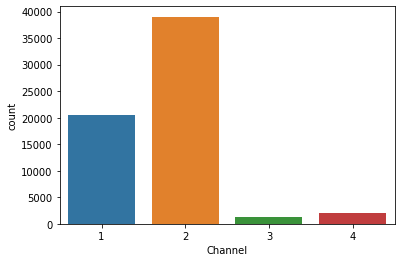

In [ ]:
sns.countplot(data=df, x='Channel')

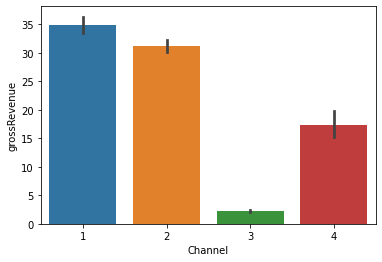

In [ ]:
sns.barplot(data=df, y='grossRevenue', x='Channel')

In [ ]:
df.corr()

,grossRevenue,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,subscribersLost,adImpressions,CumulativeSubscribers,PlaylistCategory,Channel1,Channel2,Channel3,Channel4,totalViews,estimatedTotalMinutesWatched,Channel
grossRevenue,1.000000,0.693357,0.904362,0.675779,0.818165,0.911066,0.871958,0.667617,0.734069,0.985759,0.618290,-0.081244,0.024227,-0.002283,-0.041575,-0.024583,0.896132,0.905490,-0.040219
comments,0.693357,1.000000,0.697669,0.642609,0.722934,0.713733,0.687493,0.615336,0.688951,0.703339,0.568122,-0.058306,0.118919,-0.096802,-0.031691,-0.024412,0.750383,0.754634,-0.106847
likes,0.904362,0.697669,1.000000,0.697455,0.881143,0.965812,0.922696,0.550869,0.763905,0.916127,0.487780,-0.064416,-0.028601,0.047370,-0.039084,-0.022697,0.879689,0.910473,-0.000192
dislikes,0.675779,0.642609,0.697455,1.000000,0.707118,0.690591,0.644885,0.631346,0.629282,0.678270,0.593884,-0.049354,0.031853,-0.018276,-0.027776,-0.011974,0.824336,0.714789,-0.035858
shares,0.818165,0.722934,0.881143,0.707118,1.000000,0.892757,0.809781,0.625167,0.723906,0.833160,0.573809,-0.038594,-0.002509,0.019933,-0.036420,-0.018738,0.830410,0.843971,-0.016442
videosAddedToPlaylists,0.911066,0.713733,0.965812,0.690591,0.892757,1.000000,0.966756,0.602464,0.770275,0.922974,0.542689,-0.077892,0.008913,0.009698,-0.034106,-0.022870,0.893240,0.901585,-0.026483
videosRemovedFromPlaylists,0.871958,0.687493,0.922696,0.644885,0.809781,0.966756,1.000000,0.555688,0.732187,0.889937,0.497482,-0.104589,0.031648,-0.008283,-0.039512,-0.029529,0.869696,0.847158,-0.047847
subscribersGained,0.667617,0.615336,0.550869,0.631346,0.625167,0.602464,0.555688,1.000000,0.621038,0.681202,0.993830,-0.066481,0.074388,-0.076628,-0.022035,0.031125,0.771318,0.664153,-0.042140
subscribersLost,0.734069,0.688951,0.763905,0.629282,0.723906,0.770275,0.732187,0.621038,1.000000,0.738978,0.530272,-0.049073,0.069147,-0.057945,-0.032786,0.002161,0.749347,0.804993,-0.056440
adImpressions,0.985759,0.703339,0.916127,0.678270,0.833160,0.922974,0.889937,0.681202,0.738978,1.000000,0.632291,-0.092141,0.014739,0.005673,-0.041732,-0.021084,0.922549,0.910116,-0.031449


In [ ]:
corr_df = df.corr()
test_corr_df = corr_df[abs(corr_df)>=0.7]
test_corr_df

,grossRevenue,comments,likes,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,subscribersLost,adImpressions,CumulativeSubscribers,PlaylistCategory,Channel1,Channel2,Channel3,Channel4,totalViews,estimatedTotalMinutesWatched,Channel
grossRevenue,1.000000,NaN,0.904362,NaN,0.818165,0.911066,0.871958,NaN,0.734069,0.985759,NaN,NaN,NaN,NaN,NaN,NaN,0.896132,0.905490,NaN
comments,NaN,1.000000,NaN,NaN,0.722934,0.713733,NaN,NaN,NaN,0.703339,NaN,NaN,NaN,NaN,NaN,NaN,0.750383,0.754634,NaN
likes,0.904362,NaN,1.000000,NaN,0.881143,0.965812,0.922696,NaN,0.763905,0.916127,NaN,NaN,NaN,NaN,NaN,NaN,0.879689,0.910473,NaN
dislikes,NaN,NaN,NaN,1.000000,0.707118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.824336,0.714789,NaN
shares,0.818165,0.722934,0.881143,0.707118,1.000000,0.892757,0.809781,NaN,0.723906,0.833160,NaN,NaN,NaN,NaN,NaN,NaN,0.830410,0.843971,NaN
videosAddedToPlaylists,0.911066,0.713733,0.965812,NaN,0.892757,1.000000,0.966756,NaN,0.770275,0.922974,NaN,NaN,NaN,NaN,NaN,NaN,0.893240,0.901585,NaN
videosRemovedFromPlaylists,0.871958,NaN,0.922696,NaN,0.809781,0.966756,1.000000,NaN,0.732187,0.889937,NaN,NaN,NaN,NaN,NaN,NaN,0.869696,0.847158,NaN
subscribersGained,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.993830,NaN,NaN,NaN,NaN,NaN,0.771318,NaN,NaN
subscribersLost,0.734069,NaN,0.763905,NaN,0.723906,0.770275,0.732187,NaN,1.000000,0.738978,NaN,NaN,NaN,NaN,NaN,NaN,0.749347,0.804993,NaN
adImpressions,0.985759,0.703339,0.916127,NaN,0.833160,0.922974,0.889937,NaN,0.738978,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.922549,0.910116,NaN


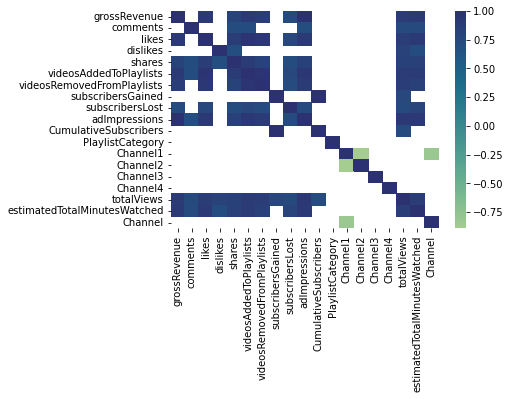

In [ ]:
sns.heatmap(test_corr_df, cmap='crest')

grossRevenue


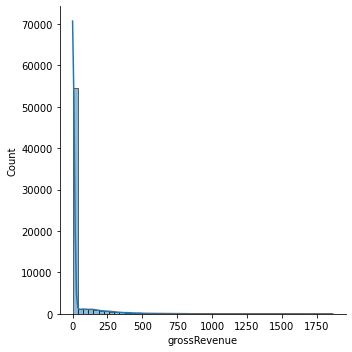

comments


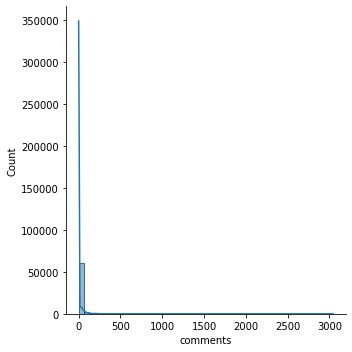

likes


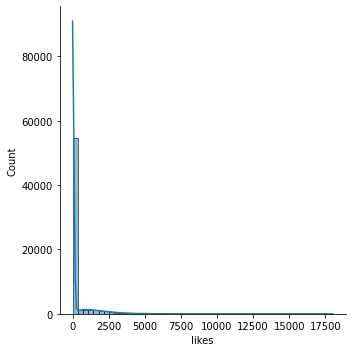

dislikes


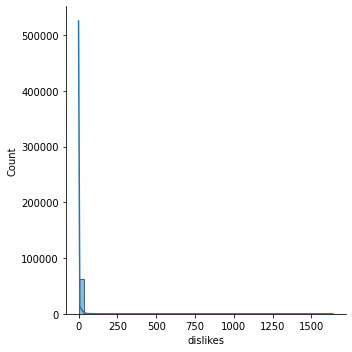

shares


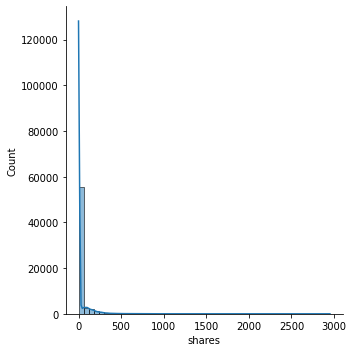

videosAddedToPlaylists


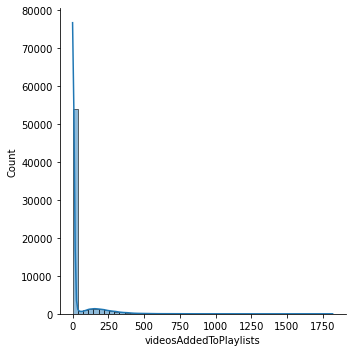

videosRemovedFromPlaylists


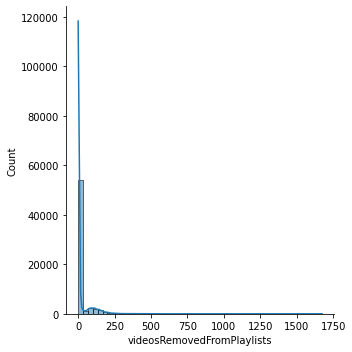

subscribersGained


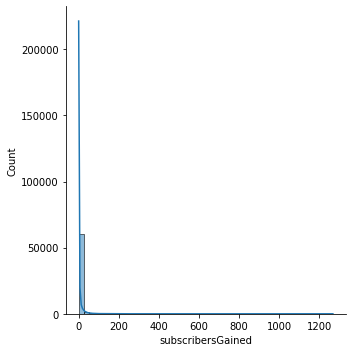

subscribersLost


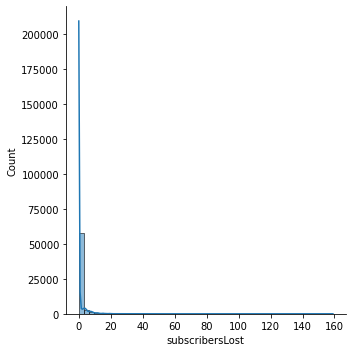

adImpressions


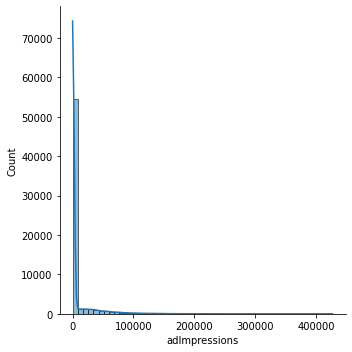

CumulativeSubscribers


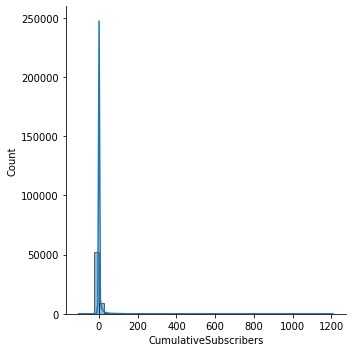

PlaylistCategory


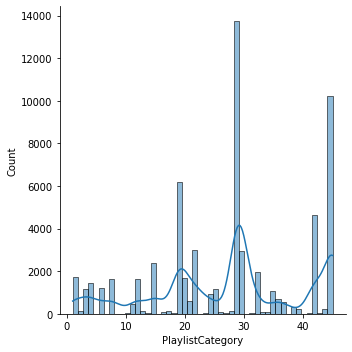

Channel1


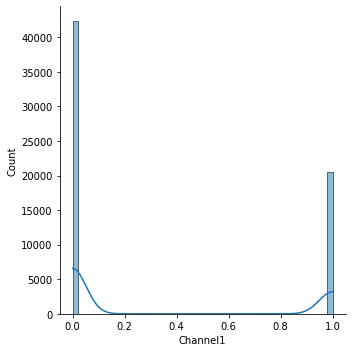

Channel2


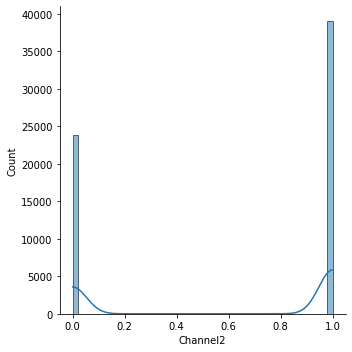

Channel3


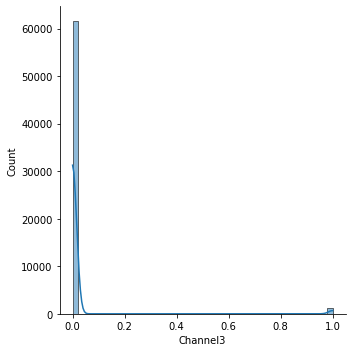

Channel4


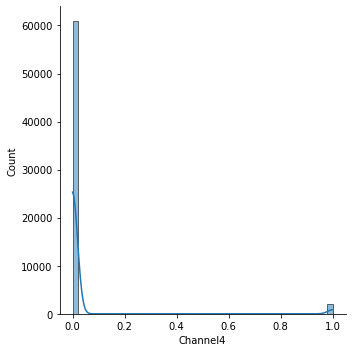

totalViews


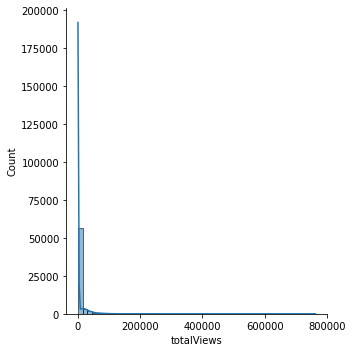

estimatedTotalMinutesWatched


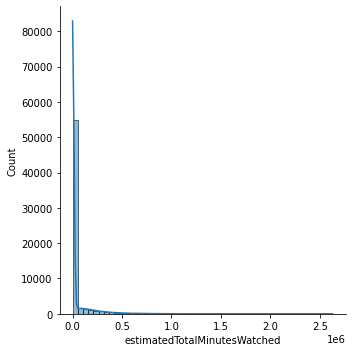

Channel


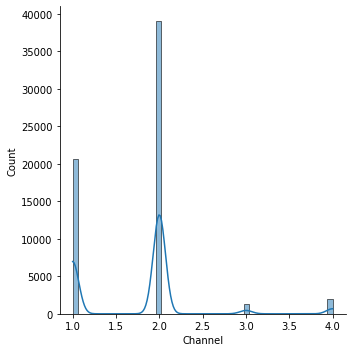

In [ ]:
for i in df:
  if i == "const":
        continue
  print(i)
  sns.displot(x=df[i], bins=50, kde=True)
  plt.show()

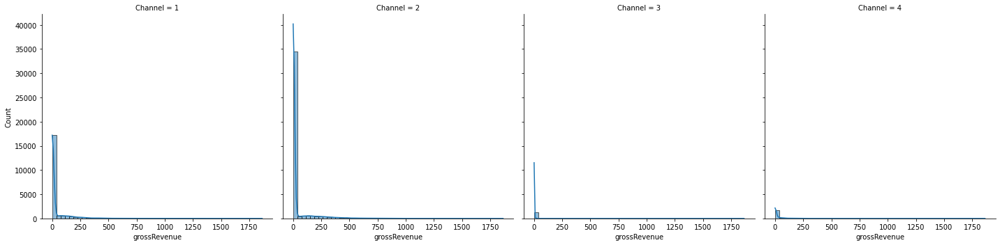

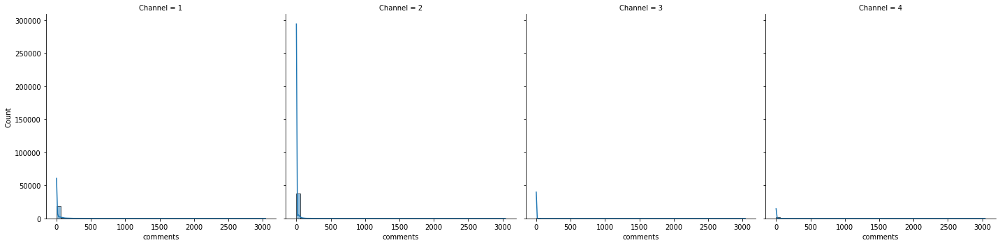

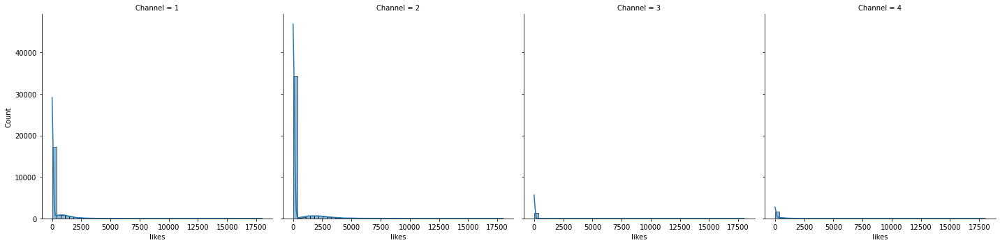

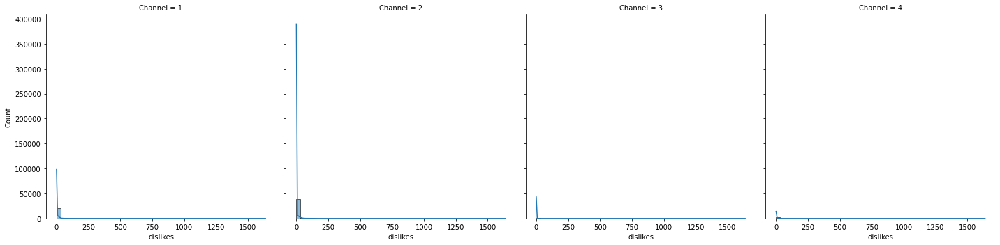

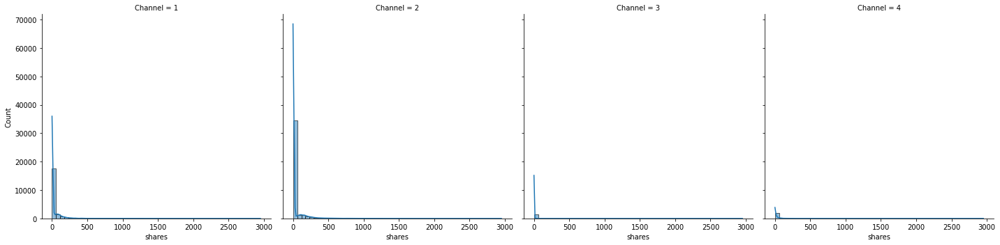

...

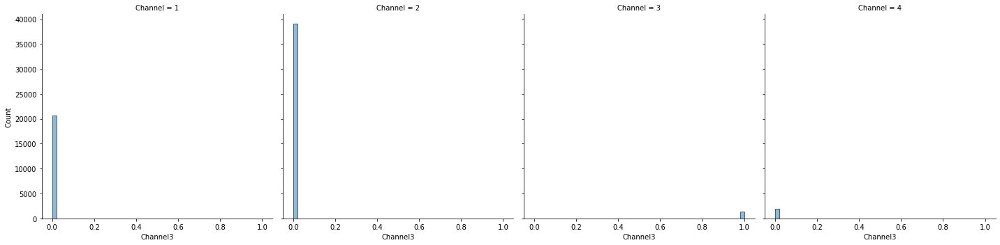

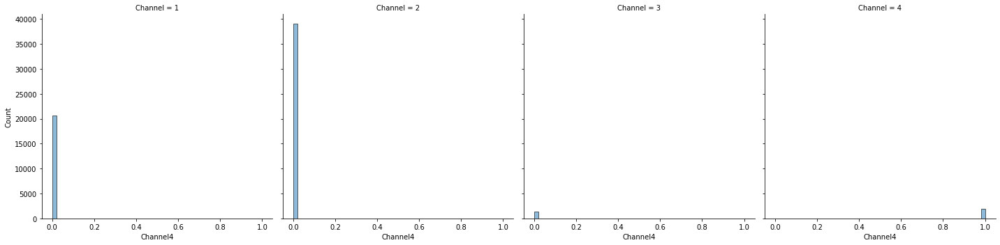

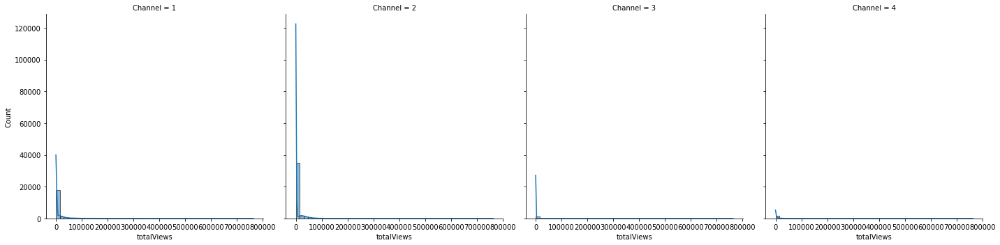

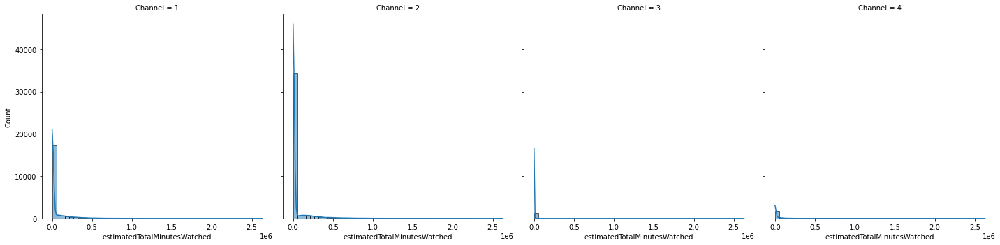

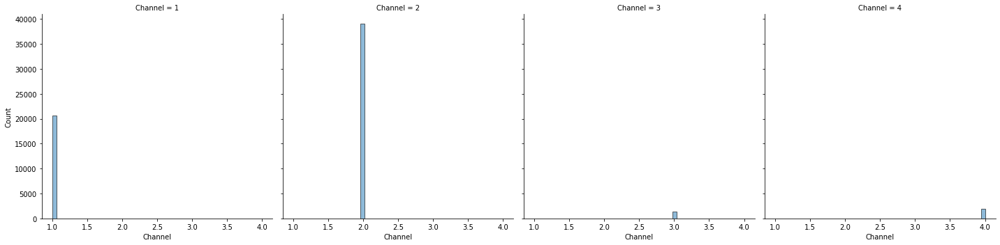

In [ ]:
for i in df:
  if i == "const":
        continue
  sns.displot(data=df, x=i, bins=50, kde=True, col='Channel')
  plt.show()

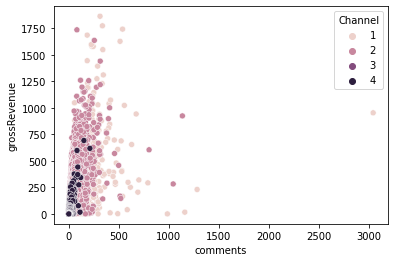

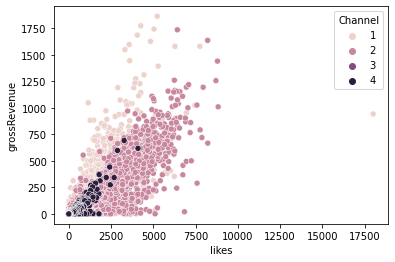

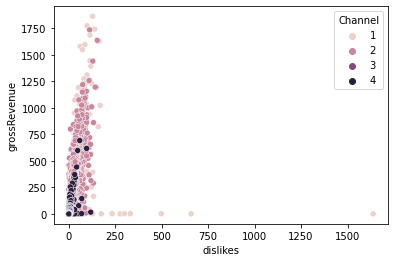

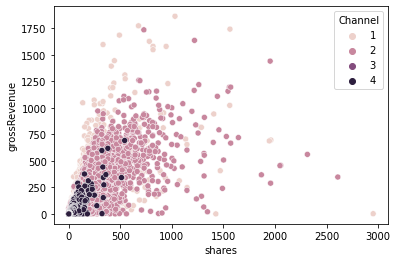

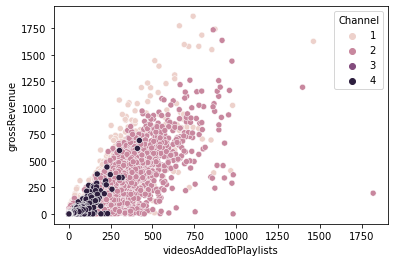

...

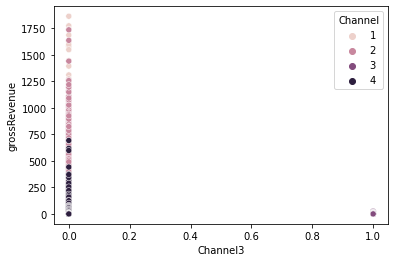

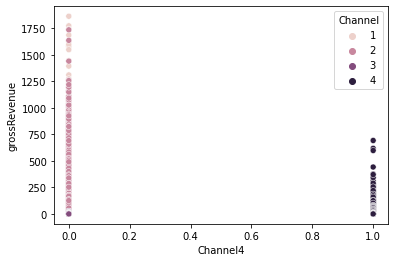

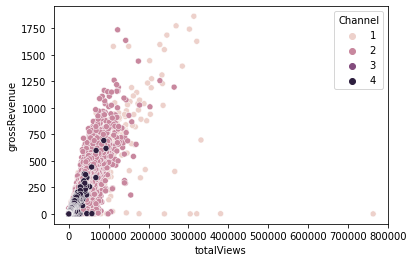

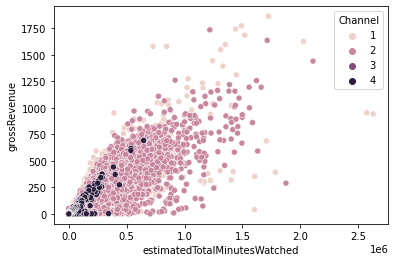

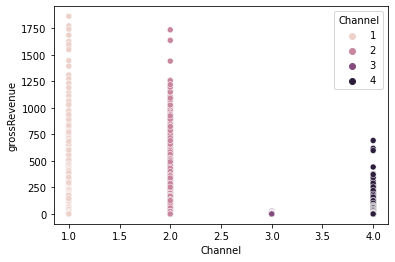

In [ ]:
for i in df.columns:
    if i == "const" or i == 'grossRevenue':
        continue
    sns.scatterplot(x=i,y='grossRevenue', data=df, hue='Channel')
    plt.show()

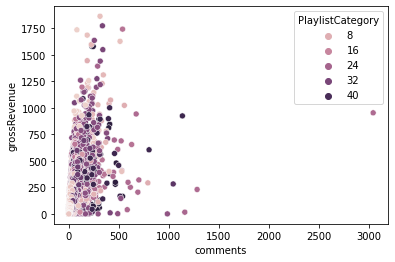

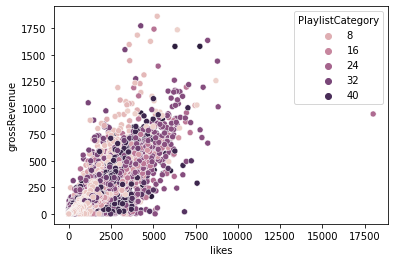

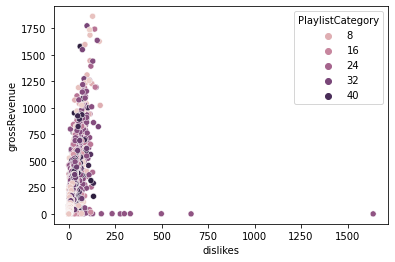

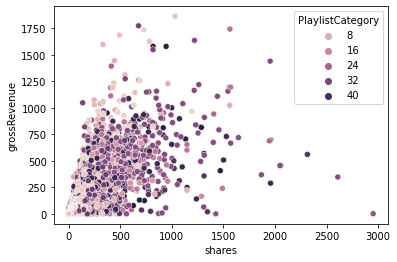

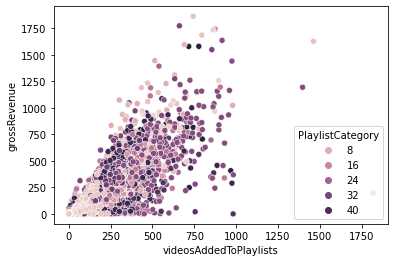

...

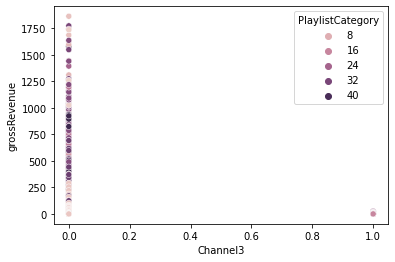

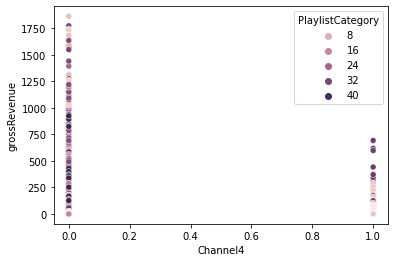

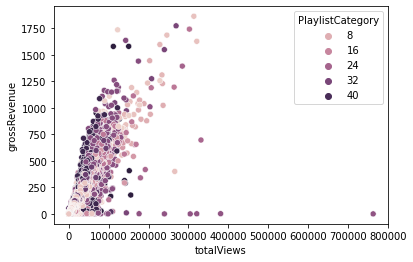

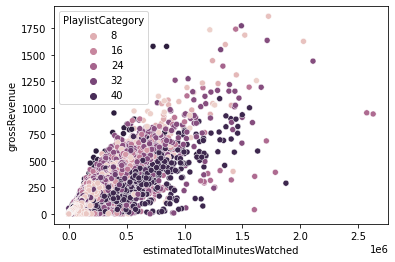

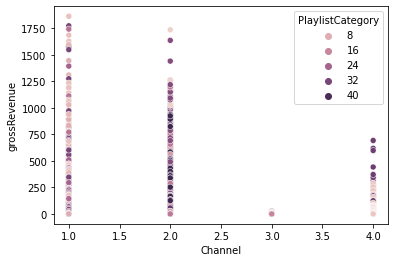

In [ ]:
for i in df.columns:
    if i == "const" or i == 'grossRevenue':
        continue
    sns.scatterplot(x=i,y='grossRevenue', data=df, hue='PlaylistCategory')
    plt.show()

# Baseline Model

In [ ]:
dummy_y = df['grossRevenue']
dummy_X = df.drop(['grossRevenue'], axis= 1)
dummy_regr = DummyRegressor(strategy="mean")
print(dummy_regr.fit(dummy_X, dummy_y))
print(f"R2: {dummy_regr.score(dummy_X, dummy_y)}")

DummyRegressor()
R2: 0.0


In [ ]:
dummy_y = df['grossRevenue']
dummy_X = df.drop(['grossRevenue'], axis= 1)
dummy_regr = DummyRegressor(strategy="median")
print(dummy_regr.fit(dummy_X, dummy_y))
print(f"R2: {dummy_regr.score(dummy_X, dummy_y)}")

DummyRegressor(strategy='median')
R2: -0.09302588554777991


# Split data into training and testing

In [ ]:
df_with_const = df
df_with_const['const'] = 1

In [ ]:
channel_2 = df.pop('Channel2')

In [ ]:
gross_revenue_col = df.pop('grossRevenue')
df.insert(0, 'grossRevenue', gross_revenue_col)
X = df.iloc[:, 1:]
y = df.iloc[:, 0]
X.pop('Channel')
X.pop('PlaylistCategory')

0        22.0
1        45.0
2        45.0
3        45.0
4        45.0
         ... 
62911     3.0
62912     3.0
62913     3.0
62914     3.0
62915     3.0
Name: PlaylistCategory, Length: 62916, dtype: float64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 0)
X_test = sm.add_constant(X_test)
X_train = sm.add_constant(X_train)

# Automated Model Selection

## Forward Model Selection

In [ ]:
# Code from Rumi
# Let's create a forward elimination function that will remove the features with the highest p-values, and store the results of AIC, BIC and R-squared Adj. in a dataframe
def forward_regression(X, y,
                       initial_list=[],
                       threshold_in=0.05,
                       threshold_out=0.05,
                       verbose=True):
    model_results = pd.DataFrame(
        columns=['Model', 'AIC', 'BIC', 'R-squared Adj.', 'features'])
    initial_list = []
    included = list(initial_list)
    model_num = 1
    while True:
        changed = False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, pd.DataFrame(X[included+[new_column]])).fit(cov_type='HC3')
            model_results.loc[len(model_results)] = [
                f'model {model_num}: {len(included)} feat', model.aic, model.bic, model.rsquared_adj, included+[new_column]]
            model_num+1

            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()

        if best_pval < threshold_in:
            # get the feature with the lowest p-value
            best_feature = new_pval.idxmin()
            # get the best feature and add it to the list
            included.append(best_feature)
            changed = True
            if verbose:
                print(f'Add with p-value {best_pval:.3f}: {best_feature}')

        if not changed:
            break

    return included, model_results

In [ ]:
forward_var, forward_results = forward_regression(X_train, y_train)
print(forward_var)
forward_results.sort_values(by=['BIC'], ascending=True)

<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: videosRemovedFromPlaylists


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: adImpressions


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: Channel1


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: Channel4


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: videosAddedToPlaylists


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: totalViews


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: dislikes


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: shares


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: Channel3


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: subscribersGained


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: comments


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.002: estimatedTotalMinutesWatched


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: const


<ipython-input-119-328506fec94e>:17: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


['videosRemovedFromPlaylists', 'adImpressions', 'Channel1', 'Channel4', 'videosAddedToPlaylists', 'totalViews', 'dislikes', 'shares', 'Channel3', 'subscribersGained', 'comments', 'estimatedTotalMinutesWatched', 'const']


,Model,AIC,BIC,R-squared Adj.,features
124,model 1: 11 feat,418676.557530,418782.474286,9.793243e-01,"[videosRemovedFromPlaylists, adImpressions, Ch..."
129,model 1: 12 feat,418669.867813,418784.610965,9.773893e-01,"[videosRemovedFromPlaylists, adImpressions, Ch..."
127,model 1: 12 feat,418676.038771,418790.781923,9.793250e-01,"[videosRemovedFromPlaylists, adImpressions, Ch..."
126,model 1: 12 feat,418676.038771,418790.781923,9.793250e-01,"[videosRemovedFromPlaylists, adImpressions, Ch..."
128,model 1: 12 feat,418677.583558,418792.326710,9.793243e-01,"[videosRemovedFromPlaylists, adImpressions, Ch..."
...,...,...,...,...,...
4,model 1: 0 feat,586838.050350,586846.876747,4.158127e-01,[CumulativeSubscribers]
10,model 1: 0 feat,609382.458286,609391.284683,3.330669e-15,[const]
8,model 1: 0 feat,612049.815813,612058.642209,3.596183e-02,[Channel1]
11,model 1: 0 feat,613853.148597,613861.974994,7.953163e-04,[Channel4]


## Backwards Model Selection

In [ ]:
# Code from Rumi
def backwardElimination(X, y, alpha=0.05):
    model_results = pd.DataFrame(
        columns=['Model', 'AIC', 'BIC', 'R-squared Adj.', 'features'])
    cols = list(X.columns)
    pmax = 1
    model_num = 1
    while (len(cols) > 0):
        p = []
        X_1 = X[cols]
        X_1 = sm.add_constant(X_1)
        model = sm.OLS(y, X_1).fit(cov_type='HC3')
        # Add AIC BIC And R-squared to the model_results dataframe
        model_results.loc[len(model_results)] = [
            f'model {model_num}: {len(cols)} feat', model.aic, model.bic, model.rsquared_adj, cols]
        model_num += 1
        p = pd.Series(model.pvalues.values[0:], index=cols)
        pmax = max(p)
        feature_with_p_max = p.idxmax()
        if(pmax > alpha):
            cols.remove(feature_with_p_max)
        else:
            break
    included = cols

    return included, model_results

In [ ]:
backward_var, backward_results = backwardElimination(X_train, y_train)
print(backward_var)
backward_results.sort_values(by=['BIC'], ascending=True)

['comments', 'dislikes', 'shares', 'videosAddedToPlaylists', 'videosRemovedFromPlaylists', 'subscribersGained', 'adImpressions', 'Channel1', 'Channel3', 'Channel4', 'totalViews', 'estimatedTotalMinutesWatched', 'const']


,Model,AIC,BIC,R-squared Adj.,features
3,model 4: 13 feat,418669.867813,418784.610965,0.977389,"[comments, dislikes, shares, videosAddedToPlay..."
1,model 2: 15 feat,418669.624482,418793.194031,0.977390,"[comments, dislikes, shares, videosAddedToPlay..."
2,model 3: 14 feat,418669.624482,418793.194031,0.977390,"[comments, dislikes, shares, videosAddedToPlay..."
0,model 1: 16 feat,418670.514814,418802.910759,0.977390,"[comments, dislikes, shares, videosAddedToPlay..."


##Stepwise Model Selection

In [ ]:
# Code from Rumi
def stepwise_regression(X, y,
                        initial_list=[],
                        threshold_in=0.05,
                        threshold_out=0.05,
                        verbose=True):
    model_results = pd.DataFrame(
        columns=['Model', 'AIC', 'BIC', 'R-squared Adj.', 'features'])
    included = list(initial_list)
    model_num = 1
    while True:
        changed = False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, pd.DataFrame(X[included+[new_column]])).fit()
            model_results.loc[len(model_results)] = [
                f'model {model_num}: {len(included)} feat', model.aic, model.bic, model.rsquared_adj, included+[new_column]]
            model_num+1
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            # get the feature with the lowest p-value
            best_feature = new_pval.idxmin()
            # get the best feature and add it to the list
            included.append(best_feature)
            changed = True
            if verbose:
                print(f'Add with p-value {best_pval:.3f}: {best_feature}')

        # backward step
        model = sm.OLS(y, pd.DataFrame(X[included])).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max()  # null if pvalues is empty
        if worst_pval > threshold_out:
            changed = True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print(f'Remove with p-value {worst_pval:.3f}: {worst_feature}')
        if not changed:
            break

    return included, model_results

In [ ]:
step_var, step_results = stepwise_regression(X_train, y_train)
print(step_var)
step_results.sort_values(by=['BIC'], ascending=True)

<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: videosRemovedFromPlaylists


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: shares


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: totalViews


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: likes


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: estimatedTotalMinutesWatched


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: adImpressions


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: videosAddedToPlaylists


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: dislikes


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: subscribersGained


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: Channel1
Remove with p-value 0.895: likes


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: comments


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.000: Channel4


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.001: const


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add with p-value 0.048: Channel3


<ipython-input-128-ea9c107f8d01>:15: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


['videosRemovedFromPlaylists', 'shares', 'totalViews', 'estimatedTotalMinutesWatched', 'adImpressions', 'videosAddedToPlaylists', 'dislikes', 'subscribersGained', 'Channel1', 'comments', 'Channel4', 'const', 'Channel3']


,Model,AIC,BIC,R-squared Adj.,features
131,model 1: 11 feat,418671.795104,418777.711861,9.773880e-01,"[videosRemovedFromPlaylists, shares, totalView..."
126,model 1: 10 feat,418681.159311,418778.249670,9.793220e-01,"[videosRemovedFromPlaylists, shares, totalView..."
129,model 1: 11 feat,418676.557530,418782.474286,9.793243e-01,"[videosRemovedFromPlaylists, shares, totalView..."
136,model 1: 12 feat,418669.867813,418784.610965,9.773893e-01,"[videosRemovedFromPlaylists, shares, totalView..."
134,model 1: 12 feat,418671.565816,418786.308968,9.773885e-01,"[videosRemovedFromPlaylists, shares, totalView..."
...,...,...,...,...,...
4,model 1: 0 feat,586838.050350,586846.876747,4.158127e-01,[CumulativeSubscribers]
10,model 1: 0 feat,609382.458286,609391.284683,3.330669e-15,[const]
8,model 1: 0 feat,612049.815813,612058.642209,3.596183e-02,[Channel1]
11,model 1: 0 feat,613853.148597,613861.974994,7.953163e-04,[Channel4]


# Fit Linear Model

In [ ]:
df.columns

Index(['grossRevenue', 'views', 'redViews', 'comments', 'likes', 'dislikes',
       'shares', 'videosAddedToPlaylists', 'videosRemovedFromPlaylists',
       'estimatedMinutesWatched', 'estimatedRedMinutesWatched',
       'subscribersGained', 'subscribersLost', 'adImpressions',
       'CumulativeSubscribers', 'Channel', 'PlaylistCategory', 'Channel1',
       'Channel2', 'Channel3', 'Channel4'],
      dtype='object')

## Full Model

In [ ]:
baseline_X_train = X_train
baseline_y_train = y_train

In [ ]:
baseline_X_train.columns

Index(['comments', 'likes', 'dislikes', 'shares', 'videosAddedToPlaylists',
       'videosRemovedFromPlaylists', 'subscribersGained', 'subscribersLost',
       'adImpressions', 'CumulativeSubscribers', 'Channel1', 'Channel3',
       'Channel4', 'totalViews', 'estimatedTotalMinutesWatched', 'const'],
      dtype='object')

In [ ]:
baseline_model = sm.OLS(baseline_y_train, baseline_X_train)
baseline_results = baseline_model.fit()
baseline_results.get_robustcov_results(cov_type='HC3').summary2()

/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 15, but rank is 14
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.977      
Dependent Variable:    grossRevenue        AIC:                   418670.5148
Date:                  2022-12-19 19:28    BIC:                   418802.9108
No. Observations:      50332               Log-Likelihood:        -2.0932e+05
Df Model:              14                  F-statistic:           1.267e+04  
Df Residuals:          50317               Prob (F-statistic):    0.00       
R-squared:             0.977               Scale:                 239.85     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
comments                      0.0443   0.0135   3.2756 0.0011  0.0178  0.0707
likes                         0.0005   0.0036   0.1246 0.9009 -0.0066  0.0075
dislikes                      0.7224   0.1040   6.9461 0.0000  0.5185  0.9262
shares                       -0.1017   0.0120  -8.4453 0.0000 -0.1253 -0.0781
videosAddedToPlaylists        0.2219   0.0342   6.4870 0.0000  0.1548  0.2889
videosRemovedFromPlaylists   -0.1625   0.0291  -5.5934 0.0000 -0.2194 -0.1056
subscribersGained             0.1582   0.0499   3.1694 0.0015  0.0604  0.2560
subscribersLost               0.1086   0.0967   1.1236 0.2612 -0.0808  0.2980
adImpressions                 0.0050   0.0001  69.6117 0.0000  0.0049  0.0051
CumulativeSubscribers         0.0496   0.0592   0.8377 0.4022 -0.0664  0.1656
Channel1                      2.9209   0.2183  13.3806 0.0000  2.4931  3.3488
Channel3                     -0.9506   0.1748  -5.4384 0.0000 -1.2932 -0.6080
Channel4                     -2.2131   0.3152  -7.0205 0.0000 -2.8309 -1.5952
totalViews                   -0.0020   0.0001 -13.7549 0.0000 -0.0023 -0.0017
estimatedTotalMinutesWatched  0.0000   0.0000   3.0599 0.0022  0.0000  0.0000
const                        -0.2771   0.0978  -2.8328 0.0046 -0.4688 -0.0854
-----------------------------------------------------------------------------
Omnibus:             45244.429     Durbin-Watson:        2.015               
Prob(Omnibus):       0.000         Jarque-Bera (JB):     18018743.010        
Skew:                3.470         Prob(JB):             0.000               
Kurtosis:            95.433        Condition No.:        40296306979345113088
=============================================================================
* The condition number is large (4e+19). This might indicate
strong multicollinearity or other numerical problems.
"""

In [ ]:
other_lm = ols("""grossRevenue ~ totalViews + comments + likes + dislikes + shares + videosAddedToPlaylists +
               videosRemovedFromPlaylists + subscribersGained + subscribersLost + adImpressions + CumulativeSubscribers +
               Channel1 + Channel3 + Channel4 + estimatedTotalMinutesWatched""",  data=df_with_const, hasconst=True).fit()
anova_table = sm.stats.anova_lm(other_lm, typ = 2)
anova_table

,sum_sq,df,F,PR(>F)
totalViews,2.074579e+06,1.0,8490.357128,0.000000e+00
comments,1.970847e+04,1.0,80.658280,2.755259e-19
likes,1.736965e+01,1.0,0.071087,7.897622e-01
dislikes,1.325721e+06,1.0,5425.605879,0.000000e+00
shares,4.184163e+05,1.0,1712.397611,0.000000e+00
videosAddedToPlaylists,3.153620e+05,1.0,1290.640588,8.474110e-280
videosRemovedFromPlaylists,1.693522e+05,1.0,693.085695,6.379359e-152
subscribersGained,1.131403e+04,1.0,46.303439,1.021896e-11
subscribersLost,1.422483e+02,1.0,0.582161,4.454693e-01
adImpressions,5.492411e+07,1.0,224780.709819,0.000000e+00


# Use Forward Selection Model

In [ ]:
X_train_rm = X_train.drop(['CumulativeSubscribers', 'likes', 'subscribersLost','Channel3', ], axis=1, errors='ignore')
X_test_rm = X_test.drop(['CumulativeSubscribers', 'likes', 'subscribersLost','Channel3', ], axis=1, errors='ignore')

In [ ]:
model = sm.OLS(y_train, X_train_rm)
results = model.fit()
results.get_robustcov_results(cov_type='HC3').summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.977      
Dependent Variable:    grossRevenue        AIC:                   418671.7951
Date:                  2022-12-19 20:30    BIC:                   418777.7119
No. Observations:      50332               Log-Likelihood:        -2.0932e+05
Df Model:              11                  F-statistic:           1.516e+04  
Df Residuals:          50320               Prob (F-statistic):    0.00       
R-squared:             0.977               Scale:                 239.87     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
comments                      0.0445   0.0131   3.4002 0.0007  0.0189  0.0702
dislikes                      0.7259   0.1020   7.1189 0.0000  0.5261  0.9258
shares                       -0.1013   0.0119  -8.4996 0.0000 -0.1247 -0.0779
videosAddedToPlaylists        0.2244   0.0229   9.8196 0.0000  0.1796  0.2692
videosRemovedFromPlaylists   -0.1619   0.0278  -5.8341 0.0000 -0.2163 -0.1075
subscribersGained             0.2063   0.0393   5.2458 0.0000  0.1292  0.2833
adImpressions                 0.0050   0.0001  74.1616 0.0000  0.0049  0.0051
Channel1                      2.9419   0.1558  18.8872 0.0000  2.6366  3.2471
Channel4                     -2.1519   0.3122  -6.8938 0.0000 -2.7638 -1.5401
totalViews                   -0.0020   0.0001 -14.3952 0.0000 -0.0022 -0.0017
estimatedTotalMinutesWatched  0.0000   0.0000   3.0730 0.0021  0.0000  0.0000
const                        -0.3087   0.0766  -4.0274 0.0001 -0.4589 -0.1585
-----------------------------------------------------------------------------
Omnibus:               45241.902        Durbin-Watson:           2.015       
Prob(Omnibus):         0.000            Jarque-Bera (JB):        18115420.996
Skew:                  3.468            Prob(JB):                0.000       
Kurtosis:              95.682           Condition No.:           761132      
=============================================================================
* The condition number is large (8e+05). This might indicate
strong multicollinearity or other numerical problems.
"""

## Test equality of coefficients for Channels

In [ ]:
# Test if videosAddedToPlaylists and videosRemovedFromPlaylists are =
hypotheses = 'videosRemovedFromPlaylists = videosAddedToPlaylists'
results.get_robustcov_results(cov_type='HC3').t_test(hypotheses, use_t=True)

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0            -0.3863      0.048     -8.108      0.000      -0.480      -0.293

In [ ]:
# Test if channels are the same (channel2 = 0)
hypotheses = 'Channel1 = Channel4 = 0'
results.get_robustcov_results(cov_type='HC3').t_test(hypotheses, use_t=True)

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             5.0938      0.331     15.396      0.000       4.445       5.742
c1            -2.1519      0.312     -6.894      0.000      -2.764      -1.540

In [ ]:
# Test if channels are the same
hypotheses = 'Channel1 = Channel4'
results.get_robustcov_results(cov_type='HC3').t_test(hypotheses, use_t=True)

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             5.0938      0.331     15.396      0.000       4.445       5.742

# Evaluate Regression Assumptions

### ei ~ N(0,sigma^2)

In [ ]:
fitted_val = results.predict()
train_resid = results.resid
influence = results.get_influence()
standardized_resids = influence.resid_studentized_internal
train_resid.mean()

1.9578250382791645e-12

/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Jarque-Bera test ---- statistic: 18341398.3210, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.3988, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3540, p-value: 0.0000
Anderson-Darling test ---- statistic: 10383.0232, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 


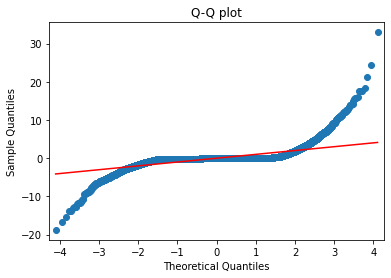

In [ ]:
def normality_of_residuals_test(resid):
    '''
    Function for drawing the normal QQ-plot of the residuals and running 4 statistical tests to
    investigate the normality of residuals.

    Arg:
    * model - fitted OLS models from statsmodels
    '''
    sm.ProbPlot(resid).qqplot(line='s')
    plt.title('Q-Q plot')

    jb = stats.jarque_bera(resid)
    sw = stats.shapiro(resid)
    ad = stats.anderson(resid, dist='norm')
    ks = stats.kstest(resid, 'norm')

    print(f'Jarque-Bera test ---- statistic: {jb[0]:.4f}, p-value: {jb[1]}')
    print(f'Shapiro-Wilk test ---- statistic: {sw[0]:.4f}, p-value: {sw[1]:.4f}')
    print(f'Kolmogorov-Smirnov test ---- statistic: {ks.statistic:.4f}, p-value: {ks.pvalue:.4f}')
    print(f'Anderson-Darling test ---- statistic: {ad.statistic:.4f}, 5% critical value: {ad.critical_values[2]:.4f}')
    print('If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. ')

normality_of_residuals_test(standardized_resids)

In [ ]:
def calculate_residuals(model, features, label):
    """
    Creates predictions on the features with the model and calculates residuals
    """
    predictions = model.predict(features)
    df_results = pd.DataFrame({'Actual': label, 'Predicted': predictions})
    df_results['Residuals'] = abs(df_results['Actual']) - abs(df_results['Predicted'])
    df_results.sort_values(by=["Residuals"], inplace = True)

    return df_results

calculate_residuals(results, X_train_rm, y_train)

,Actual,Predicted,Residuals
49678,656.293,945.880513,-289.587513
51766,1440.940,1695.810967,-254.870967
25008,624.824,860.005896,-235.181896
25000,1194.654,1405.256957,-210.602957
10074,387.447,597.599562,-210.152562
...,...,...,...
34796,970.515,697.350967,273.164033
183,768.725,485.637414,283.087586
30743,1735.964,1410.210412,325.753588
184,951.805,572.622709,379.182291


### Linearity & Constant Variance

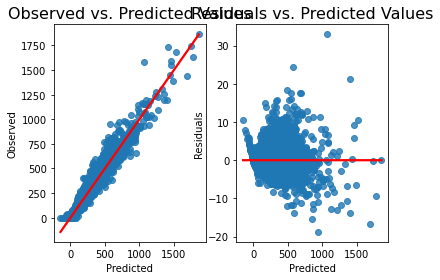

In [ ]:
%matplotlib inline
def linearity_test(fitted_vals, resids, y):
    '''
    Function for visually inspecting the assumption of linearity in a linear regression model.
    It plots observed vs. predicted values and residuals vs. predicted values.

    Args:
    * model - fitted OLS model from statsmodels
    * y - observed values
    '''

    fig, ax = plt.subplots(1,2)

    sns.regplot(x=fitted_vals, y=y, ax=ax[0], line_kws={'color': 'red'}, ci = False)
    ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
    ax[0].set(xlabel='Predicted', ylabel='Observed')

    sns.regplot(x=fitted_vals, y=resids, fit_reg= True,ax=ax[1], line_kws={'color': 'red'}, ci = False)
    ax[1].set_title('Residuals vs. Predicted Values', fontsize=16)
    ax[1].set(xlabel='Predicted', ylabel='Residuals')
    plt.show()

linearity_test(fitted_val, standardized_resids, y_train)

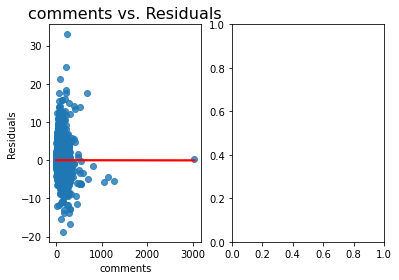

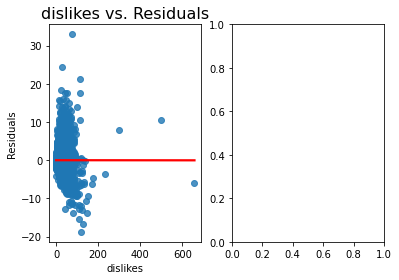

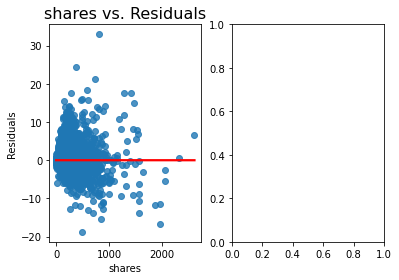

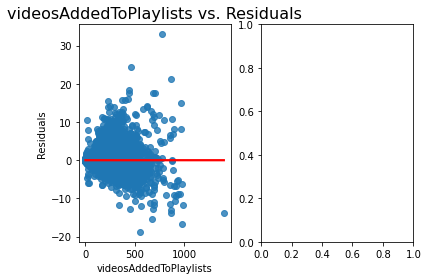

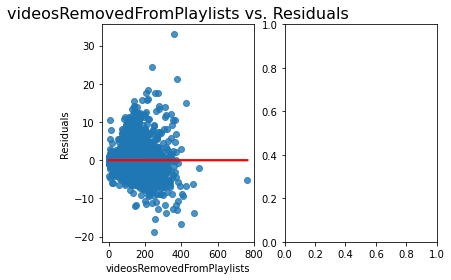

...

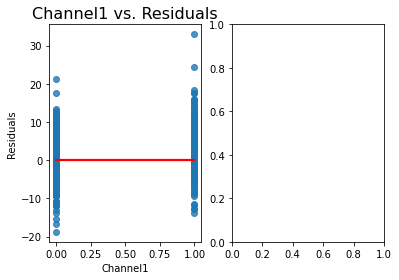

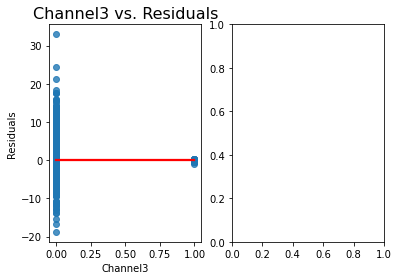

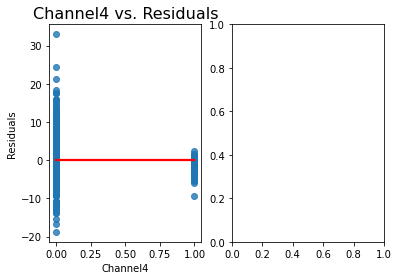

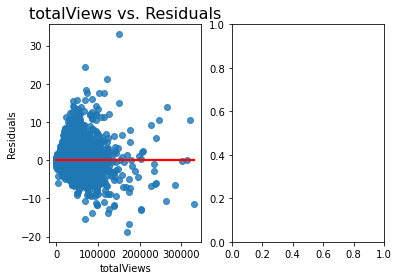

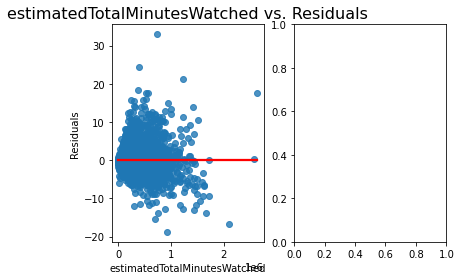

In [ ]:
for i in X_train_rm:
  if i == 'const':
    continue
  fig, ax = plt.subplots(1,2)
  sns.regplot(x=X_train_rm[i].values, y=standardized_resids, fit_reg= True, ax=ax[0], line_kws={'color': 'red'}, ci = False)
  ax[0].set_title(f'{i} vs. Residuals', fontsize=16)
  ax[0].set(xlabel=i, ylabel='Residuals')
  plt.show()

### Linear Independence of Predictor Variables

In [ ]:
X_train_rm.corr()

,comments,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,adImpressions,Channel1,Channel4,totalViews,estimatedTotalMinutesWatched,const
comments,1.000000,0.688426,0.713512,0.719167,0.700061,0.611312,0.709036,0.120002,-0.024415,0.745404,0.759869,NaN
dislikes,0.688426,1.000000,0.791908,0.824061,0.776374,0.681448,0.809845,0.036429,-0.012822,0.864099,0.842836,NaN
shares,0.713512,0.791908,1.000000,0.903671,0.825680,0.628215,0.838784,-0.001642,-0.018930,0.832688,0.844972,NaN
videosAddedToPlaylists,0.719167,0.824061,0.903671,1.000000,0.968328,0.612585,0.924509,0.011495,-0.022846,0.918085,0.904629,NaN
videosRemovedFromPlaylists,0.700061,0.776374,0.825680,0.968328,1.000000,0.571825,0.898582,0.035061,-0.029776,0.901956,0.858510,NaN
subscribersGained,0.611312,0.681448,0.628215,0.612585,0.571825,1.000000,0.697844,0.077151,0.033280,0.776182,0.674938,NaN
adImpressions,0.709036,0.809845,0.838784,0.924509,0.898582,0.697844,1.000000,0.018638,-0.021257,0.949249,0.911843,NaN
Channel1,0.120002,0.036429,-0.001642,0.011495,0.035061,0.077151,0.018638,1.000000,-0.125634,0.049811,0.023330,NaN
Channel4,-0.024415,-0.012822,-0.018930,-0.022846,-0.029776,0.033280,-0.021257,-0.125634,1.000000,-0.017570,-0.027829,NaN
totalViews,0.745404,0.864099,0.832688,0.918085,0.901956,0.776182,0.949249,0.049811,-0.017570,1.000000,0.899839,NaN


In [ ]:
vif = [variance_inflation_factor(X_train_rm.values, i) for i in range(X_train_rm.shape[1])]
pd.DataFrame({'vif': vif[0:]}, index=X_train_rm.columns)

,vif
comments,2.754859
dislikes,4.835009
shares,7.672886
videosAddedToPlaylists,45.139051
videosRemovedFromPlaylists,23.385972
subscribersGained,3.423910
adImpressions,14.566411
Channel1,1.059822
Channel4,1.025171
totalViews,22.592775


#### Test Whether Highly Correlated Coefficients are Similar

In [ ]:
hypotheses = 'videosAddedToPlaylists = videosRemovedFromPlaylists'
t_test = results.t_test(hypotheses)
t_test

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.3871      0.012     33.263      0.000       0.364       0.410

In [ ]:
hypothesis = ''
for index, i in enumerate(X_train_rm):
  for j in X_train_rm[index:]:
    if i == j:
      continue
    hypothesis = f'{i} = {j},'
    print(hypothesis)
    print(results.t_test(hypotheses))

const = comments,
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.3871      0.012     33.263      0.000       0.364       0.410
const = dislikes,
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.3871      0.012     33.263      0.000       0.364       0.410
const = shares,
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.3871      0.012     33.263      0.000       0.364       0.410


### Independence of Errors

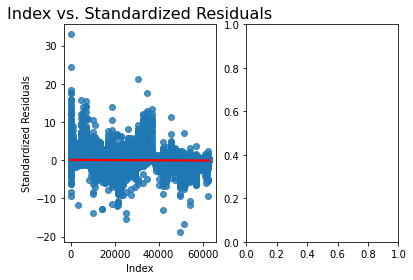

In [ ]:
#Independence of Errors

fig, ax = plt.subplots(1,2)
sns.regplot(x=X_train_rm.index, y=standardized_resids, fit_reg= True, ax=ax[0], line_kws={'color': 'red'}, ci = False)
ax[0].set_title(f'Index vs. Standardized Residuals', fontsize=16)
ax[0].set(xlabel='Index', ylabel='Standardized Residuals')
plt.show()

## Outliers, High Leverage Points, Influential Points

### Outliers

In [ ]:
sm.outlier_test(results, alpha=0.5)

In [ ]:
# Outliers
influence = results.get_influence()
standardized_resids = influence.resid_studentized_internal

len(standardized_resids[(abs(standardized_resids) > 2)])

2025

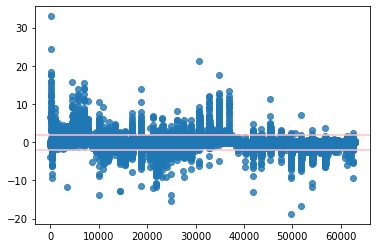

In [ ]:
# Outliers
graph = sns.regplot(x=X_train_rm.index, y=standardized_resids, ci = False)
graph.axhline(-2.0, color='pink')
graph.axhline(2.0, color='pink')
plt.show()

In [ ]:
outlier_index = []
for index, val in enumerate(standardized_resids):
  if abs(val) > 2.0:
    outlier_index.append(index)
len(outlier_index)

2025

In [ ]:
outlier_df = pd.DataFrame(columns=X_train_rm.columns)
for i in outlier_index:
  outlier_df = outlier_df.append(X_train_rm.iloc[[i]])
outlier_df = outlier_df.drop(['const'], axis = 1)

grossRevenue_val= []
for i in outlier_index:
  grossRevenue_val.append(y_train.iloc[[i]].values[0])

outlier_df['grossRevenue'] = grossRevenue_val
outlier_df = outlier_df.drop(['const'], axis=1, errors='ignore')
outlier_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
comments,2025.0,NaN,NaN,NaN,83.720988,82.136194,1.000,39.000,60.000,102.00,1282.000
dislikes,2025.0,NaN,NaN,NaN,30.321462,27.688113,0.000,16.000,24.000,37.00,658.000
shares,2025.0,NaN,NaN,NaN,262.695309,232.234928,14.000,129.000,194.000,307.00,2609.000
videosAddedToPlaylists,2025.0,NaN,NaN,NaN,295.880494,150.325209,16.000,194.000,266.000,360.00,1397.000
videosRemovedFromPlaylists,2025.0,NaN,NaN,NaN,152.108148,67.954630,3.000,105.000,141.000,189.00,764.000
subscribersGained,2025.0,NaN,NaN,NaN,48.226173,80.284968,1.000,12.000,24.000,50.00,924.000
adImpressions,2025.0,NaN,NaN,NaN,73023.324938,47578.219962,32.000,40152.000,62040.000,94995.00,368314.000
Channel1,2025.0,2.0,0.0,1220.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Channel4,2025.0,2.0,0.0,1996.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
totalViews,2025.0,NaN,NaN,NaN,47691.605926,32659.703845,2698.000,26673.000,40008.000,58274.00,331441.000


In [ ]:
X_train_rm.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
const,50332.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
comments,50332.0,8.512199,33.496610,0.0,0.0,0.0,0.0,3041.0
dislikes,50332.0,2.893733,9.993116,0.0,0.0,0.0,0.0,658.0
shares,50332.0,24.940952,88.197538,0.0,0.0,0.0,1.0,2609.0
videosAddedToPlaylists,50332.0,31.767762,89.824081,0.0,0.0,0.0,1.0,1397.0
videosRemovedFromPlaylists,50332.0,19.290372,47.318202,0.0,0.0,1.0,5.0,764.0
subscribersGained,50332.0,3.919336,22.001312,0.0,0.0,0.0,0.0,924.0
adImpressions,50332.0,6885.378984,22435.309143,1.0,4.0,14.0,136.0,427568.0
Channel1,50332.0,0.327803,0.469417,0.0,0.0,0.0,1.0,1.0
Channel3,50332.0,0.021060,0.143586,0.0,0.0,0.0,0.0,1.0


In [ ]:
no_outlier_X_train_rm = X_train_rm.drop(outlier_df.index)
no_outlier_y_train_rm = y_train.drop(outlier_df.index)

In [ ]:
temp_df = no_outlier_X_train_rm
temp_df['grossRevenue'] = no_outlier_y_train_rm
other_lm = ols("""grossRevenue ~ totalViews + estimatedTotalMinutesWatched + comments  + dislikes + shares +
videosAddedToPlaylists + videosRemovedFromPlaylists + subscribersGained + adImpressions + Channel1  + Channel4""",  data=temp_df, hasconst=True).fit()
other_lm.get_robustcov_results(cov_type='HC3').summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.995      
Dependent Variable:    grossRevenue        AIC:                   290814.5304
Date:                  2022-12-19 20:14    BIC:                   290919.9544
No. Observations:      48307               Log-Likelihood:        -1.4540e+05
Df Model:              11                  F-statistic:           8.122e+04  
Df Residuals:          48295               Prob (F-statistic):    0.00       
R-squared:             0.995               Scale:                 24.095     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
Intercept                     0.0103   0.0226   0.4543 0.6496 -0.0341  0.0547
totalViews                   -0.0018   0.0000 -42.3635 0.0000 -0.0019 -0.0017
estimatedTotalMinutesWatched  0.0000   0.0000  12.6640 0.0000  0.0000  0.0000
comments                      0.0398   0.0053   7.4607 0.0000  0.0293  0.0502
dislikes                      0.7692   0.0361  21.3229 0.0000  0.6985  0.8399
shares                       -0.0848   0.0038 -22.2855 0.0000 -0.0923 -0.0774
videosAddedToPlaylists        0.1695   0.0068  24.9645 0.0000  0.1562  0.1828
videosRemovedFromPlaylists   -0.1319   0.0080 -16.3959 0.0000 -0.1477 -0.1162
subscribersGained             0.1874   0.0128  14.6463 0.0000  0.1623  0.2124
adImpressions                 0.0049   0.0000 263.3003 0.0000  0.0049  0.0050
Channel1                      0.7802   0.0471  16.5539 0.0000  0.6879  0.8726
Channel4                     -1.3748   0.1254 -10.9614 0.0000 -1.6207 -1.1290
-----------------------------------------------------------------------------
Omnibus:               13957.236         Durbin-Watson:            1.983     
Prob(Omnibus):         0.000             Jarque-Bera (JB):         656256.364
Skew:                  0.633             Prob(JB):                 0.000     
Kurtosis:              21.012            Condition No.:            526905    
=============================================================================
* The condition number is large (5e+05). This might indicate
strong multicollinearity or other numerical problems.
"""

In [ ]:
results.get_robustcov_results(cov_type='HC3').summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.977      
Dependent Variable:    grossRevenue        AIC:                   418671.7951
Date:                  2022-12-19 20:14    BIC:                   418777.7119
No. Observations:      50332               Log-Likelihood:        -2.0932e+05
Df Model:              11                  F-statistic:           1.516e+04  
Df Residuals:          50320               Prob (F-statistic):    0.00       
R-squared:             0.977               Scale:                 239.87     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
comments                      0.0445   0.0131   3.4002 0.0007  0.0189  0.0702
dislikes                      0.7259   0.1020   7.1189 0.0000  0.5261  0.9258
shares                       -0.1013   0.0119  -8.4996 0.0000 -0.1247 -0.0779
videosAddedToPlaylists        0.2244   0.0229   9.8196 0.0000  0.1796  0.2692
videosRemovedFromPlaylists   -0.1619   0.0278  -5.8341 0.0000 -0.2163 -0.1075
subscribersGained             0.2063   0.0393   5.2458 0.0000  0.1292  0.2833
adImpressions                 0.0050   0.0001  74.1616 0.0000  0.0049  0.0051
Channel1                      2.9419   0.1558  18.8872 0.0000  2.6366  3.2471
Channel4                     -2.1519   0.3122  -6.8938 0.0000 -2.7638 -1.5401
totalViews                   -0.0020   0.0001 -14.3952 0.0000 -0.0022 -0.0017
estimatedTotalMinutesWatched  0.0000   0.0000   3.0730 0.0021  0.0000  0.0000
const                        -0.3087   0.0766  -4.0274 0.0001 -0.4589 -0.1585
-----------------------------------------------------------------------------
Omnibus:               45241.902        Durbin-Watson:           2.015       
Prob(Omnibus):         0.000            Jarque-Bera (JB):        18115420.996
Skew:                  3.468            Prob(JB):                0.000       
Kurtosis:              95.682           Condition No.:           761132      
=============================================================================
* The condition number is large (8e+05). This might indicate
strong multicollinearity or other numerical problems.
"""

### Influential Points

In [ ]:
# Cook's Distance
influence = results.get_influence()
cooks_d = influence.cooks_distance[0]
len(cooks_d[(abs(cooks_d) > 1)])

4

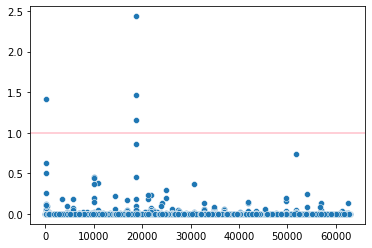

In [ ]:
graph = sns.scatterplot(x=X_train_rm.index, y=cooks_d, ci = False)
graph.axhline(1.0, color='pink')
plt.show()

In [ ]:
# DFFITSinfluence = results.get_influence()
dffits = influence.dffits[0]
dffits_cutoff = 2 *math.sqrt( ( len(X_train_rm.columns) / (len(X_train_rm) - len(X_train_rm.columns)) ) )
dffits_cutoff

0.032146646235748505

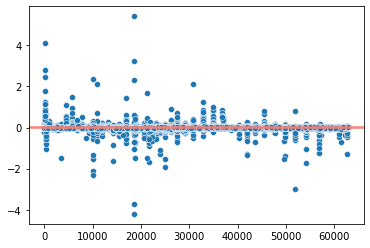

In [ ]:
graph = sns.scatterplot(x=X_train_rm.index, y=dffits, ci = False)
graph.axhline(dffits_cutoff, color='salmon')
graph.axhline(-1.0 * dffits_cutoff, color='salmon')
# graph.axhline(2.0, color='lightpink')
# graph.axhline(-2.0, color='lightpink')
plt.show()

In [ ]:
influential_pt = []
for index, val in enumerate(cooks_d):
  if abs(val) > 1.0:
    influential_pt.append(index)
len(influential_pt)

4

In [ ]:
inf_df = pd.DataFrame(columns=X_train_rm.columns)
for i in influential_pt:
  inf_df = inf_df.append(X_train_rm.iloc[[i]])
inf_df = inf_df.drop(['const'], axis = 1)

grossRevenue_val= []
for i in influential_pt:
  grossRevenue_val.append(y_train.iloc[[i]].values[0])

inf_df['grossRevenue'] = grossRevenue_val
inf_df = inf_df.drop(['const'], axis=1, errors='ignore')
inf_df

,comments,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,adImpressions,Channel1,Channel4,totalViews,estimatedTotalMinutesWatched,grossRevenue
18654,293.0,658.0,127.0,26.0,24.0,305.0,41.0,1,0,239743.0,187258.0,0.259
172,673.0,114.0,1406.0,684.0,256.0,520.0,127440.0,1,0,114285.0,2628919.0,942.441
18649,69.0,498.0,186.0,18.0,5.0,621.0,514.0,1,0,320837.0,260242.0,1.328
18648,455.0,75.0,1960.0,850.0,204.0,396.0,278544.0,1,0,331441.0,417842.0,696.933


In [ ]:
no_inf_X_train_rm = X_train_rm.drop(inf_df.index)
no_inf_y_train_rm = y_train.drop(inf_df.index)

In [ ]:
temp_df = no_inf_X_train_rm
temp_df['grossRevenue'] = no_inf_y_train_rm
other_lm = ols("""grossRevenue ~  comments  + dislikes + shares +
videosAddedToPlaylists + videosRemovedFromPlaylists + subscribersGained + adImpressions + Channel1  + Channel4+ totalViews + estimatedTotalMinutesWatched""",  data=temp_df, hasconst=True).fit()
other_lm.get_robustcov_results(cov_type='HC3').summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.978      
Dependent Variable:    grossRevenue        AIC:                   418084.4103
Date:                  2022-12-19 20:15    BIC:                   418190.3261
No. Observations:      50328               Log-Likelihood:        -2.0903e+05
Df Model:              11                  F-statistic:           1.553e+04  
Df Residuals:          50316               Prob (F-statistic):    0.00       
R-squared:             0.978               Scale:                 237.24     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
Intercept                    -0.2893   0.0726  -3.9868 0.0001 -0.4315 -0.1471
comments                      0.0466   0.0130   3.5905 0.0003  0.0212  0.0721
dislikes                      0.7009   0.1011   6.9325 0.0000  0.5027  0.8990
shares                       -0.1002   0.0115  -8.7005 0.0000 -0.1228 -0.0776
videosAddedToPlaylists        0.2302   0.0223  10.3281 0.0000  0.1865  0.2738
videosRemovedFromPlaylists   -0.1761   0.0259  -6.8026 0.0000 -0.2269 -0.1254
subscribersGained             0.1873   0.0375   4.9977 0.0000  0.1139  0.2608
adImpressions                 0.0050   0.0001  76.8634 0.0000  0.0049  0.0051
Channel1                      2.9747   0.1549  19.2045 0.0000  2.6711  3.2783
Channel4                     -2.0920   0.3060  -6.8359 0.0000 -2.6919 -1.4922
totalViews                   -0.0019   0.0001 -15.2314 0.0000 -0.0022 -0.0017
estimatedTotalMinutesWatched  0.0000   0.0000   2.7458 0.0060  0.0000  0.0000
-----------------------------------------------------------------------------
Omnibus:               45152.323        Durbin-Watson:           2.015       
Prob(Omnibus):         0.000            Jarque-Bera (JB):        17814825.879
Skew:                  3.460            Prob(JB):                0.000       
Kurtosis:              94.910           Condition No.:           758070      
=============================================================================
* The condition number is large (8e+05). This might indicate
strong multicollinearity or other numerical problems.
"""

In [ ]:
results.get_robustcov_results(cov_type='HC3').summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.977      
Dependent Variable:    grossRevenue        AIC:                   418671.7951
Date:                  2022-12-19 20:15    BIC:                   418777.7119
No. Observations:      50332               Log-Likelihood:        -2.0932e+05
Df Model:              11                  F-statistic:           1.516e+04  
Df Residuals:          50320               Prob (F-statistic):    0.00       
R-squared:             0.977               Scale:                 239.87     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
comments                      0.0445   0.0131   3.4002 0.0007  0.0189  0.0702
dislikes                      0.7259   0.1020   7.1189 0.0000  0.5261  0.9258
shares                       -0.1013   0.0119  -8.4996 0.0000 -0.1247 -0.0779
videosAddedToPlaylists        0.2244   0.0229   9.8196 0.0000  0.1796  0.2692
videosRemovedFromPlaylists   -0.1619   0.0278  -5.8341 0.0000 -0.2163 -0.1075
subscribersGained             0.2063   0.0393   5.2458 0.0000  0.1292  0.2833
adImpressions                 0.0050   0.0001  74.1616 0.0000  0.0049  0.0051
Channel1                      2.9419   0.1558  18.8872 0.0000  2.6366  3.2471
Channel4                     -2.1519   0.3122  -6.8938 0.0000 -2.7638 -1.5401
totalViews                   -0.0020   0.0001 -14.3952 0.0000 -0.0022 -0.0017
estimatedTotalMinutesWatched  0.0000   0.0000   3.0730 0.0021  0.0000  0.0000
const                        -0.3087   0.0766  -4.0274 0.0001 -0.4589 -0.1585
-----------------------------------------------------------------------------
Omnibus:               45241.902        Durbin-Watson:           2.015       
Prob(Omnibus):         0.000            Jarque-Bera (JB):        18115420.996
Skew:                  3.468            Prob(JB):                0.000       
Kurtosis:              95.682           Condition No.:           761132      
=============================================================================
* The condition number is large (8e+05). This might indicate
strong multicollinearity or other numerical problems.
"""

### High Leverage

In [ ]:
leverages = influence.hat_matrix_diag
leverage_cutoff = 2 * len(X_train_rm.columns) / len(X_train_rm) # 2(p+1) / n
print(leverage_cutoff)
leverages

0.00047683382341254075


array([3.60595464e-05, 3.53115729e-05, 3.49146687e-05, ...,
       3.49691484e-05, 3.49632938e-05, 1.31877394e-04])

In [ ]:
hi_leverage = []
for index, val in enumerate(leverages):
  if abs(val) > leverage_cutoff:
    hi_leverage.append(index)
print(leverage_cutoff)
len(hi_leverage)

0.00047683382341254075


4685

In [ ]:
hii_df = pd.DataFrame(columns=X_train_rm.columns)
for i in hi_leverage:
  hii_df = hii_df.append(X_train_rm.iloc[[i]])
hii_df = hii_df.drop(['const'], axis = 1)

grossRevenue_val= []
for i in hi_leverage:
  grossRevenue_val.append(y_train.iloc[[i]].values[0])

hii_df['grossRevenue'] = grossRevenue_val
hii_df = hii_df.drop(['const'], axis=1, errors='ignore')
hii_df

,comments,dislikes,shares,videosAddedToPlaylists,videosRemovedFromPlaylists,subscribersGained,adImpressions,Channel1,Channel4,totalViews,estimatedTotalMinutesWatched,grossRevenue
61335,13.0,4.0,45.0,87.0,38.0,13.0,19775.0,0,1,9486.0,84034.0,103.384
0,3041.0,99.0,920.0,669.0,275.0,359.0,165866.0,1,0,125425.0,2573425.0,953.390
15493,130.0,37.0,159.0,310.0,208.0,86.0,115128.0,1,0,75869.0,520884.0,422.028
17017,94.0,11.0,82.0,157.0,120.0,9.0,21264.0,1,0,18051.0,100015.0,90.101
43769,24.0,9.0,137.0,219.0,155.0,6.0,32527.0,0,0,24563.0,184682.0,132.045
...,...,...,...,...,...,...,...,...,...,...,...,...
45444,161.0,95.0,1544.0,887.0,372.0,233.0,228433.0,0,0,120297.0,1434904.0,1157.219
61713,9.0,5.0,67.0,47.0,29.0,5.0,8305.0,0,1,7629.0,34098.0,33.051
18676,388.0,37.0,276.0,278.0,170.0,131.0,148031.0,1,0,106048.0,589684.0,711.176
16921,97.0,23.0,131.0,223.0,163.0,19.0,62560.0,1,0,43631.0,313699.0,297.167


In [ ]:
hii_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
comments,4685.0,NaN,NaN,NaN,61.788901,87.365559,0.0,3.000,44.000,88.000,3041.000
dislikes,4685.0,NaN,NaN,NaN,20.920589,24.201146,0.0,1.000,18.000,31.000,658.000
shares,4685.0,NaN,NaN,NaN,183.271932,215.948842,0.0,10.000,149.000,258.000,2609.000
videosAddedToPlaylists,4685.0,NaN,NaN,NaN,206.919317,178.834145,0.0,16.000,213.000,320.000,1397.000
videosRemovedFromPlaylists,4685.0,NaN,NaN,NaN,107.318890,88.393509,0.0,11.000,110.000,170.000,764.000
subscribersGained,4685.0,NaN,NaN,NaN,33.158805,64.111926,0.0,2.000,16.000,37.000,924.000
adImpressions,4685.0,NaN,NaN,NaN,48739.365635,50980.432729,1.0,915.000,38791.000,78572.000,427568.000
Channel1,4685.0,2.0,0.0,3507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Channel4,4685.0,2.0,0.0,3107.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
totalViews,4685.0,NaN,NaN,NaN,33369.725080,33635.814394,1.0,2208.000,29358.000,50120.000,331441.000


In [ ]:
X_train_rm.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
comments,50332.0,8.512199,33.496610,0.0,0.0,0.0,0.0,3041.0
dislikes,50332.0,2.893733,9.993116,0.0,0.0,0.0,0.0,658.0
shares,50332.0,24.940952,88.197538,0.0,0.0,0.0,1.0,2609.0
videosAddedToPlaylists,50332.0,31.767762,89.824081,0.0,0.0,0.0,1.0,1397.0
videosRemovedFromPlaylists,50332.0,19.290372,47.318202,0.0,0.0,1.0,5.0,764.0
subscribersGained,50332.0,3.919336,22.001312,0.0,0.0,0.0,0.0,924.0
adImpressions,50332.0,6885.378984,22435.309143,1.0,4.0,14.0,136.0,427568.0
Channel1,50332.0,0.327803,0.469417,0.0,0.0,0.0,1.0,1.0
Channel4,50332.0,0.031352,0.174268,0.0,0.0,0.0,0.0,1.0
totalViews,50332.0,4676.518855,14965.131669,1.0,4.0,14.0,119.0,331441.0


In [ ]:
no_hii_X_train_rm = X_train_rm.drop(hii_df.index)
no_hii_y_train_rm = y_train.drop(hii_df.index)

In [ ]:
temp_df = no_hii_X_train_rm
temp_df['grossRevenue'] = no_hii_y_train_rm
other_lm = ols("""grossRevenue ~  comments  + dislikes + shares +
videosAddedToPlaylists + videosRemovedFromPlaylists + subscribersGained + adImpressions + Channel1  + Channel4+ totalViews + estimatedTotalMinutesWatched""",  data=temp_df, hasconst=True).fit()
other_lm.get_robustcov_results(cov_type='HC3').summary2()

/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 11, but rank is 10
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.973      
Dependent Variable:    grossRevenue        AIC:                   313326.5457
Date:                  2022-12-19 20:19    BIC:                   313422.5613
No. Observations:      45647               Log-Likelihood:        -1.5665e+05
Df Model:              10                  F-statistic:           1.203e+04  
Df Residuals:          45636               Prob (F-statistic):    0.00       
R-squared:             0.973               Scale:                 56.037     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
Intercept                    -0.1668   0.0364  -4.5804 0.0000 -0.2381 -0.0954
comments                      0.1170   0.0254   4.6037 0.0000  0.0672  0.1668
dislikes                      1.1699   0.1082  10.8163 0.0000  0.9579  1.3819
shares                       -0.0101   0.0169  -0.5981 0.5498 -0.0433  0.0230
videosAddedToPlaylists        0.0938   0.0178   5.2729 0.0000  0.0589  0.1286
videosRemovedFromPlaylists   -0.1364   0.0160  -8.5254 0.0000 -0.1678 -0.1051
subscribersGained             1.2028   0.0940  12.7912 0.0000  1.0185  1.3871
adImpressions                 0.0062   0.0001  61.6520 0.0000  0.0060  0.0064
Channel1                      1.2123   0.0591  20.5038 0.0000  1.0964  1.3282
Channel4                      0.0000   0.0000   1.4331 0.1518 -0.0000  0.0000
totalViews                   -0.0036   0.0002 -21.9185 0.0000 -0.0040 -0.0033
estimatedTotalMinutesWatched -0.0000   0.0000  -0.9122 0.3617 -0.0000  0.0000
-----------------------------------------------------------------------------
Omnibus:            38517.778    Durbin-Watson:       1.995                  
Prob(Omnibus):      0.000        Jarque-Bera (JB):    12183310.223           
Skew:               3.156        Prob(JB):            0.000                  
Kurtosis:           82.786       Condition No.:       29311523955879731789824
=============================================================================
* The condition number is large (3e+22). This might indicate
strong multicollinearity or other numerical problems.
"""

In [ ]:
results.get_robustcov_results(cov_type='HC3').summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.977      
Dependent Variable:    grossRevenue        AIC:                   418671.7951
Date:                  2022-12-19 20:19    BIC:                   418777.7119
No. Observations:      50332               Log-Likelihood:        -2.0932e+05
Df Model:              11                  F-statistic:           1.516e+04  
Df Residuals:          50320               Prob (F-statistic):    0.00       
R-squared:             0.977               Scale:                 239.87     
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
comments                      0.0445   0.0131   3.4002 0.0007  0.0189  0.0702
dislikes                      0.7259   0.1020   7.1189 0.0000  0.5261  0.9258
shares                       -0.1013   0.0119  -8.4996 0.0000 -0.1247 -0.0779
videosAddedToPlaylists        0.2244   0.0229   9.8196 0.0000  0.1796  0.2692
videosRemovedFromPlaylists   -0.1619   0.0278  -5.8341 0.0000 -0.2163 -0.1075
subscribersGained             0.2063   0.0393   5.2458 0.0000  0.1292  0.2833
adImpressions                 0.0050   0.0001  74.1616 0.0000  0.0049  0.0051
Channel1                      2.9419   0.1558  18.8872 0.0000  2.6366  3.2471
Channel4                     -2.1519   0.3122  -6.8938 0.0000 -2.7638 -1.5401
totalViews                   -0.0020   0.0001 -14.3952 0.0000 -0.0022 -0.0017
estimatedTotalMinutesWatched  0.0000   0.0000   3.0730 0.0021  0.0000  0.0000
const                        -0.3087   0.0766  -4.0274 0.0001 -0.4589 -0.1585
-----------------------------------------------------------------------------
Omnibus:               45241.902        Durbin-Watson:           2.015       
Prob(Omnibus):         0.000            Jarque-Bera (JB):        18115420.996
Skew:                  3.468            Prob(JB):                0.000       
Kurtosis:              95.682           Condition No.:           761132      
=============================================================================
* The condition number is large (8e+05). This might indicate
strong multicollinearity or other numerical problems.
"""

### Remove Influential Points

In [ ]:
X_train_rm = no_inf_X_train_rm
y_train_rm = no_inf_y_train_rm
X_train_rm.reset_index(drop=True, inplace=True)
y_train_rm.reset_index(drop=True, inplace=True)
X_train_rm.drop(['grossRevenue'], inplace=True, axis =1, errors='ignore')
X_test_rm.drop(['grossRevenue'], inplace=True, axis =1, errors='ignore')

# Test Transformations

In [ ]:
%matplotlib inline
def linearity_test(fitted_vals, resids, y):
    '''
    Function for visually inspecting the assumption of linearity in a linear regression model.
    It plots observed vs. predicted values and residuals vs. predicted values.

    Args:
    * model - fitted OLS model from statsmodels
    * y - observed values
    '''
    # fitted_vals = model.predict()
    # resids = model.resid

    fig, ax = plt.subplots(1,2)

    sns.regplot(x=fitted_vals, y=y, ax=ax[0], line_kws={'color': 'red'}, ci = False)
    ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
    ax[0].set(xlabel='Predicted', ylabel='Observed')

    sns.regplot(x=fitted_vals, y=resids, fit_reg= True,ax=ax[1], line_kws={'color': 'red'}, ci = False)
    ax[1].set_title('Residuals vs. Predicted Values', fontsize=16)
    ax[1].set(xlabel='Predicted', ylabel='Residuals')
    plt.show()

In [ ]:
def test_normality_homoscedasticity(y_train, X_train, results=None):
  if results == None:
    model = sm.OLS(y_train, X_train)
    results = model.fit()
    results.summary2()
  print(f"R^2 adj: {results.rsquared_adj}")
  print(f"BIC: {results.bic}")
  print(f"MSE: {results.mse_model}")
  fitted_val = results.predict()
  # train_resid = results.resid

  influence = results.get_influence()
  standardized_resids = influence.resid_studentized_internal

  jb = stats.jarque_bera(standardized_resids)
  sw = stats.shapiro(standardized_resids)
  ks = stats.kstest(standardized_resids, 'norm')
  ad = stats.anderson(standardized_resids, dist='norm')
  print(f'Jarque-Bera test ---- statistic: {jb[0]:.4f}, p-value: {jb[1]}')
  print(f'Shapiro-Wilk test ---- statistic: {sw[0]:.4f}, p-value: {sw[1]:.4f}')
  print(f'Kolmogorov-Smirnov test ---- statistic: {ks.statistic:.4f}, p-value: {ks.pvalue:.4f}')
  print(f'Anderson-Darling test ---- statistic: {ad.statistic:.4f}, 5% critical value: {ad.critical_values[2]:.4f}')
  print('If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. ')


  try:
    bp_test = het_breuschpagan(standardized_resids, X_train)
    labels = ['LM Statistic', 'LM-Test p-value', 'F-Statistic', 'F-Test p-value']
    print(dict(zip(labels, bp_test)))
    print('If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. ')
  except Exception:
    pass

  sm.ProbPlot(standardized_resids).qqplot(line='s')
  plt.title('Q-Q plot')
  plt.show()

  try:
    linearity_test(fitted_val, standardized_resids, y_train)
    plt.show()
  except Exception:
    pass

  for i in X_train:
    if i == 'const':
      continue
    fig, ax = plt.subplots(1,2)
    sns.regplot(x=X_train[i].values, y=standardized_resids, fit_reg= True, ax=ax[0], line_kws={'color': 'red'}, ci = False)
    ax[0].set_title(f'{i} vs. Residuals', fontsize=16)
    ax[0].set(xlabel=i, ylabel='Residuals')
    plt.show()

## Original

R^2 adj: 0.9775850850992638
BIC: 418197.30648306763
MSE: 43391562.271725245
Jarque-Bera test ---- statistic: 18012763.9129, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.4018, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3525, p-value: 0.0000
Anderson-Darling test ---- statistic: 10318.5222, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 10909.296806153756, 'LM-Test p-value': 0.0, 'F-Statistic': 1160.407844347258, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


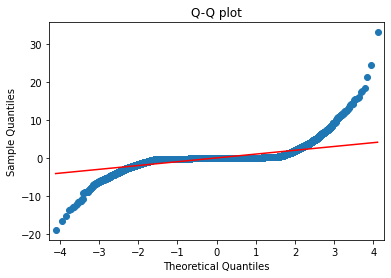

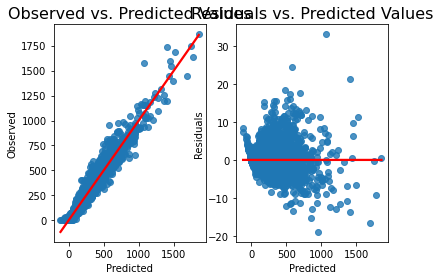

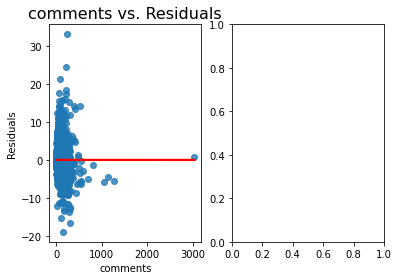

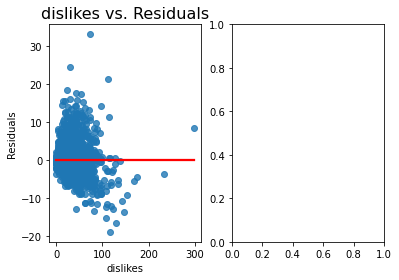

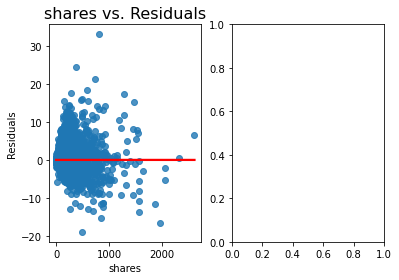

...

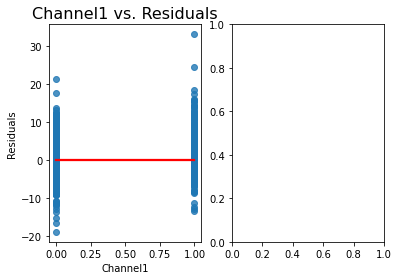

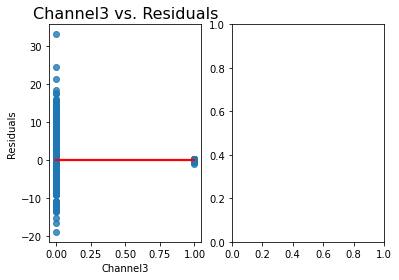

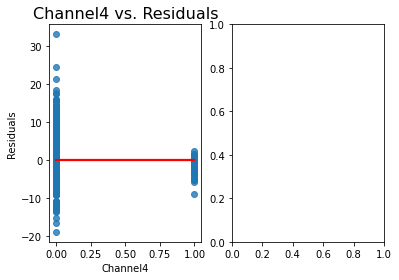

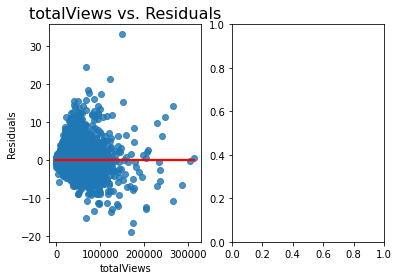

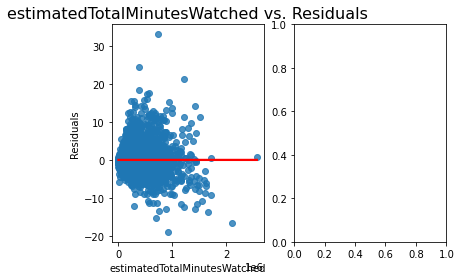

In [ ]:
# Original
test_normality_homoscedasticity(y_train_rm, X_train_rm)

In [ ]:
origin_X_train_rm = X_train_rm

## Transformations that Work

R^2 adj: 0.9611997586818776
BIC: 100947.24535653772
MSE: 45095.03691060588


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Jarque-Bera test ---- statistic: 22193.8909, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.9615, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.0666, p-value: 0.0000
Anderson-Darling test ---- statistic: 484.6434, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 4061.277774621163, 'LM-Test p-value': 0.0, 'F-Statistic': 368.0528563536589, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


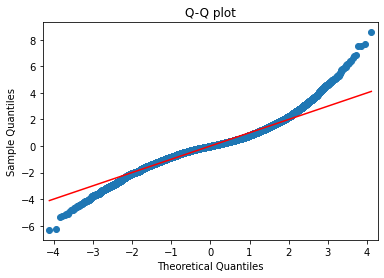

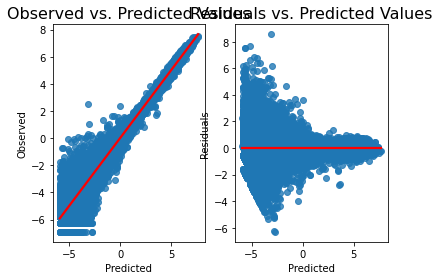

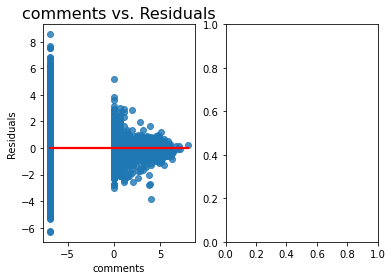

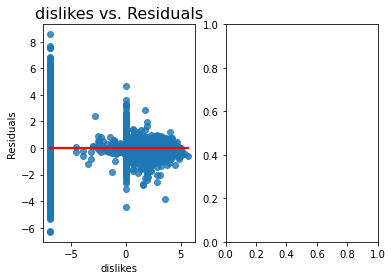

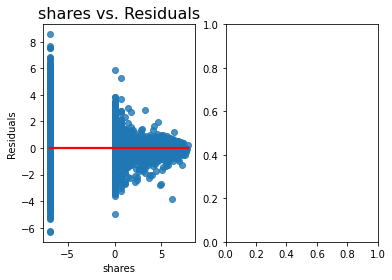

...

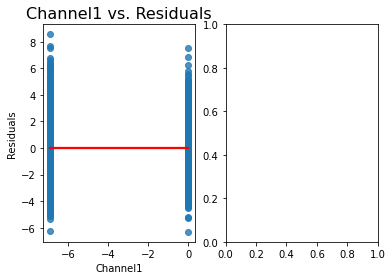

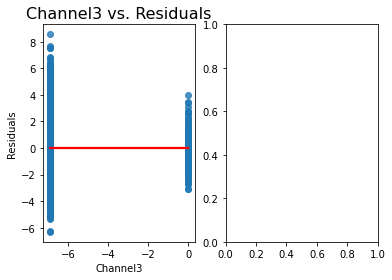

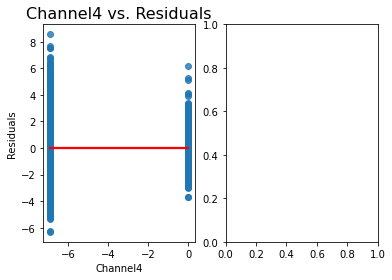

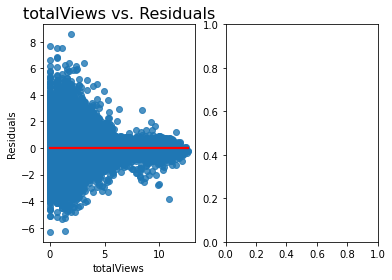

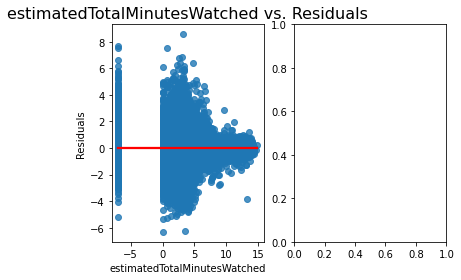

In [ ]:
# Best normal assumption satisified
# Best constant variance assumption satisfied (according to the test, not the graph)
temp_X_rm = np.log(X_train_rm + 0.001)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.log(y_train_rm + 0.001), temp_X_rm)

R^2 adj: 0.9941681302575598
BIC: -50322.59560144901
MSE: 15362.0056901684
Jarque-Bera test ---- statistic: 237678.3989, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8598, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1115, p-value: 0.0000
Anderson-Darling test ---- statistic: 1597.5578, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 10227.943818584466, 'LM-Test p-value': 0.0, 'F-Statistic': 1069.4477810369813, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


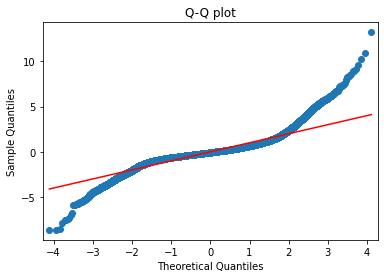

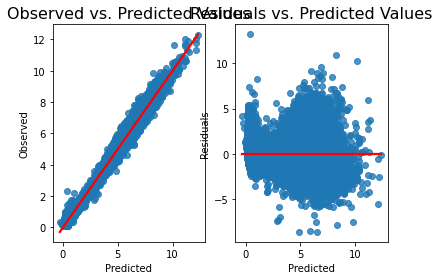

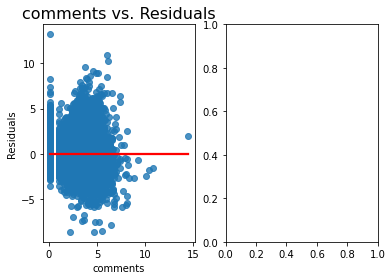

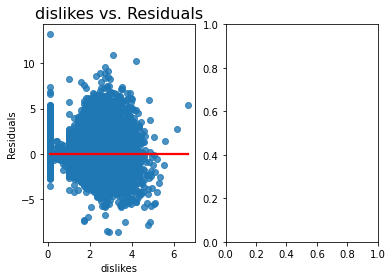

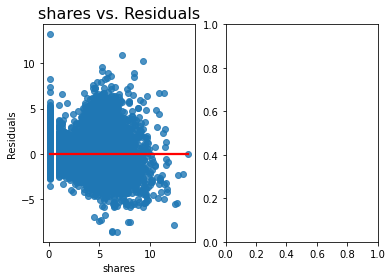

...

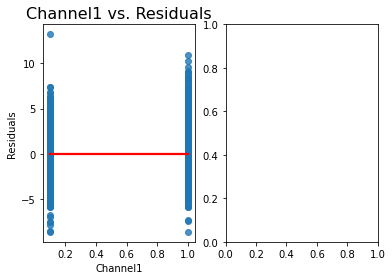

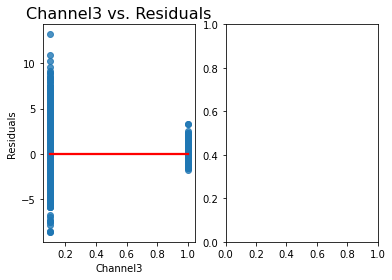

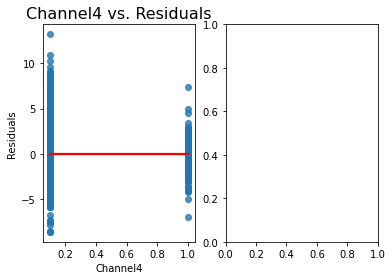

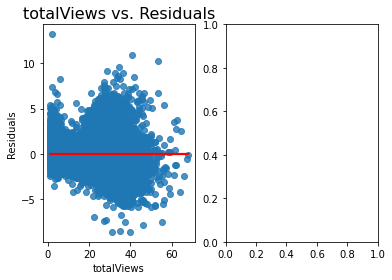

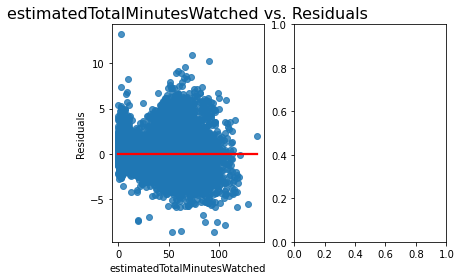

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, 1/3)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm + 0.001, 1/3), temp_X_rm)

R^2 adj: 0.9921851832426088
BIC: 63215.61502854762
MSE: 109200.14940131258
Jarque-Bera test ---- statistic: 1372911.5806, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.6292, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.2333, p-value: 0.0000
Anderson-Darling test ---- statistic: 5849.4399, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 12686.043849324533, 'LM-Test p-value': 0.0, 'F-Statistic': 1413.0914046278247, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


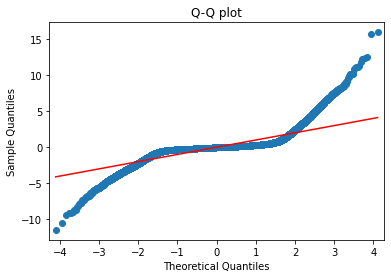

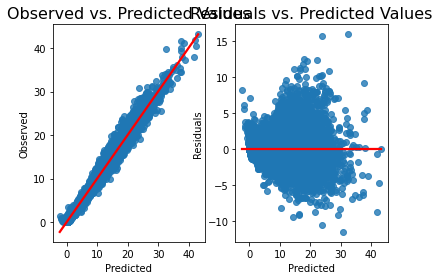

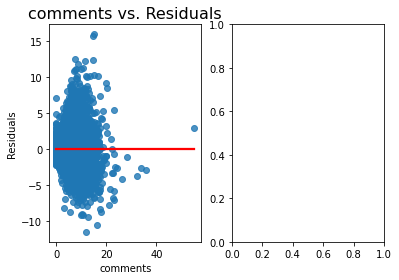

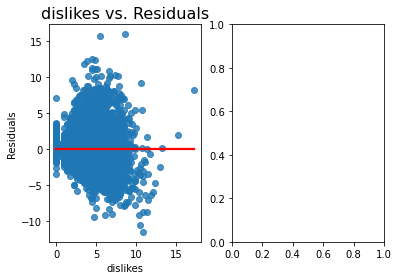

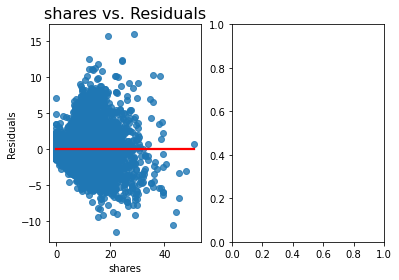

...

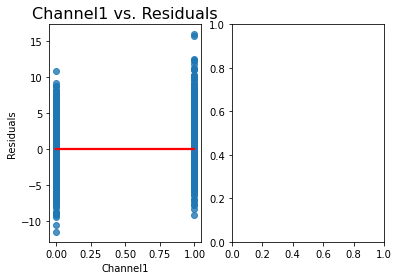

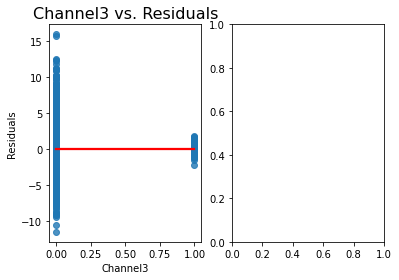

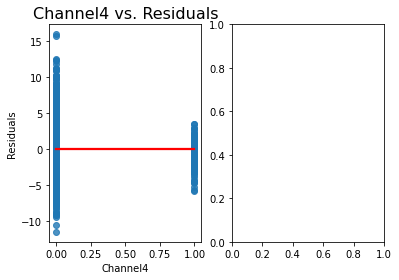

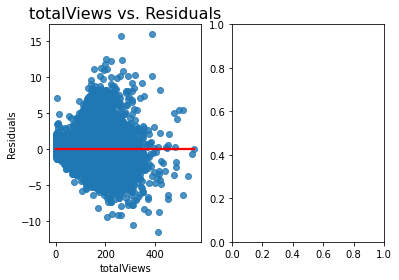

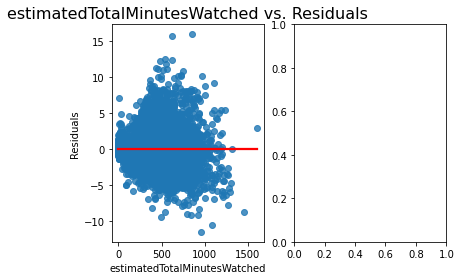

In [ ]:
#2nd best R^2
temp_X_rm = np.power(X_train_rm, 0.5)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm, 0.5), temp_X_rm)

R^2 adj: 0.937881693574929
BIC: 167546.526277517
MSE: 103224.93004692414
Jarque-Bera test ---- statistic: 5026589.6129, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.6230, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.2468, p-value: 0.0000
Anderson-Darling test ---- statistic: 6226.5561, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 10243.920624461256, 'LM-Test p-value': 0.0, 'F-Statistic': 1071.5452665360542, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


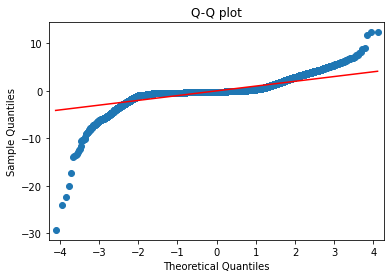

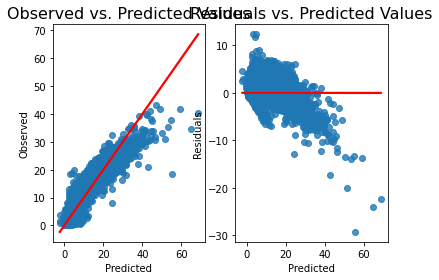

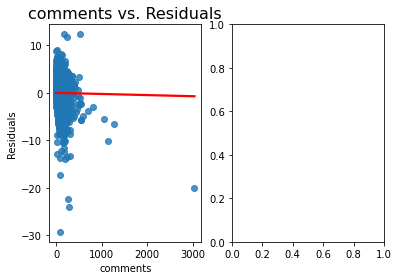

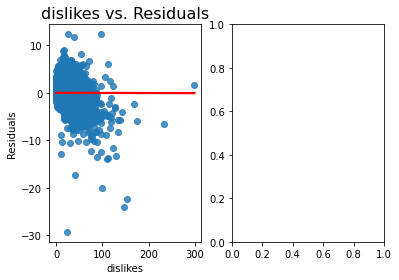

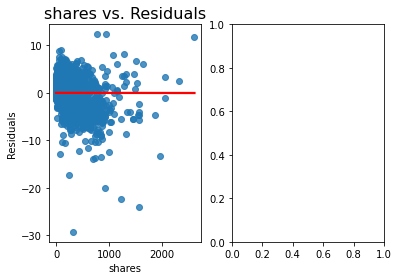

...

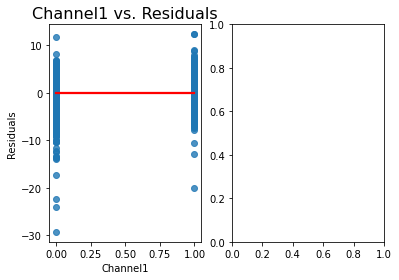

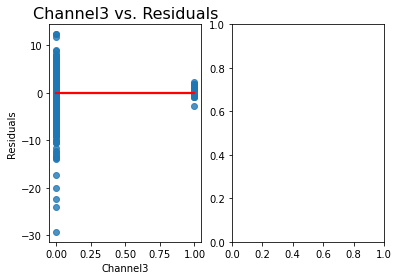

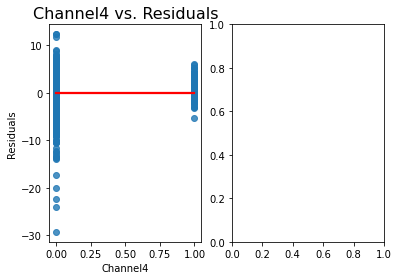

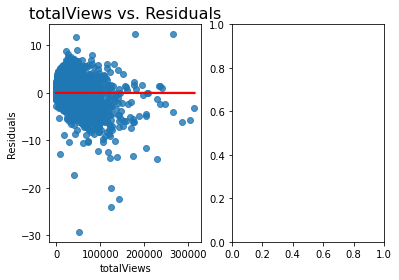

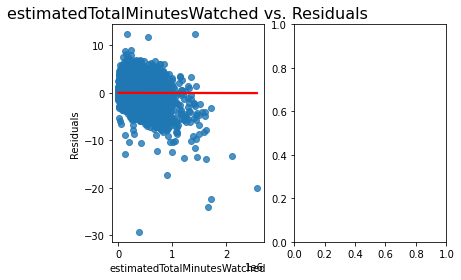

In [ ]:
temp_X_rm = X_train_rm
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm, 0.5), X_train_rm)

R^2 adj: 0.9882242397983154
BIC: 182550.39076489388
MSE: 773018.060106684
Jarque-Bera test ---- statistic: 3391921.8627, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.5181, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.2989, p-value: 0.0000
Anderson-Darling test ---- statistic: 8250.8541, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 12269.296050342562, 'LM-Test p-value': 0.0, 'F-Statistic': 1351.7048811172629, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


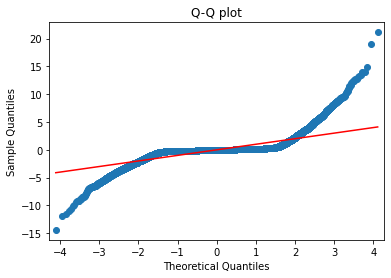

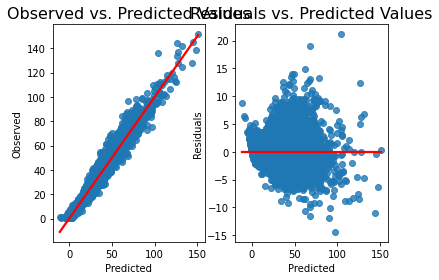

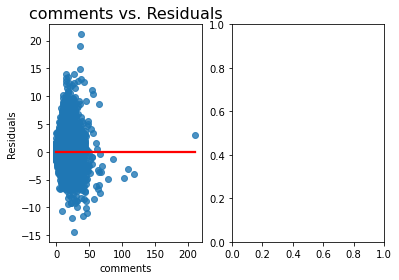

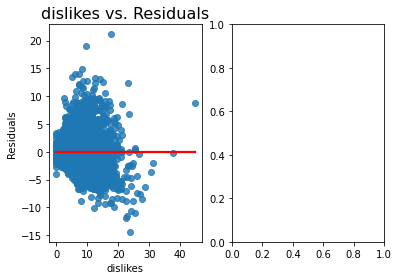

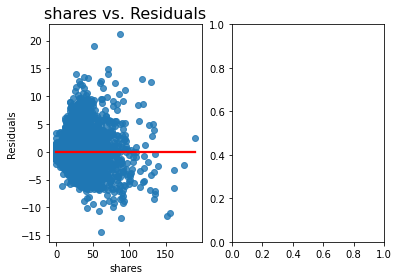

...

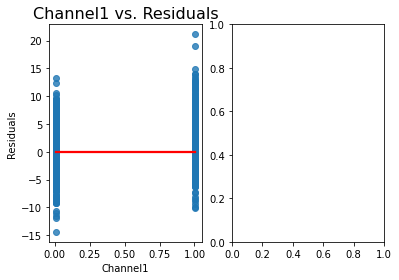

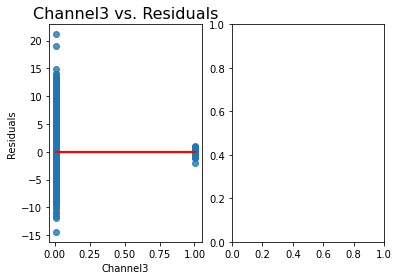

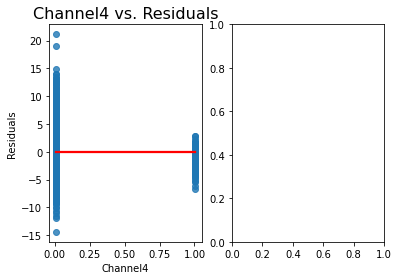

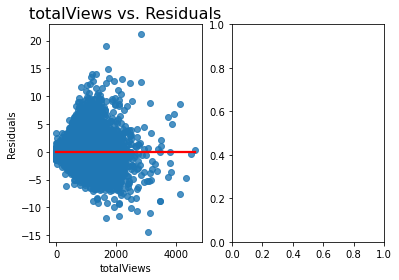

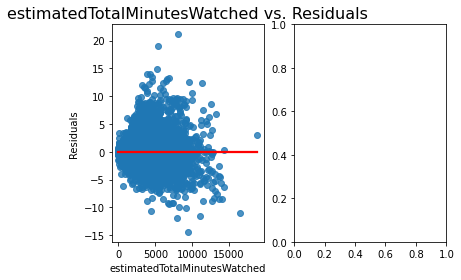

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, 2/3)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm + 0.001, 2/3), temp_X_rm)

R^2 adj: 0.9575072679423986
BIC: 770985.7301541105
MSE: 24827220163.918655
Jarque-Bera test ---- statistic: 260808178.6270, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.2677, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3963, p-value: 0.0000
Anderson-Darling test ---- statistic: 12390.1634, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 8427.35093636741, 'LM-Test p-value': 0.0, 'F-Statistic': 843.3086595694957, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


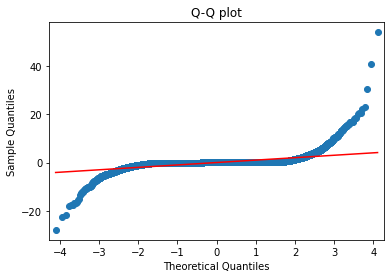

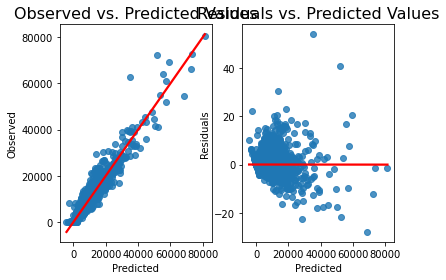

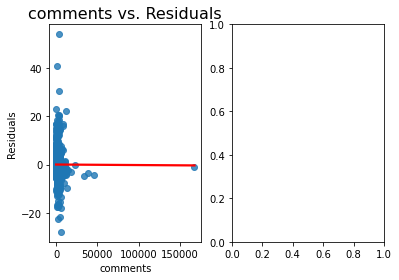

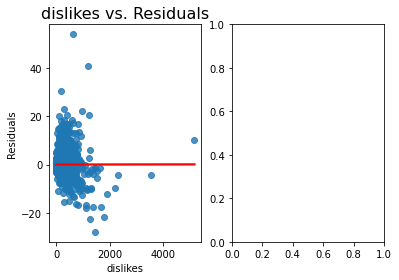

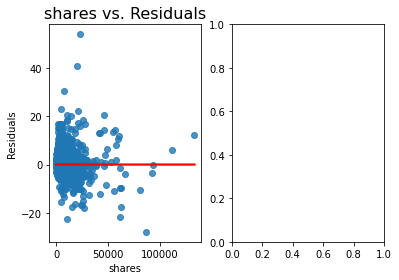

...

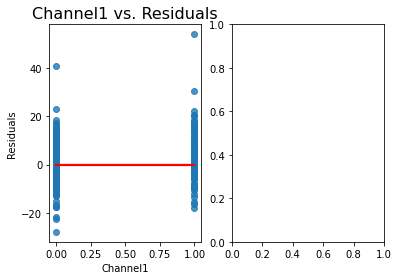

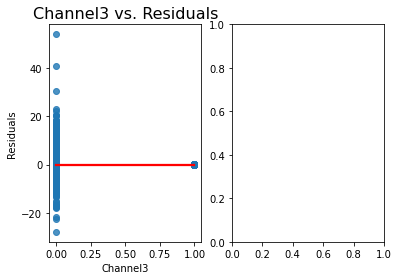

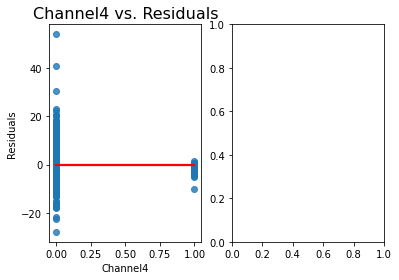

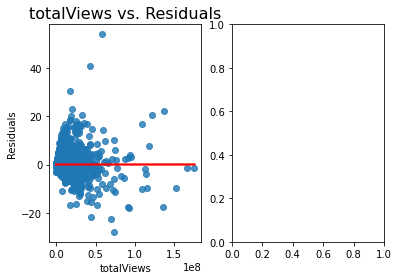

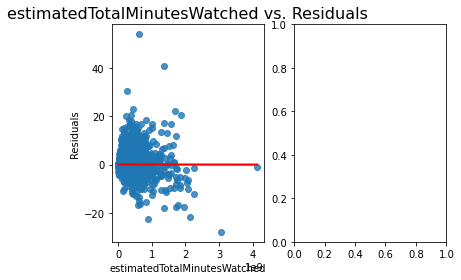

In [ ]:
temp_X_rm = np.power(X_train_rm, 1.5)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm, 1.5), temp_X_rm)

R^2 adj: 0.9297194837500495
BIC: 796308.8450457233
MSE: 24106889716.18574
Jarque-Bera test ---- statistic: 464123957.7912, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.3190, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3702, p-value: 0.0000
Anderson-Darling test ---- statistic: 11197.0161, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 7138.7263045879745, 'LM-Test p-value': 0.0, 'F-Statistic': 693.0444052468134, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


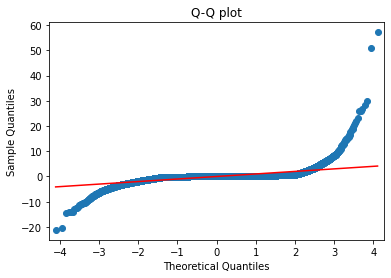

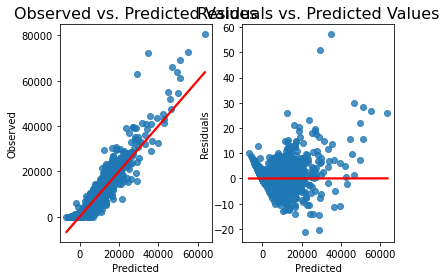

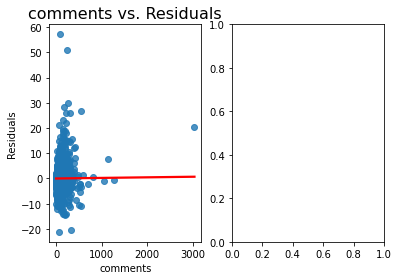

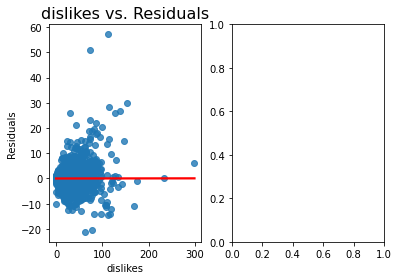

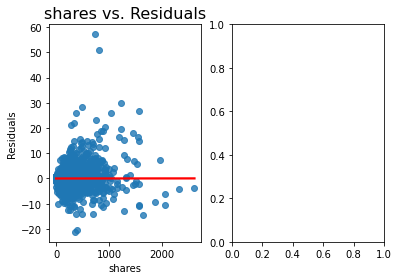

...

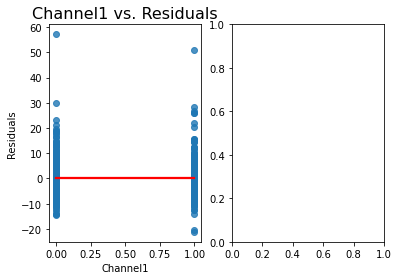

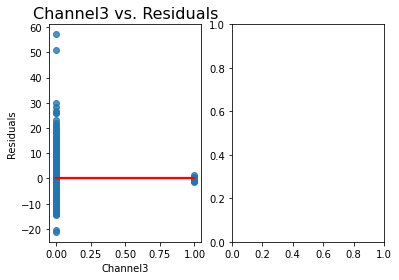

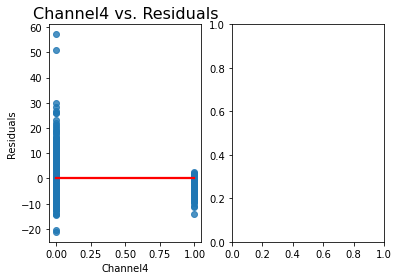

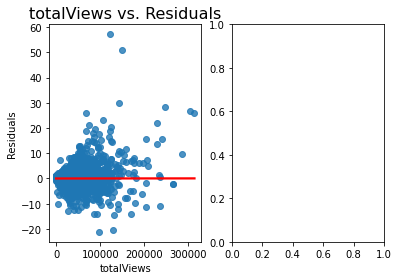

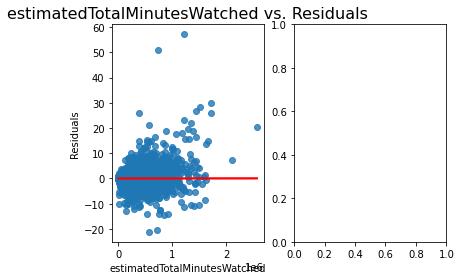

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm, 1.5), X_train_rm)

R^2 adj: 0.8894518847627415
BIC: 1865610.3223551018
MSE: 3.7147534916657865e+19
Jarque-Bera test ---- statistic: 44860129190.3906, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.0508, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.4428, p-value: 0.0000
Anderson-Darling test ---- statistic: 17379.6339, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 5766.256091092293, 'LM-Test p-value': 0.0, 'F-Statistic': 813.9050865042361, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


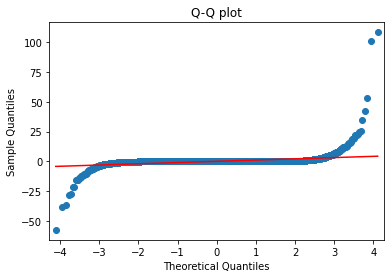

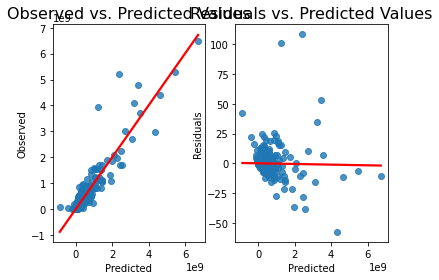

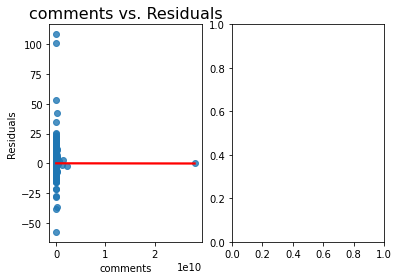

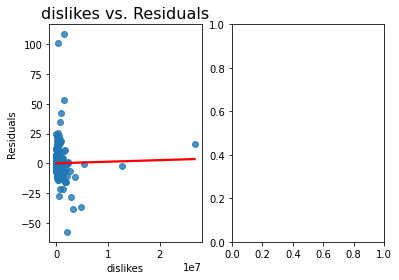

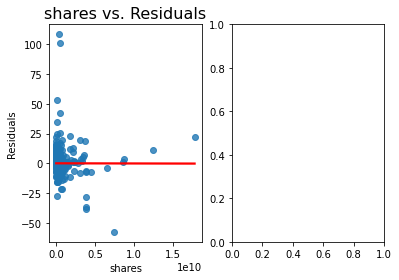

...

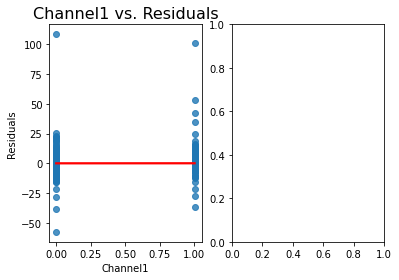

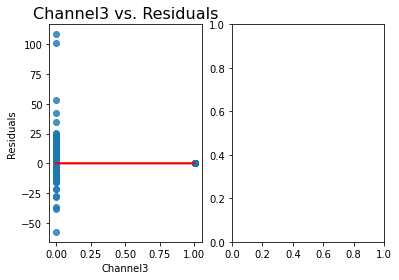

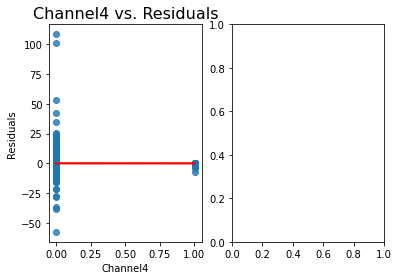

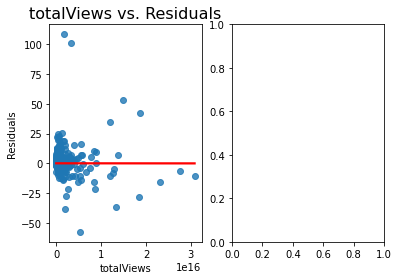

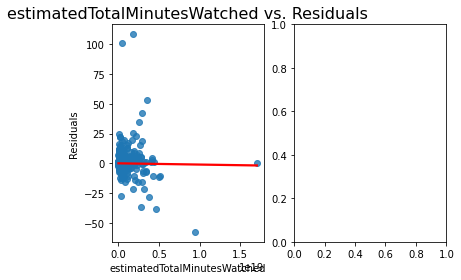

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, 3), np.power(X_train_rm + 0.001, 3))

## Transformations that don't really work

R^2 adj: 0.6386693212046823
BIC: 213247.48779138763
MSE: 29967.157517598407
Jarque-Bera test ---- statistic: 63365.0180, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.9812, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.0328, p-value: 0.0000
Anderson-Darling test ---- statistic: 75.8838, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 3642.9441533897475, 'LM-Test p-value': 0.0, 'F-Statistic': 327.18309916283073, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


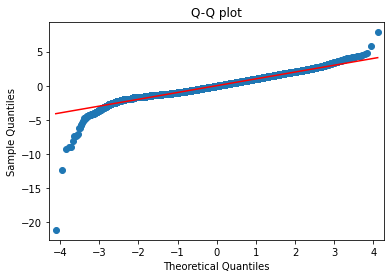

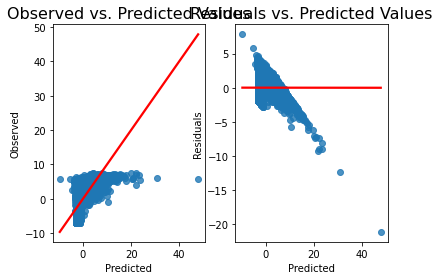

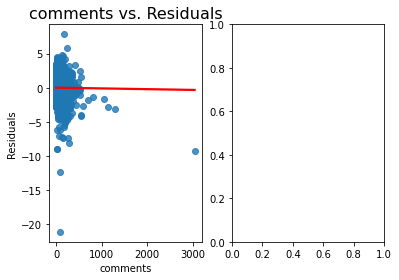

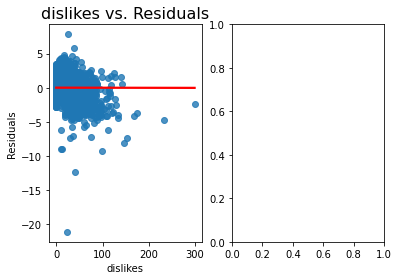

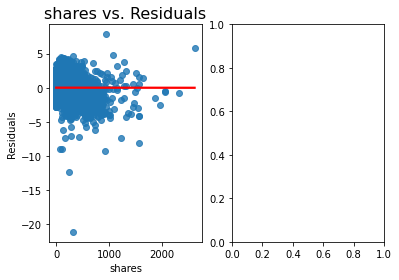

...

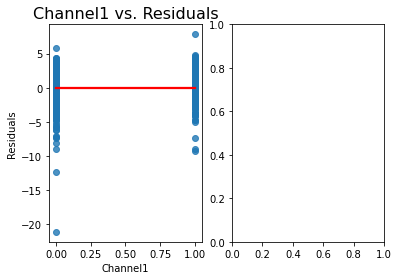

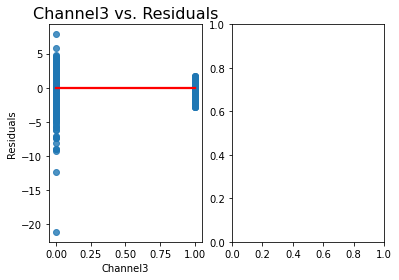

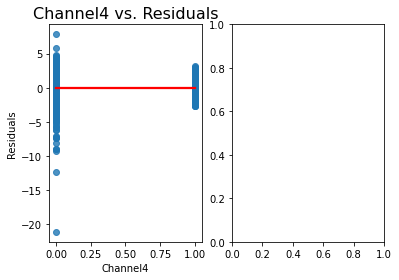

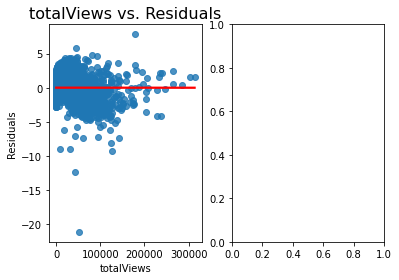

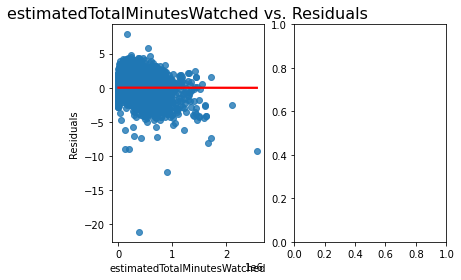

In [ ]:
#Eliminate
test_normality_homoscedasticity( np.log(y_train_rm + 0.001), X_train_rm)

R^2 adj: 0.6105406170307852
BIC: 367373.9548836563
MSE: 568244.0150479894
Jarque-Bera test ---- statistic: 671135.6511, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.7387, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.2392, p-value: 0.0000
Anderson-Darling test ---- statistic: 3975.8667, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 4907.417743139647, 'LM-Test p-value': 0.0, 'F-Statistic': 453.01915173925534, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


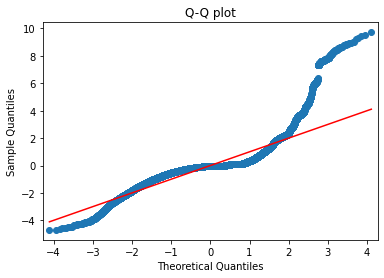

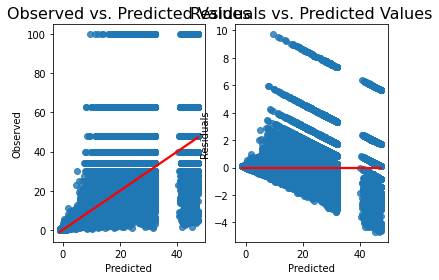

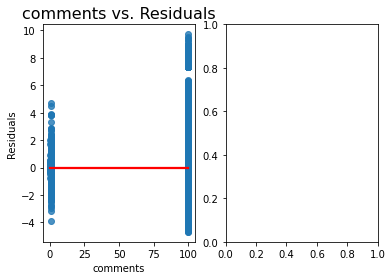

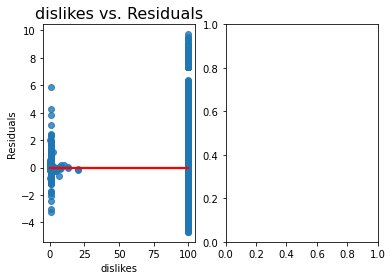

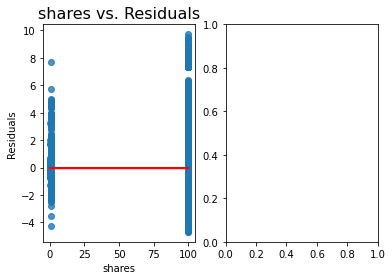

...

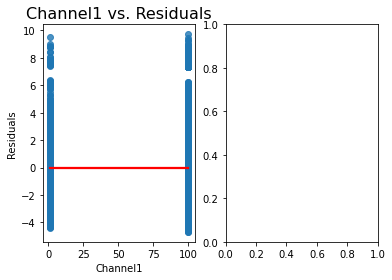

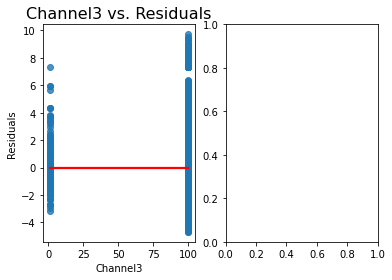

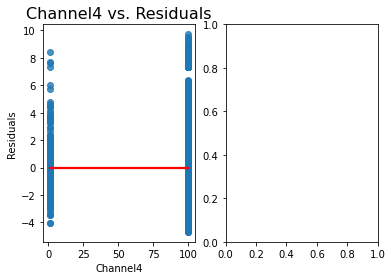

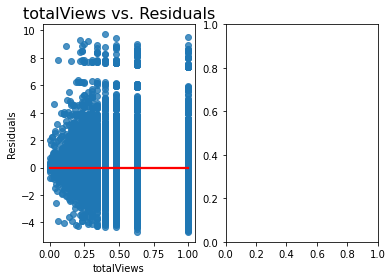

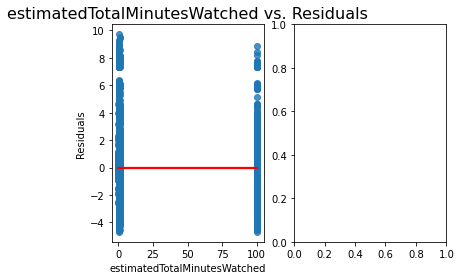

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, -2/3)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -2/3), temp_X_rm)

R^2 adj: 0.8043243287258328
BIC: 131388.7635271251
MSE: 13701.03374360503
Jarque-Bera test ---- statistic: 94191.3112, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8776, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1594, p-value: 0.0000
Anderson-Darling test ---- statistic: 1988.2545, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 6930.386377570097, 'LM-Test p-value': 0.0, 'F-Statistic': 669.5882589713291, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


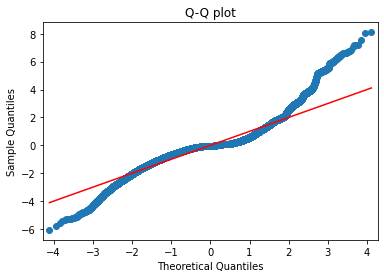

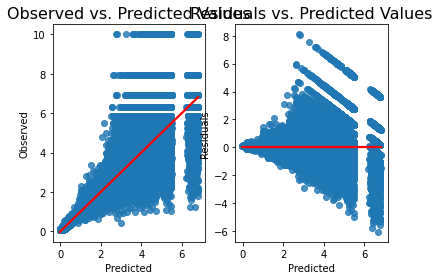

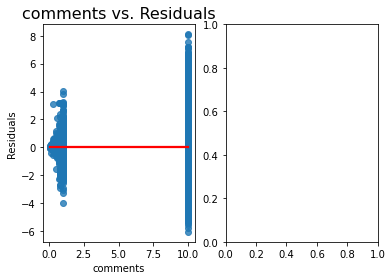

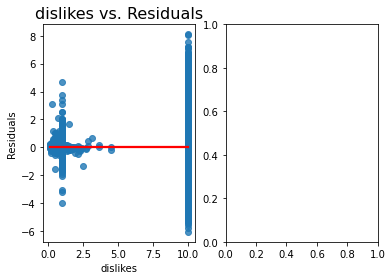

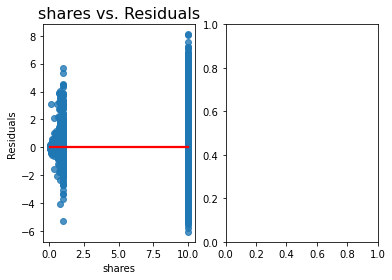

...

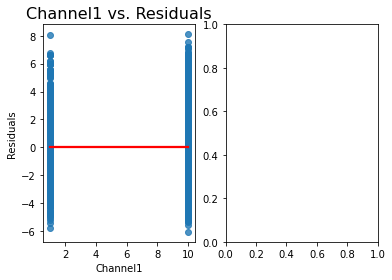

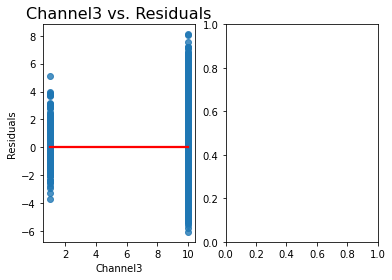

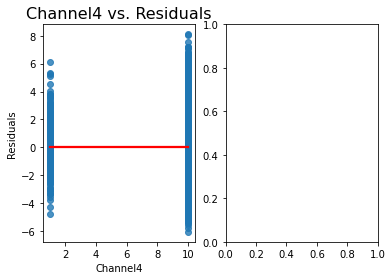

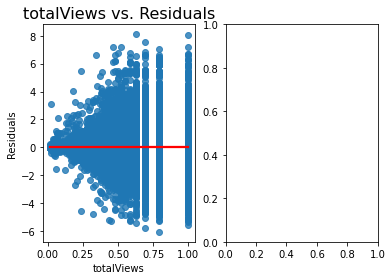

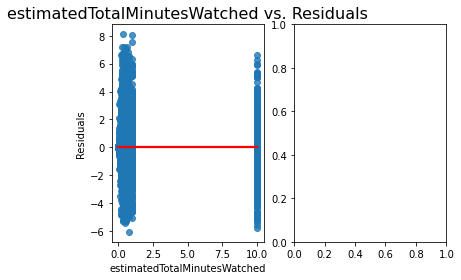

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, -1/3)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -1/3), temp_X_rm)

R^2 adj: 0.46867330037788524
BIC: 577518.1650739707
MSE: 20808268.32045724
Jarque-Bera test ---- statistic: 8043785.7045, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.5415, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3323, p-value: 0.0000
Anderson-Darling test ---- statistic: 7199.1685, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 3488.221422193626, 'LM-Test p-value': 0.0, 'F-Statistic': 312.25215366558876, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


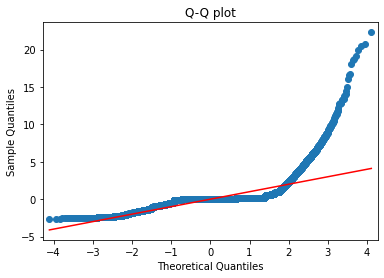

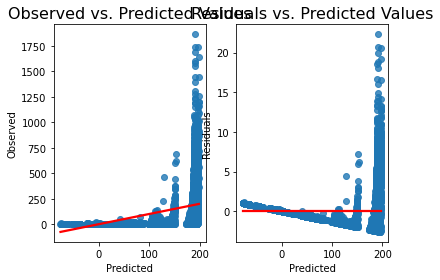

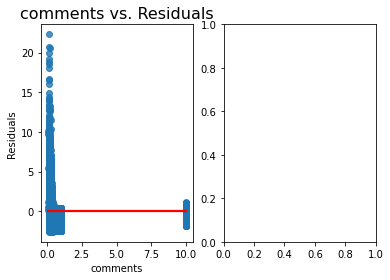

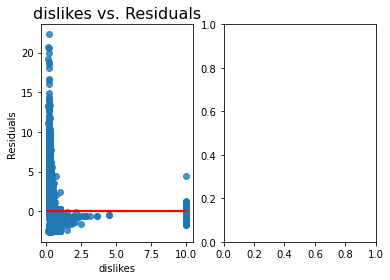

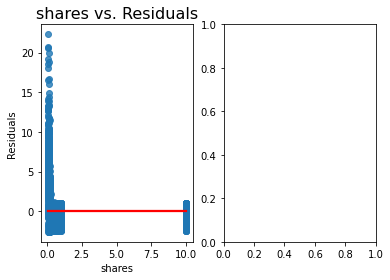

...

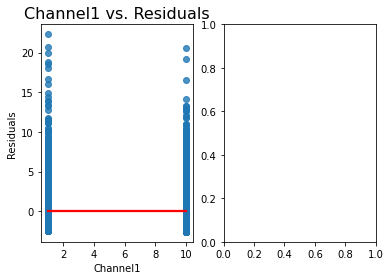

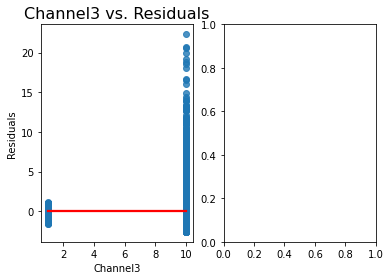

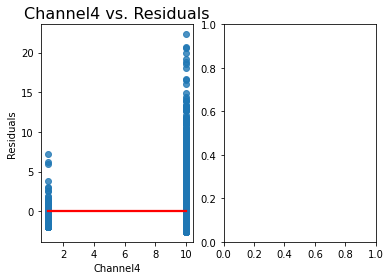

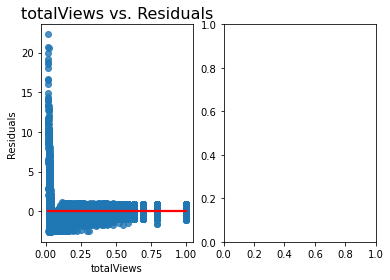

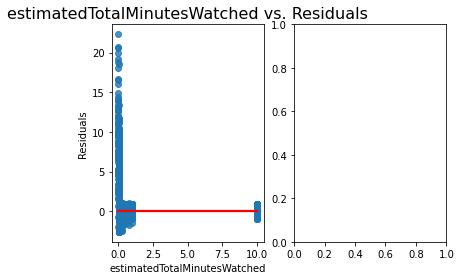

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, -1/3)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( y_train_rm, temp_X_rm)

R^2 adj: 0.26389882970711154
BIC: 198068.78461913147
MSE: 4498.038331789944
Jarque-Bera test ---- statistic: 11061.7550, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.9334, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.0930, p-value: 0.0000
Anderson-Darling test ---- statistic: 949.0119, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 372.3634235592394, 'LM-Test p-value': 2.6580983458194175e-72, 'F-Statistic': 31.253506344765377, 'F-Test p-value': 1.39489538869083e-72}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


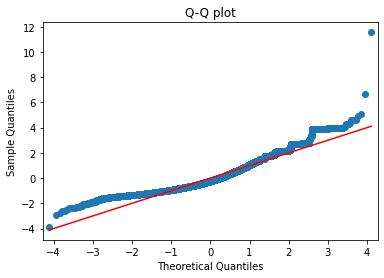

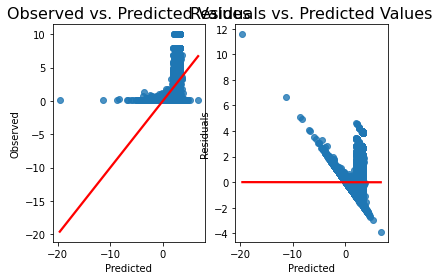

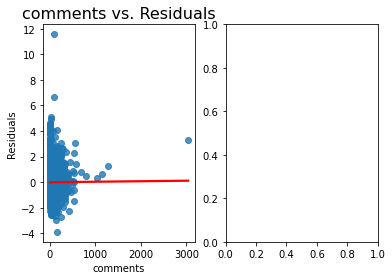

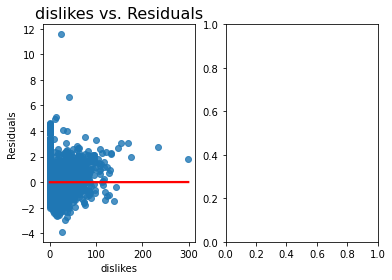

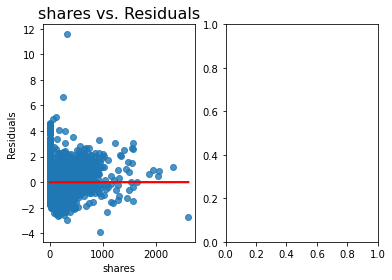

...

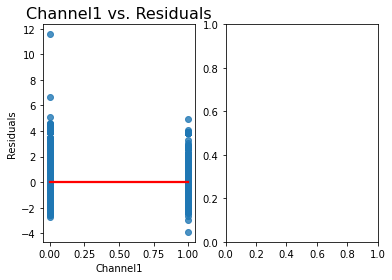

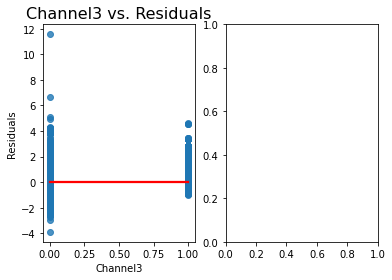

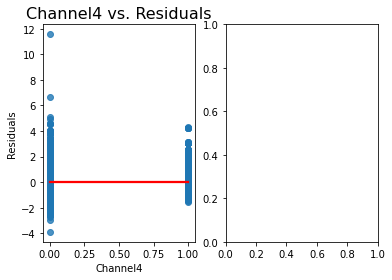

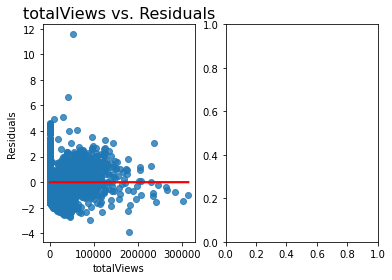

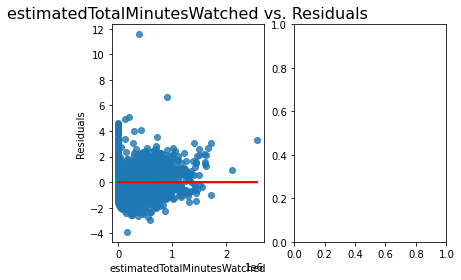

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -1/3), X_train_rm)

R^2 adj: 0.8224349193063661
BIC: 1180076.7673803398
MSE: 17299125570805.406
Jarque-Bera test ---- statistic: 2274209122.3464, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.2457, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3742, p-value: 0.0000
Anderson-Darling test ---- statistic: 11876.6185, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 7458.938327203762, 'LM-Test p-value': 0.0, 'F-Statistic': 729.5402700082346, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


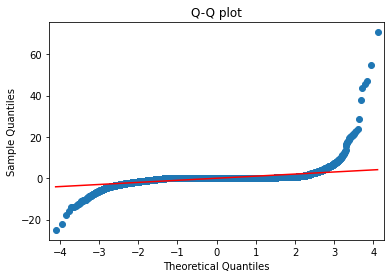

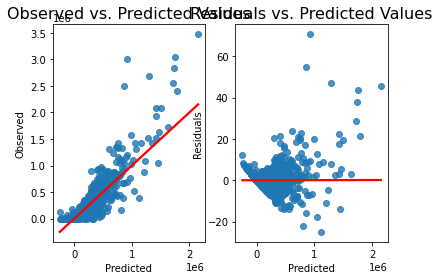

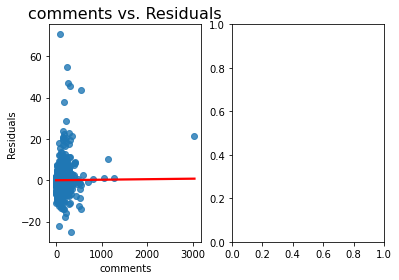

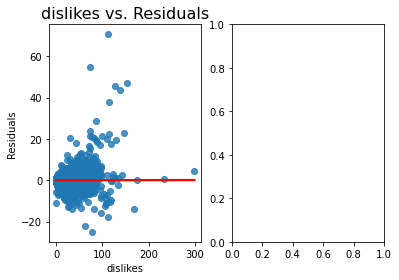

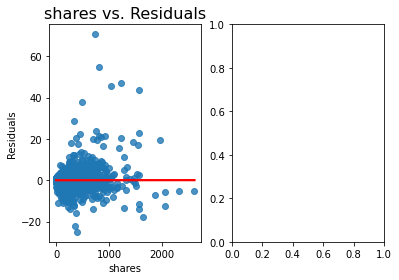

...

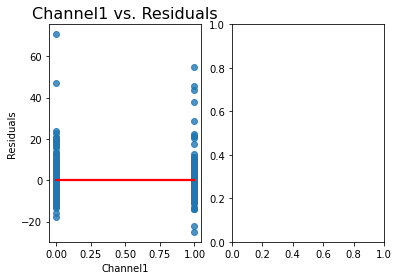

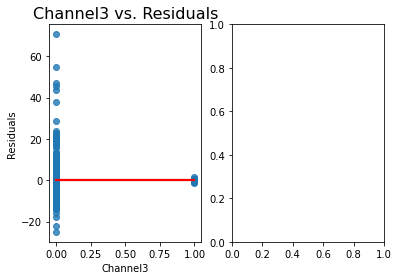

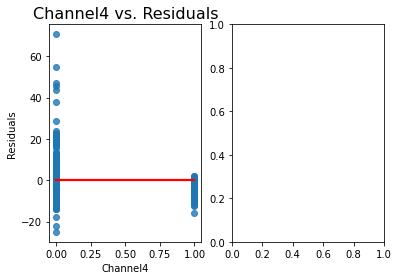

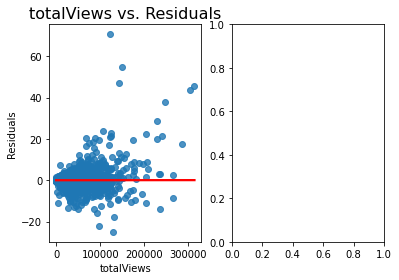

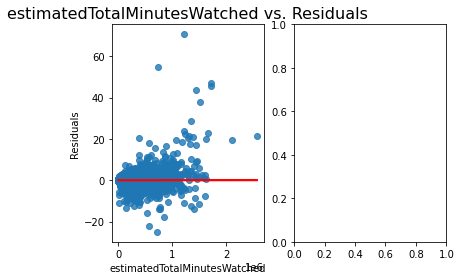

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm, 2), X_train_rm)

R^2 adj: 0.7066286630955992
BIC: 252859.33874115112
MSE: 89712.74084580915
Jarque-Bera test ---- statistic: 259038.4419, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8123, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.2017, p-value: 0.0000
Anderson-Darling test ---- statistic: 2950.8399, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 6105.855468934745, 'LM-Test p-value': 0.0, 'F-Statistic': 578.9258624029375, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


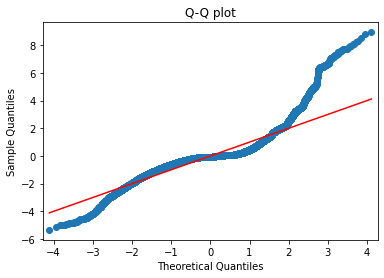

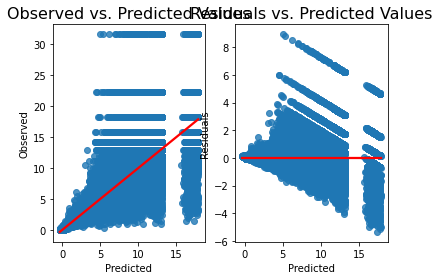

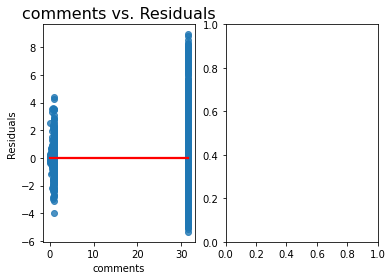

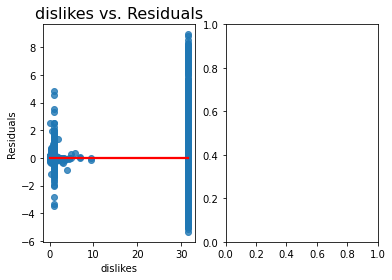

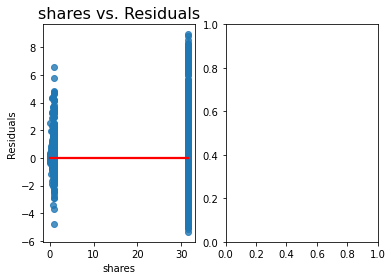

...

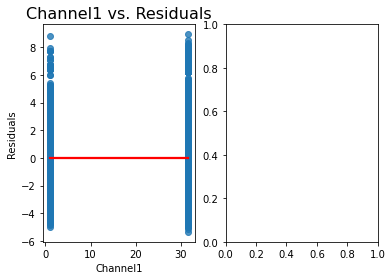

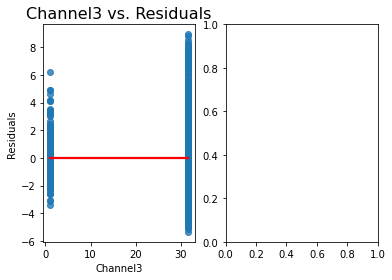

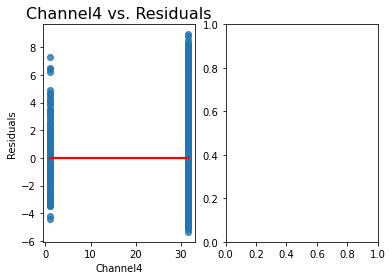

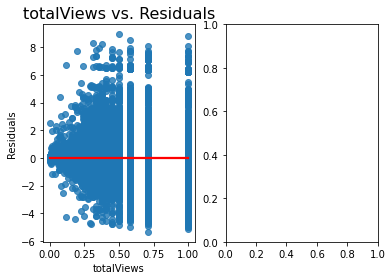

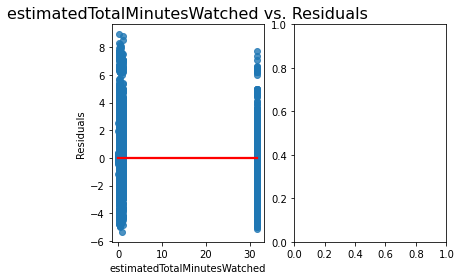

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, -0.5)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -0.5), temp_X_rm)

R^2 adj: 0.0039605347574838135
BIC: 527433.6774429448
MSE: 36743.957971762866
Jarque-Bera test ---- statistic: 3237836122685.5132, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.0091, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.4341, p-value: 0.0000
Anderson-Darling test ---- statistic: 17507.5161, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 201.29272556530918, 'LM-Test p-value': 1.7641949394973986e-36, 'F-Statistic': 16.837404046525016, 'F-Test p-value': 1.4785225291060046e-36}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


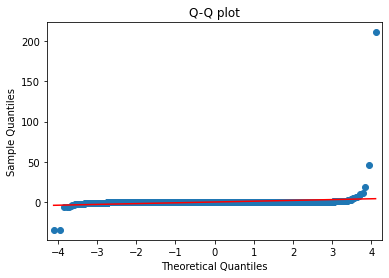

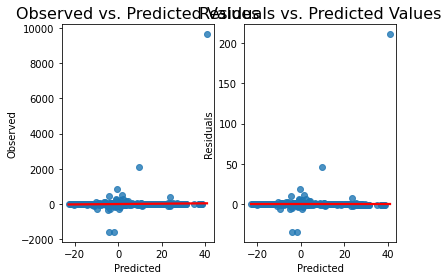

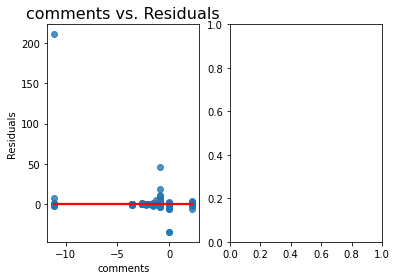

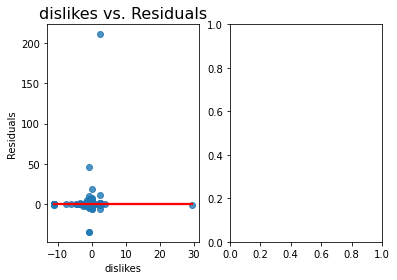

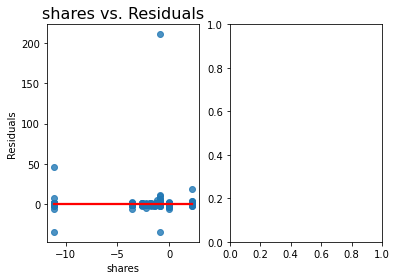

...

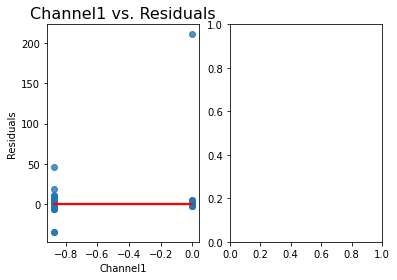

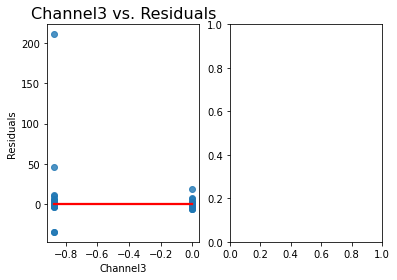

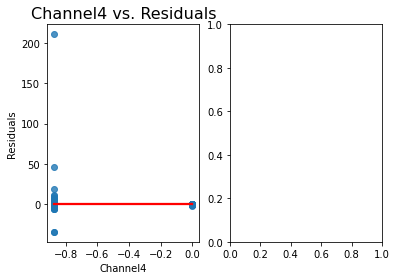

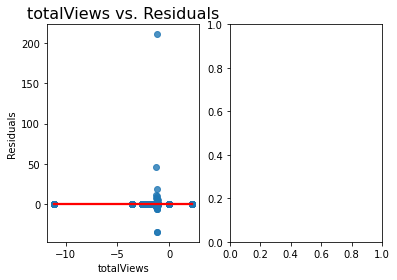

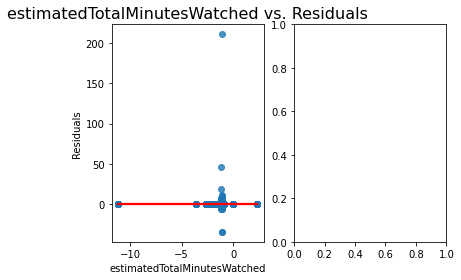

In [ ]:
test_normality_homoscedasticity( ( np.log(y_train_rm + 0.001) / (1-np.log(y_train_rm + 0.001)) ), ( np.log(X_train_rm + 0.001) / (1-np.log(X_train_rm + 0.001)) ))

R^2 adj: 0.9350260198682171
BIC: 1129479.4970076894
MSE: 19666684248483.77
Jarque-Bera test ---- statistic: 2851106907.9212, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.1631, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.4208, p-value: 0.0000
Anderson-Darling test ---- statistic: 14234.1970, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 6822.772974620247, 'LM-Test p-value': 0.0, 'F-Statistic': 657.5604927076791, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


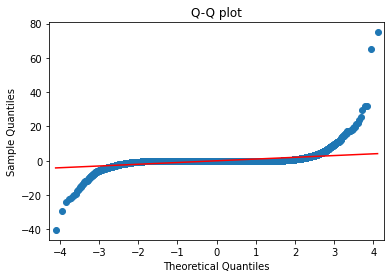

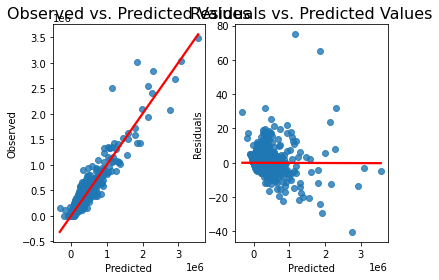

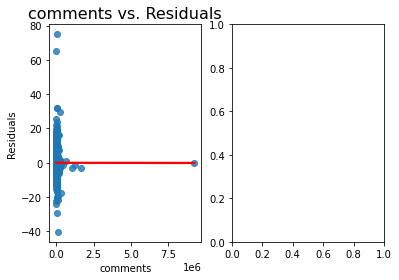

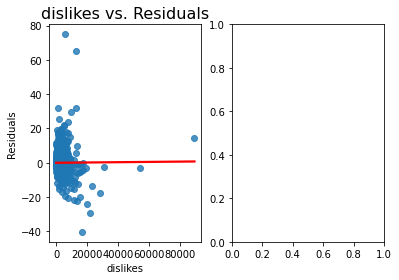

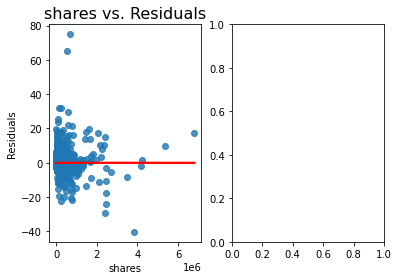

...

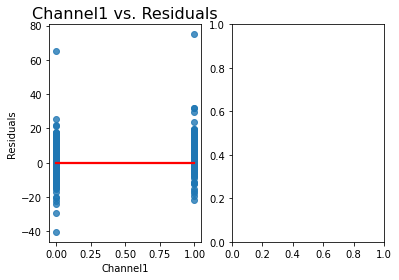

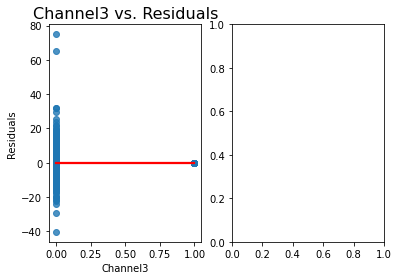

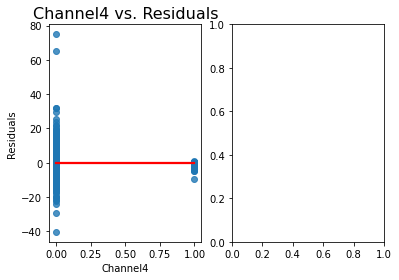

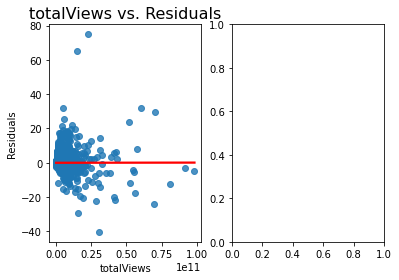

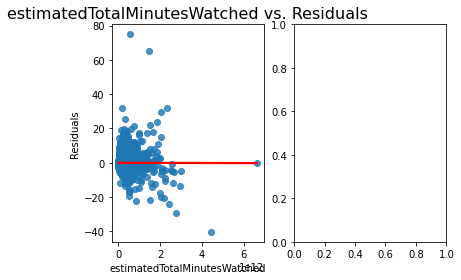

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm, 2), np.power(X_train_rm, 2))

R^2 adj: 0.11952354341184135
BIC: 1267639.7081070764
MSE: 2893083441744.7524
Jarque-Bera test ---- statistic: 39499409.7171, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.2596, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3923, p-value: 0.0000
Anderson-Darling test ---- statistic: 11052.0762, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 1108.694755411491, 'LM-Test p-value': 7.82797299506217e-230, 'F-Statistic': 94.44799545848645, 'F-Test p-value': 1.8397415213116666e-232}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


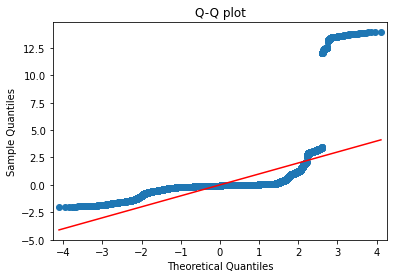

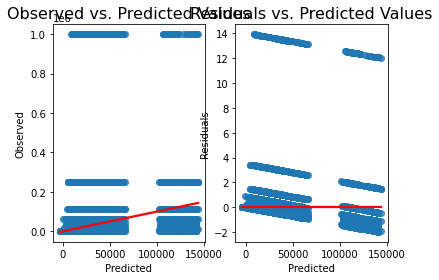

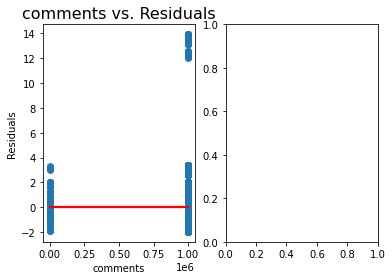

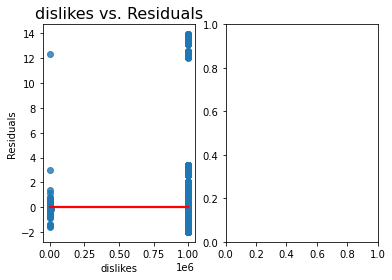

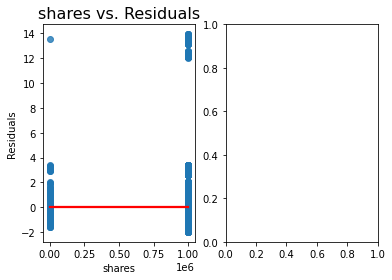

...

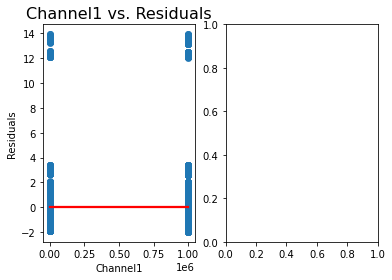

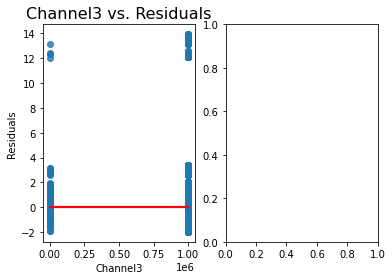

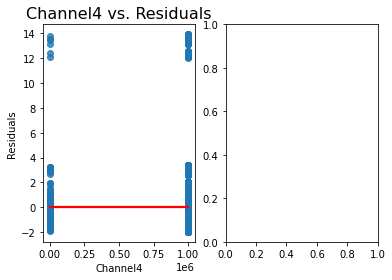

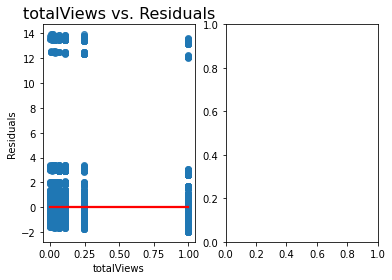

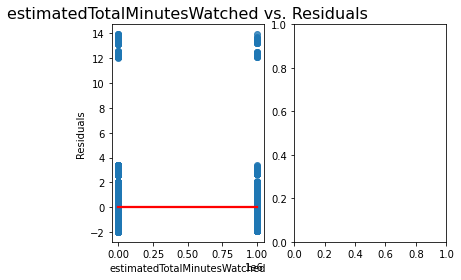

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, -2)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -2), temp_X_rm)

R^2 adj: 0.34295310205615503
BIC: 908805.0500336294
MSE: 8896404147.618546
Jarque-Bera test ---- statistic: 134527493.2189, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.4155, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.2934, p-value: 0.0000
Anderson-Darling test ---- statistic: 7075.3052, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 1435.0666941079478, 'LM-Test p-value': 3.82198188727279e-300, 'F-Statistic': 123.06717254737383, 'F-Test p-value': 1.3628202003713388e-304}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


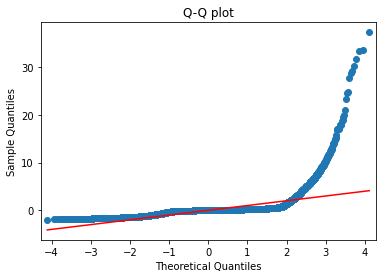

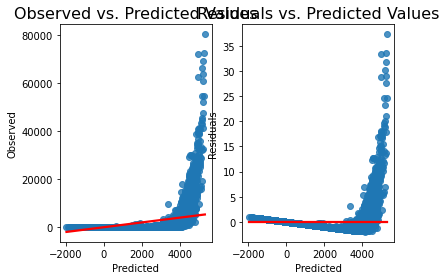

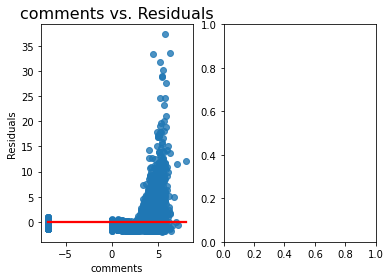

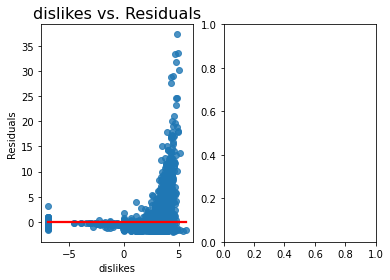

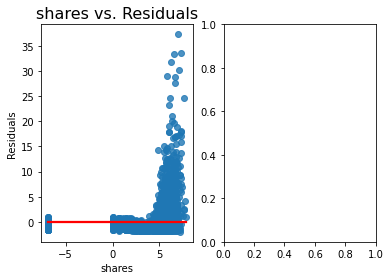

...

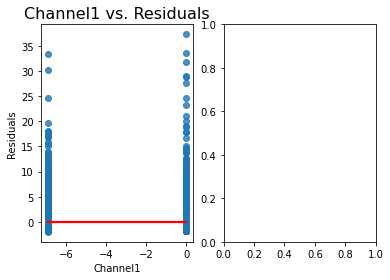

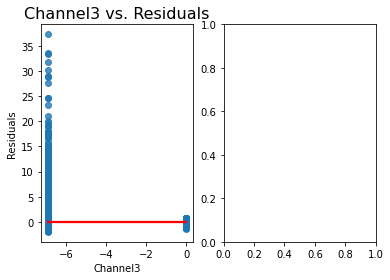

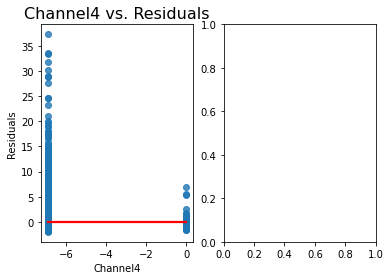

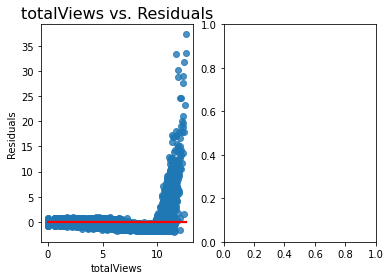

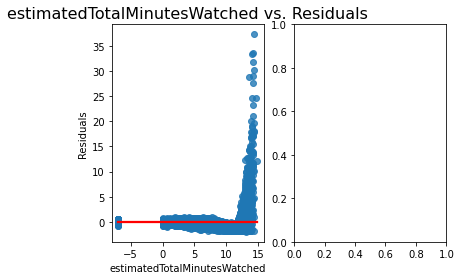

In [ ]:
temp_X_rm = np.log(X_train_rm + 0.001)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)
temp_X_rm = temp_X_rm.drop(['videosAddedMinusRemovedFromPlaylist'], axis = 1, errors='ignore')

test_normality_homoscedasticity( np.power(y_train_rm, 1.5), temp_X_rm)

R^2 adj: 0.49124549741748424
BIC: 230468.32223085567
MSE: 23052.430822799535
Jarque-Bera test ---- statistic: 1751286.8014, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.9512, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.0509, p-value: 0.0000
Anderson-Darling test ---- statistic: 260.3210, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 7271.6683711702535, 'LM-Test p-value': 0.0, 'F-Statistic': 708.130450378113, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


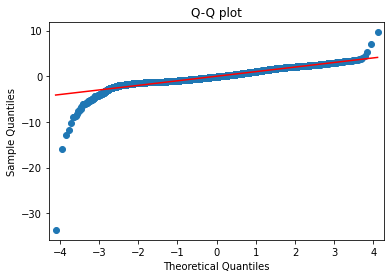

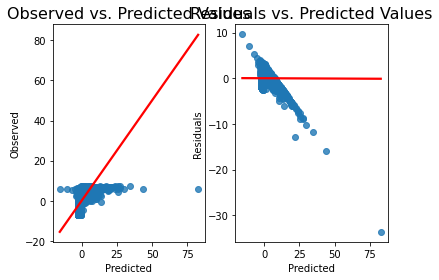

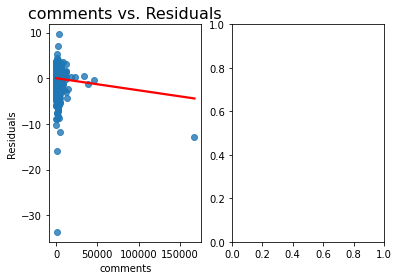

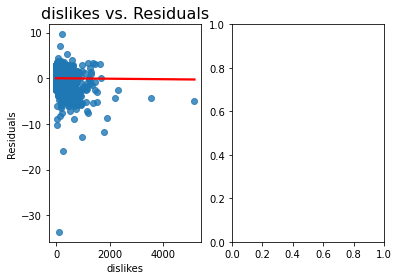

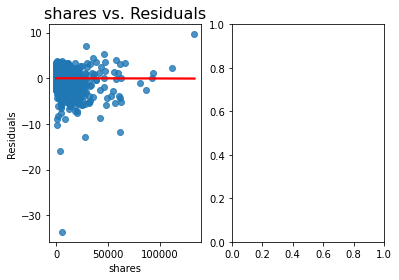

...

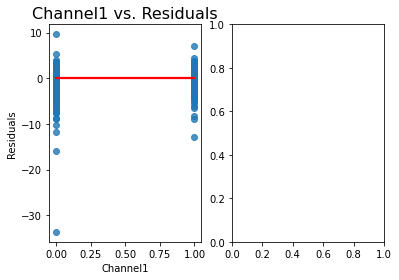

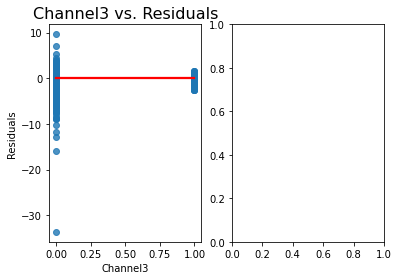

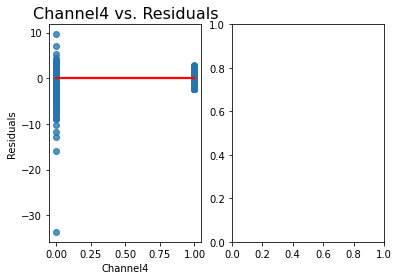

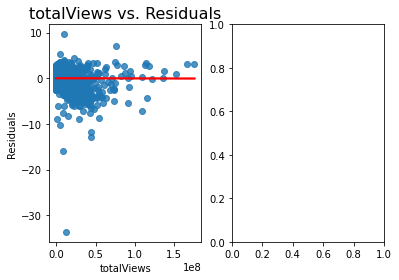

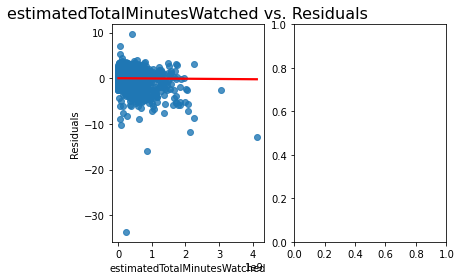

In [ ]:
temp_X_rm = np.power(X_train_rm, 1.5)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)
temp_X_rm = temp_X_rm.drop(['videosAddedMinusRemovedFromPlaylist'], axis = 1, errors='ignore')

test_normality_homoscedasticity( np.log(y_train_rm + 0.001), temp_X_rm)

R^2 adj: -8.277139216739116e-05
BIC: 527637.5645461218
MSE: 1362.6931174161534
Jarque-Bera test ---- statistic: 3289958428855.0195, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.0044, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.4635, p-value: 0.0000
Anderson-Darling test ---- statistic: 18512.5879, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 6.2737395081577265, 'LM-Test p-value': 0.9016588858603631, 'F-Statistic': 0.5227417439916764, 'F-Test p-value': 0.9016921959527431}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


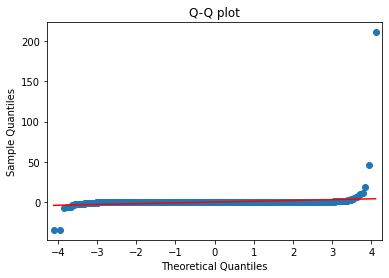

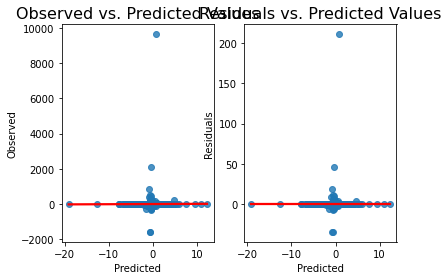

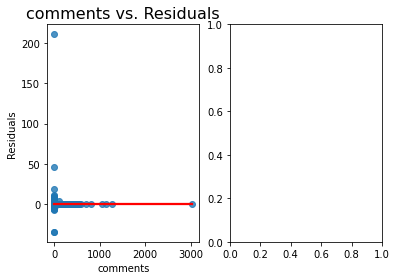

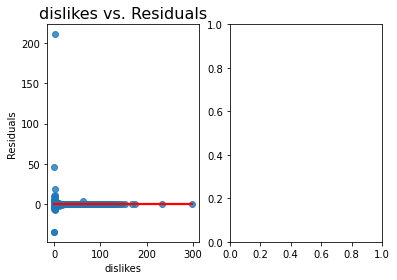

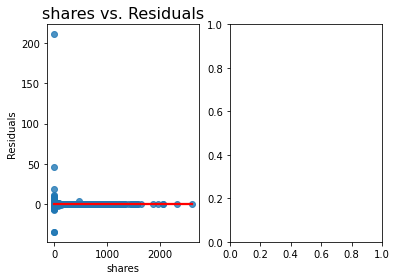

...

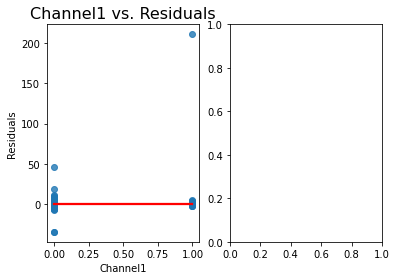

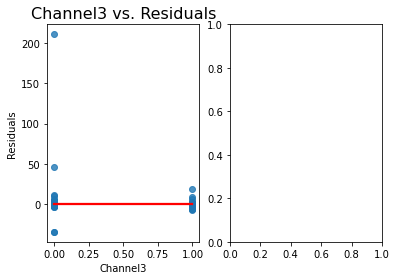

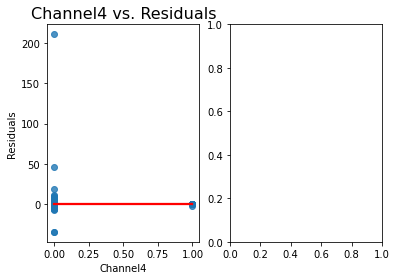

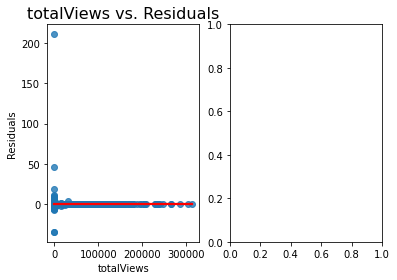

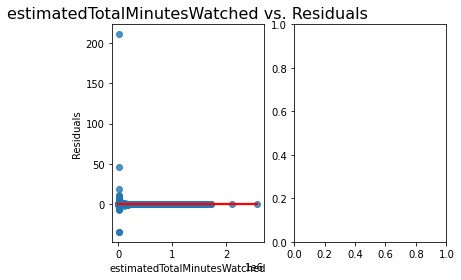

In [ ]:
temp_X_rm = X_train_rm
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( ( np.log(y_train_rm + 0.001) / (1-np.log(y_train_rm + 0.001)) ), temp_X_rm)

R^2 adj: 0.008489352408016959
BIC: 1273616.9884124047
MSE: 210838073294.13022
Jarque-Bera test ---- statistic: 35430091.3009, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.2239, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3893, p-value: 0.0000
Anderson-Darling test ---- statistic: 12022.7666, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 69.00833069026659, 'LM-Test p-value': 4.907761111028455e-10, 'F-Statistic': 5.7571027646927515, 'F-Test p-value': 4.831618677208781e-10}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


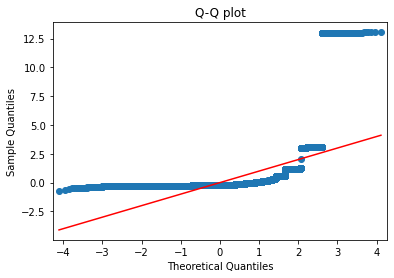

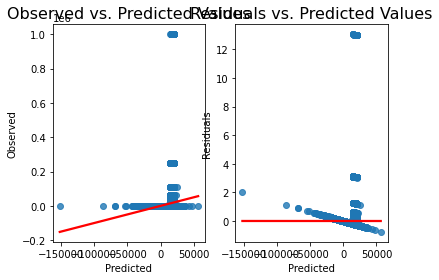

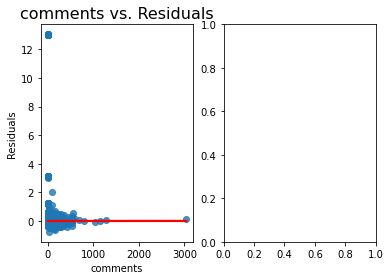

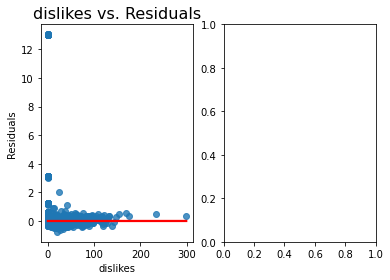

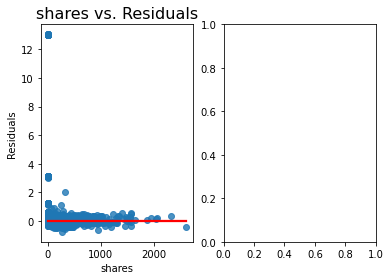

...

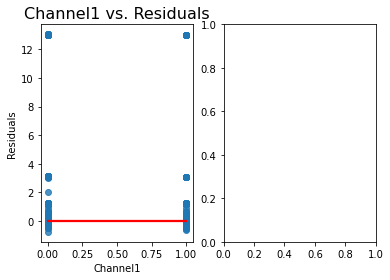

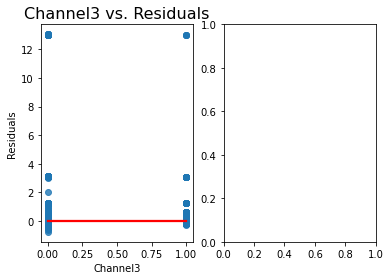

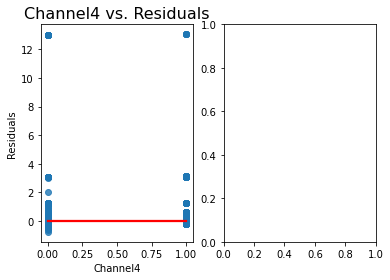

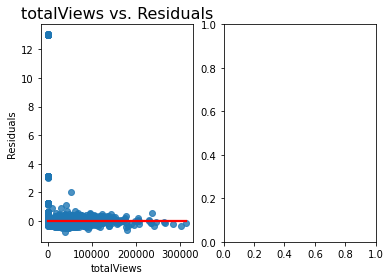

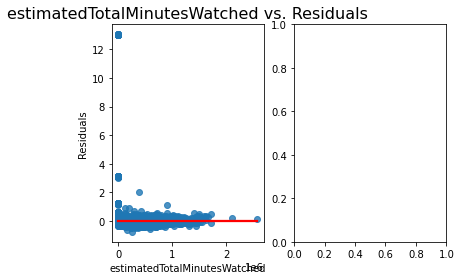

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -2), X_train_rm)

R^2 adj: 0.019400376713575418
BIC: 939176.2714459368
MSE: 623707419.8162028
Jarque-Bera test ---- statistic: 11518252.5489, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.3689, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3381, p-value: 0.0000
Anderson-Darling test ---- statistic: 9106.9986, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 111.7429694466888, 'LM-Test p-value': 2.703981524752132e-18, 'F-Statistic': 9.33022464599019, 'F-Test p-value': 2.5758283524547394e-18}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


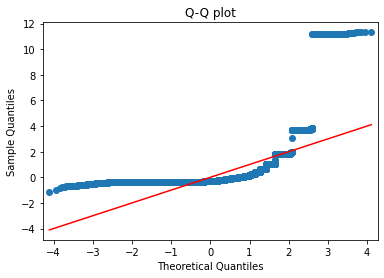

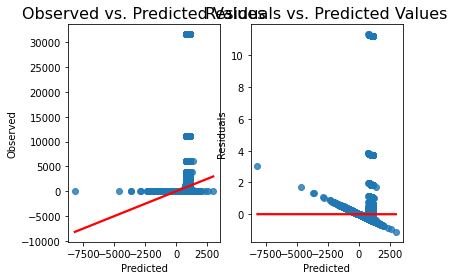

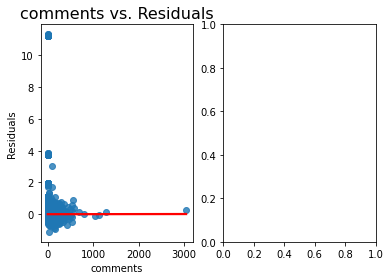

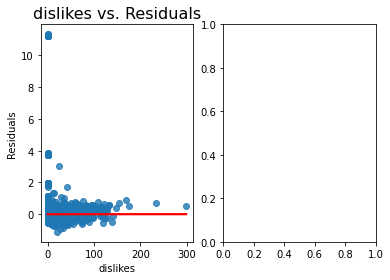

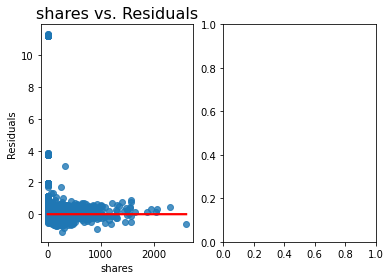

...

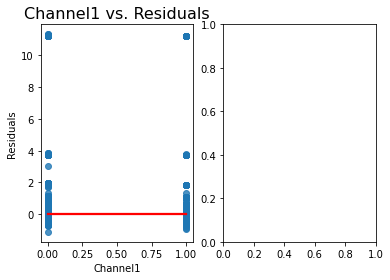

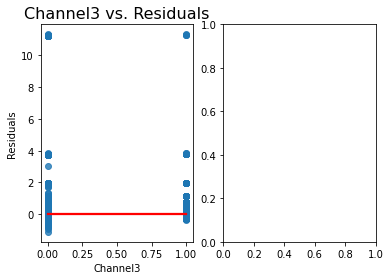

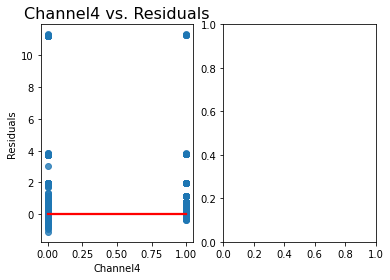

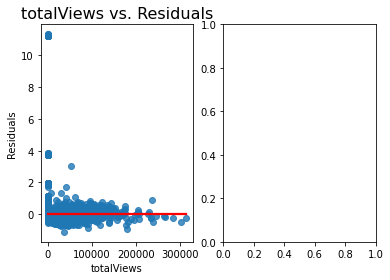

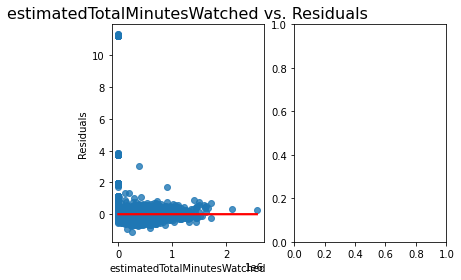

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -1.5), X_train_rm)

In [ ]:
#MissingDataError: exog contains inf or nans
#test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -1.5), np.power(X_train + 0.001, -1.5))

R^2 adj: 0.16313714515278555
BIC: 305614.2070305924
MSE: 20734.98035349305
Jarque-Bera test ---- statistic: 43709.2289, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8590, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1298, p-value: 0.0000
Anderson-Darling test ---- statistic: 1965.7037, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 570.7617570560672, 'LM-Test p-value': 1.846083653799995e-114, 'F-Statistic': 48.096650223461694, 'F-Test p-value': 3.889679107355957e-115}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


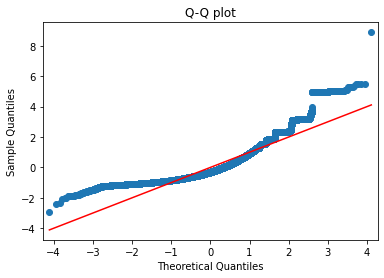

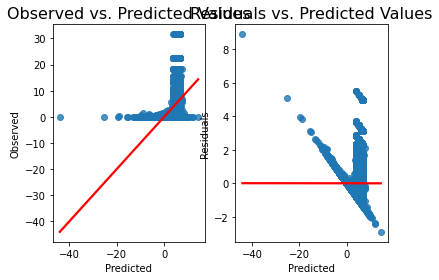

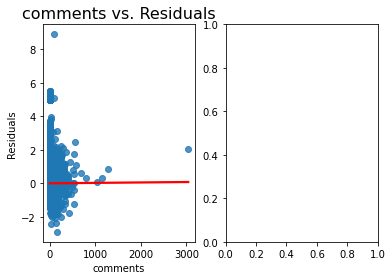

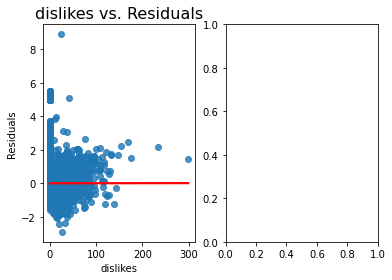

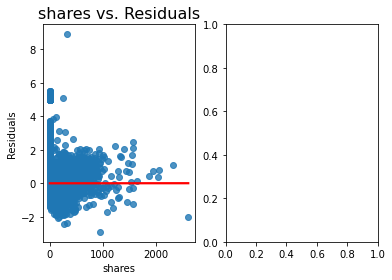

...

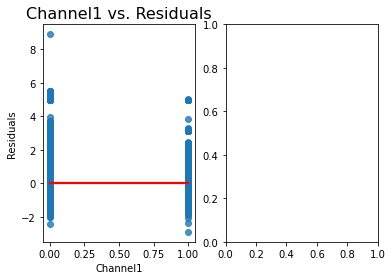

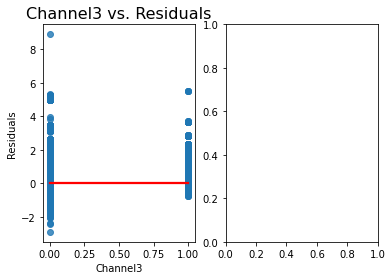

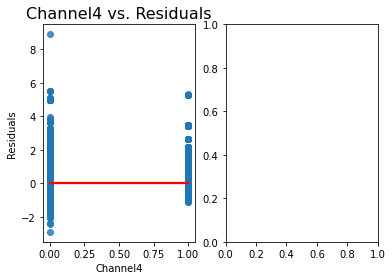

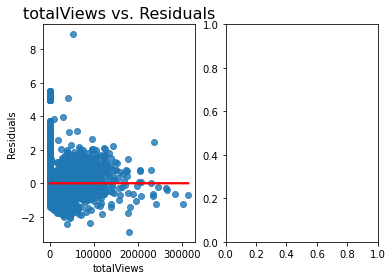

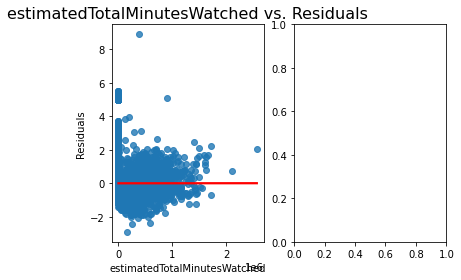

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -0.5), X_train_rm)

R^2 adj: 0.1914245985407942
BIC: 307258.33761970454
MSE: 26012.150068913354
Jarque-Bera test ---- statistic: 40237.4047, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8697, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1268, p-value: 0.0000
Anderson-Darling test ---- statistic: 1815.7512, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 468.7474455575335, 'LM-Test p-value': 9.828181919717393e-93, 'F-Statistic': 39.41934297529872, 'F-Test p-value': 3.4795394242778923e-93}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


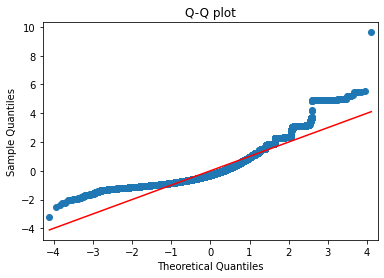

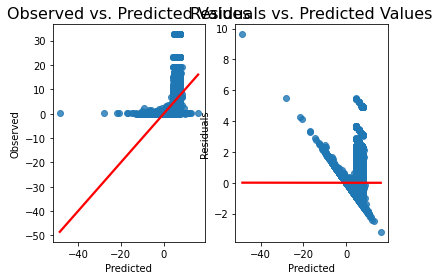

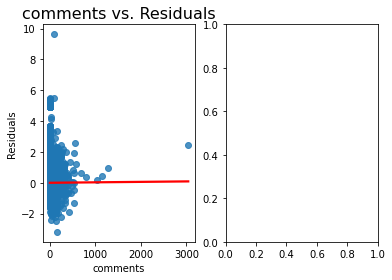

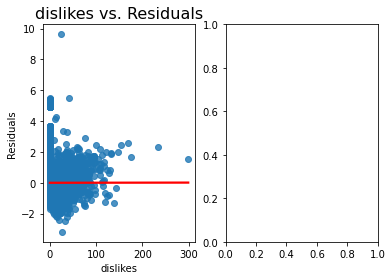

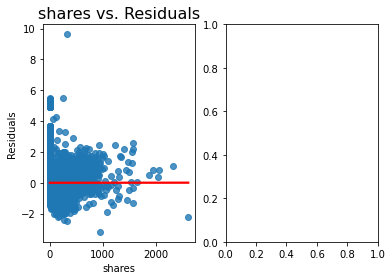

...

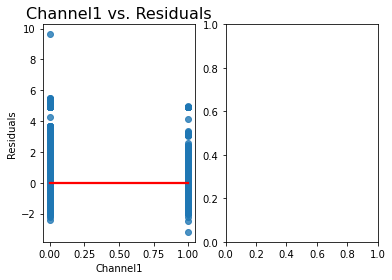

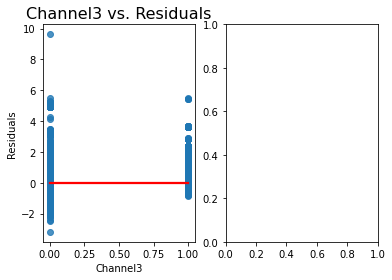

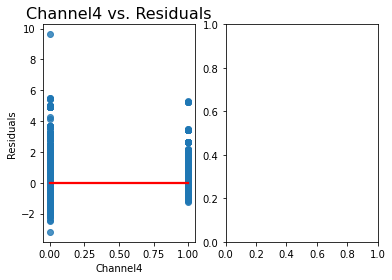

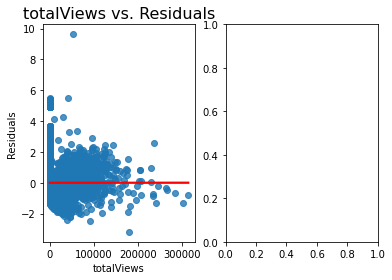

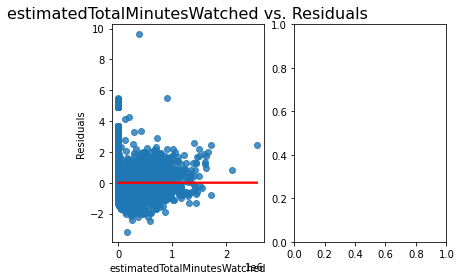

In [ ]:
test_normality_homoscedasticity( ( np.power(y_train_rm + 0.001, -0.5) + np.power(y_train_rm + 1, -0.5) ), X_train_rm)

R^2 adj: 0.7285159679354316
BIC: 252331.83747359415
MSE: 98905.16699544176
Jarque-Bera test ---- statistic: 258834.7606, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8182, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1920, p-value: 0.0000
Anderson-Darling test ---- statistic: 2781.3079, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 5907.908193945817, 'LM-Test p-value': 0.0, 'F-Statistic': 557.6613132563541, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


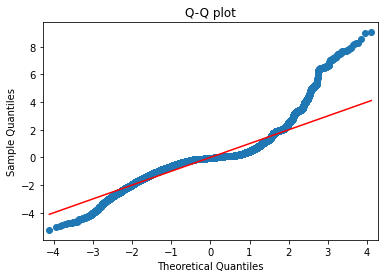

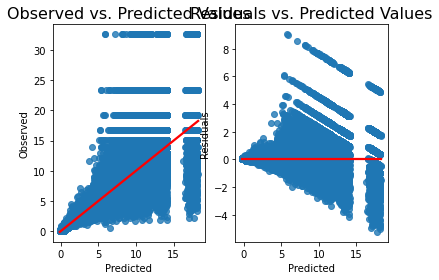

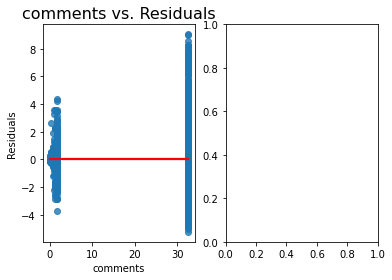

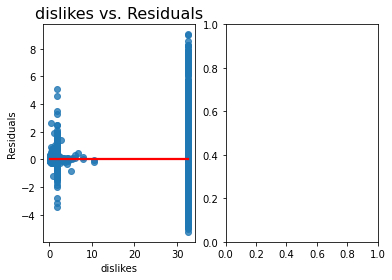

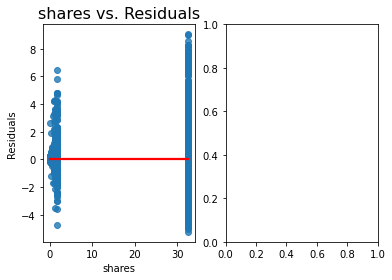

...

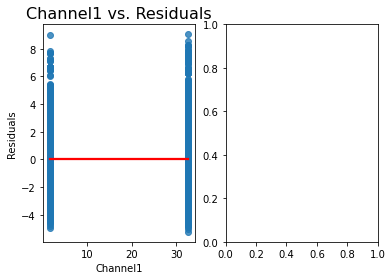

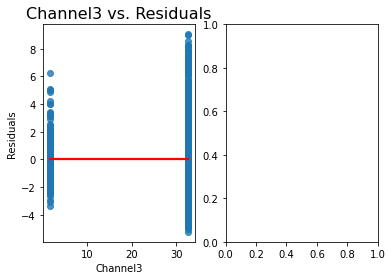

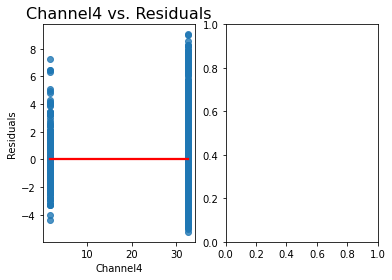

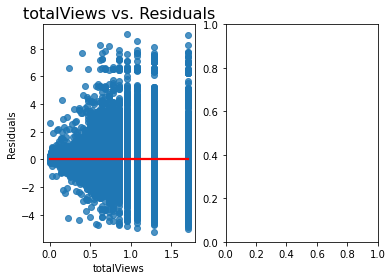

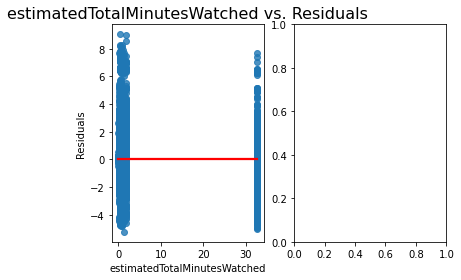

In [ ]:
test_normality_homoscedasticity( ( np.power(y_train_rm + 0.001, -0.5) + np.power(y_train_rm + 1, -0.5) ), ( np.power(X_train_rm + 0.001, -0.5) + np.power(X_train_rm + 1, -0.5) ))

-0.15548486584375032
R^2 adj: 0.44353066666242635
BIC: 249578.67101691704
MSE: 27818.908088899818
Jarque-Bera test ---- statistic: 4941.6494, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.9838, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.0439, p-value: 0.0000
Anderson-Darling test ---- statistic: 197.3324, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


{'LM Statistic': 1020.9053802752901, 'LM-Test p-value': 5.998962652082359e-211, 'F-Statistic': 86.81450848116981, 'F-Test p-value': 3.5991545408811125e-213}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


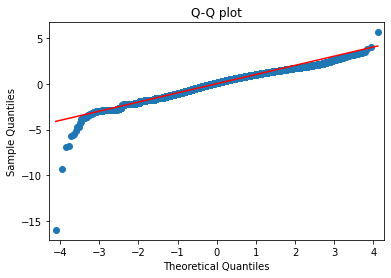

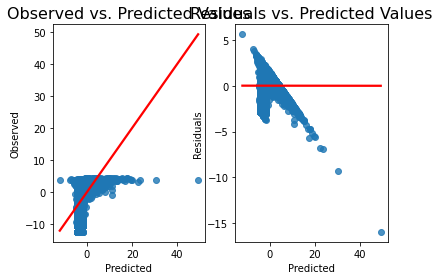

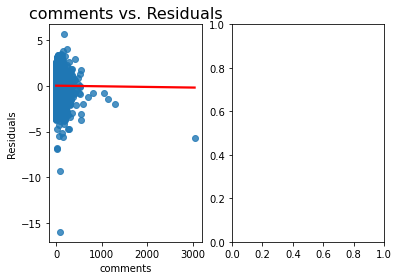

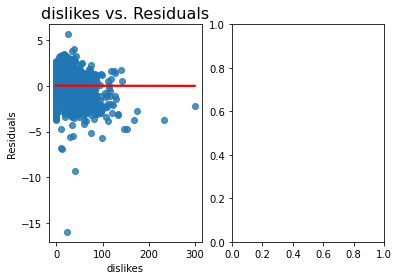

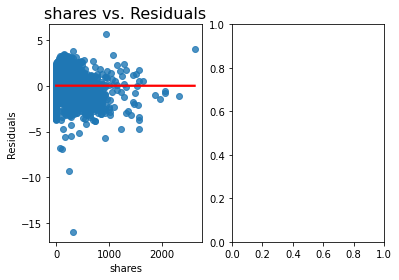

...

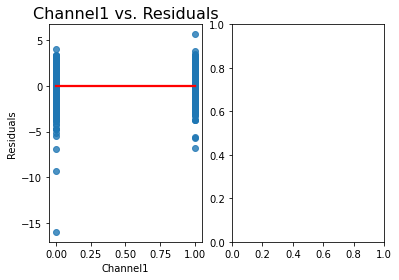

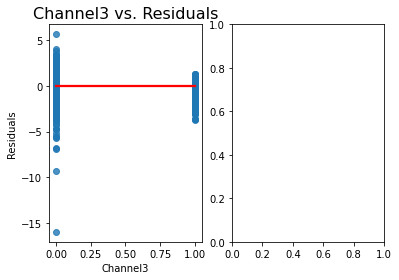

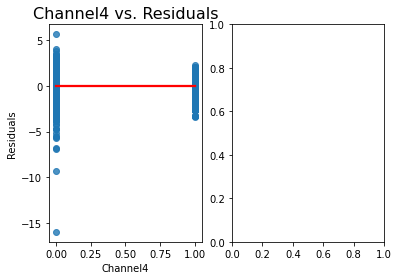

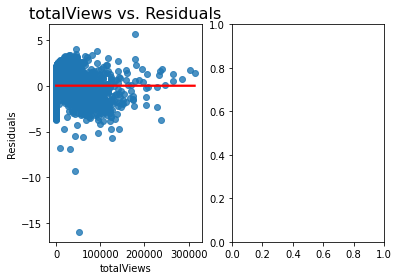

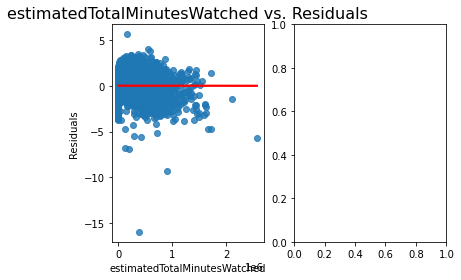

In [ ]:
fitted_y = y_train_rm + 0.001
fitted_y, fitted_lambda = stats.boxcox(fitted_y.values, lmbda = None)
print(fitted_lambda)
test_normality_homoscedasticity(fitted_y, X_train_rm)

In [ ]:
fitted_y = y_train_rm + 0.001
fitted_y, fitted_lambda = stats.boxcox(fitted_y.values, lmbda = None)
fitted_x = X_train_rm + 0.001
fitted_x, fitted_x_lambda = stats.boxcox(fitted_x.values, lmbda = None)
print(fitted_x_lambda)
test_normality_homoscedasticity(fitted_y, fitted_x)

ValueError: ignored

In [ ]:
acf = smt.graphics.plot_acf(sta, lags=40 , alpha=0.05)
acf.show()

In [ ]:
temp_X_rm = np.power(X_train_rm + 0.001, -3)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -3), temp_X_rm)

R^2 adj: 0.10564628941166321
BIC: 409213.7233032523
MSE: 98510.89370896295
Jarque-Bera test ---- statistic: 158393.2795, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.7727, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1661, p-value: 0.0000
Anderson-Darling test ---- statistic: 3135.1745, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 502.01277632911496, 'LM-Test p-value': 8.265252555208817e-100, 'F-Statistic': 42.24497805333954, 'F-Test p-value': 2.4994495087988423e-100}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


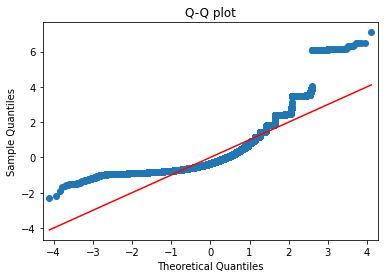

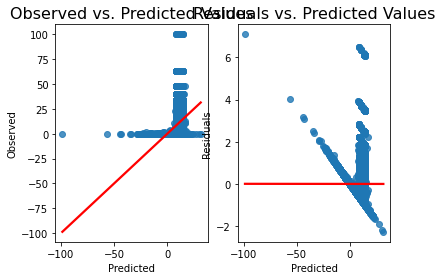

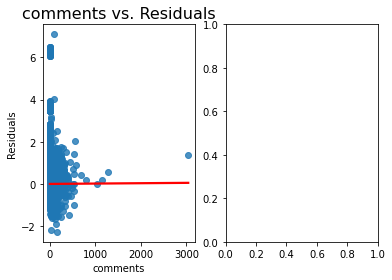

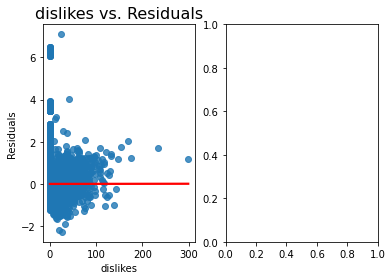

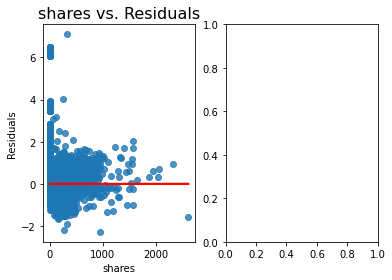

...

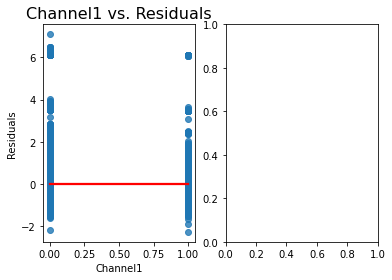

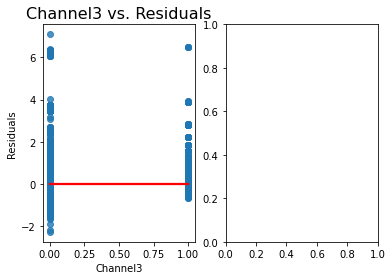

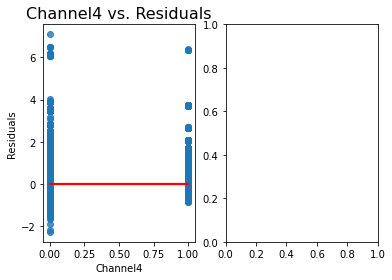

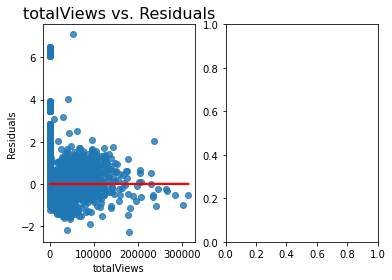

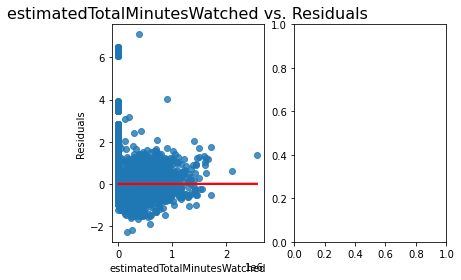

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -2/3), X_train_rm)

R^2 adj: 0.16313714515278555
BIC: 305614.2070305924
MSE: 20734.98035349305
Jarque-Bera test ---- statistic: 43709.2289, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8590, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1298, p-value: 0.0000
Anderson-Darling test ---- statistic: 1965.7037, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 570.7617570560672, 'LM-Test p-value': 1.846083653799995e-114, 'F-Statistic': 48.096650223461694, 'F-Test p-value': 3.889679107355957e-115}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


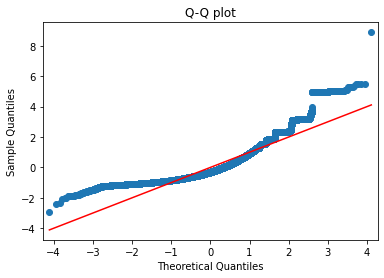

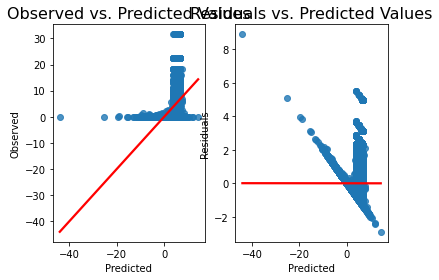

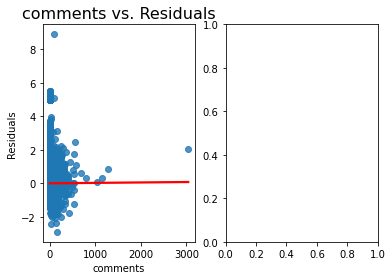

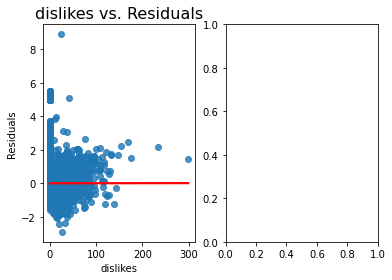

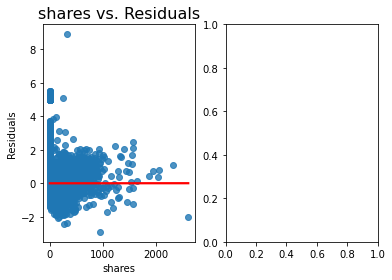

...

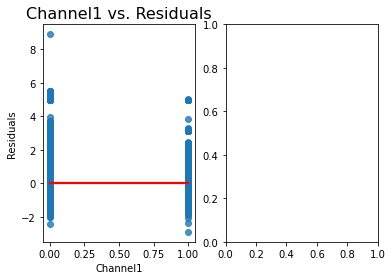

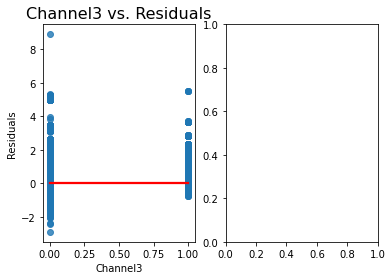

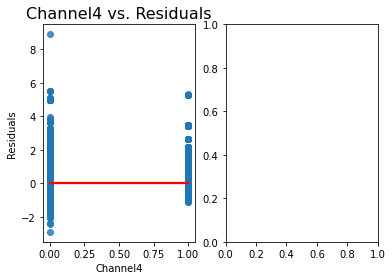

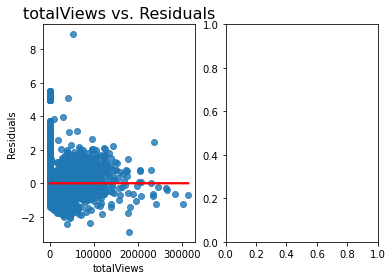

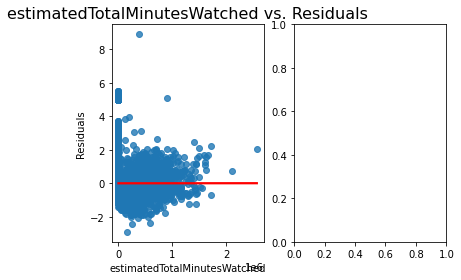

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, -0.5), X_train_rm)

R^2 adj: 0.5745318938408506
BIC: 1933478.6417260198
MSE: 1.5999209402702766e+19
Jarque-Bera test ---- statistic: 13983827534.3682, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.1479, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.3922, p-value: 0.0000
Anderson-Darling test ---- statistic: 13220.5350, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 7260.076697343698, 'LM-Test p-value': 0.0, 'F-Statistic': 706.8113401161642, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


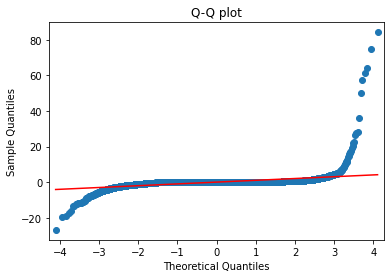

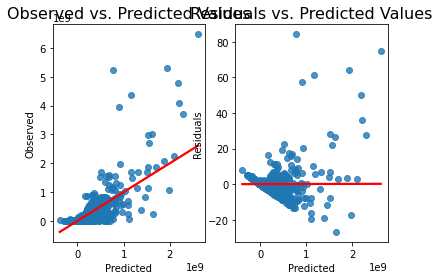

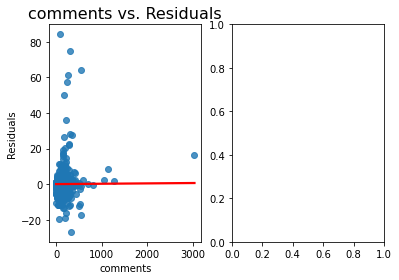

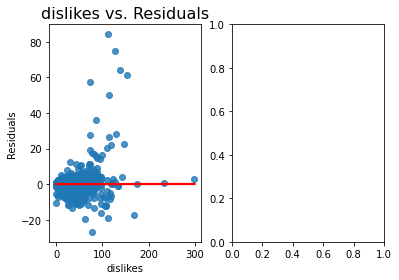

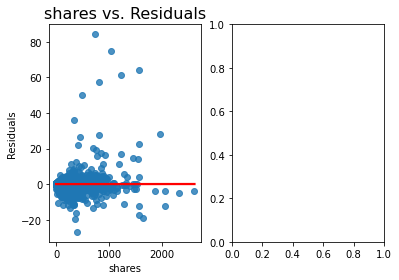

...

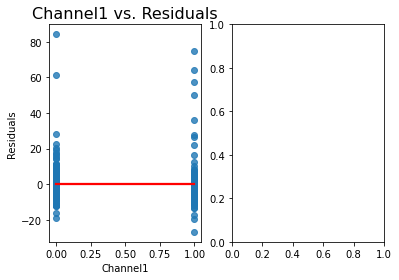

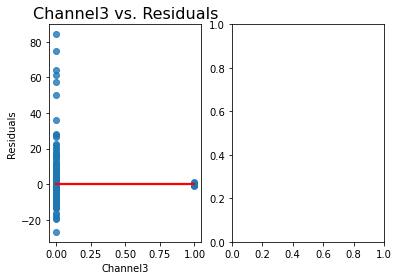

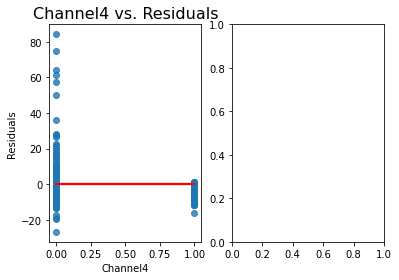

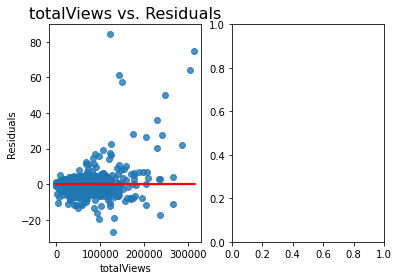

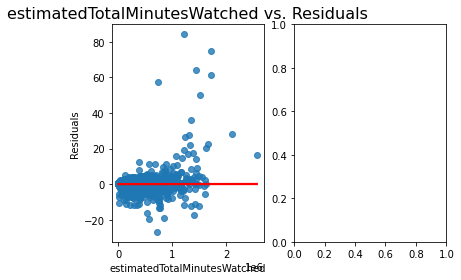

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, 3), X_train_rm)

R^2 adj: 0.8921215770621785
BIC: 96517.76024720086
MSE: 13785.548245955375
Jarque-Bera test ---- statistic: 2654654.2401, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.7471, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.1935, p-value: 0.0000
Anderson-Darling test ---- statistic: 3709.1455, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 8349.21180499776, 'LM-Test p-value': 0.0, 'F-Statistic': 833.9342519390063, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


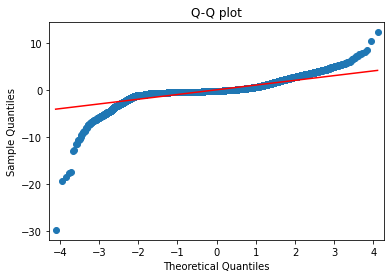

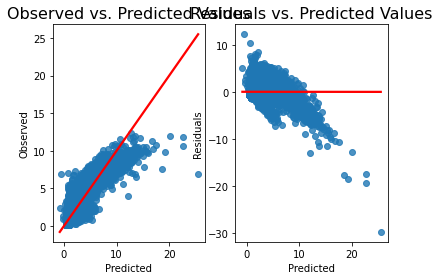

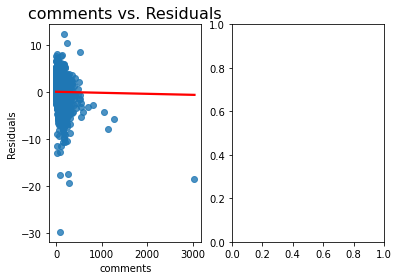

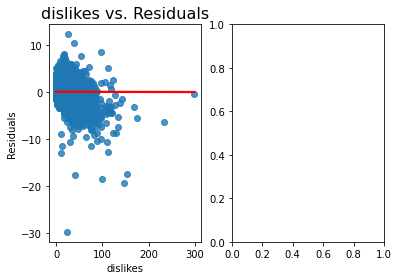

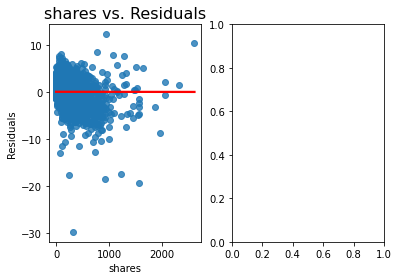

...

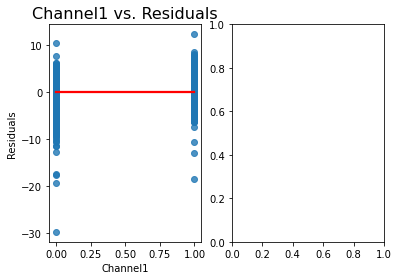

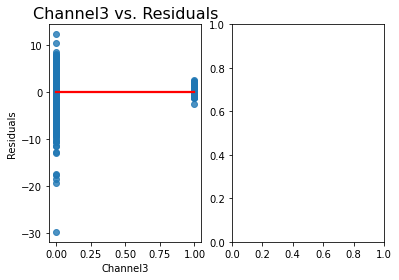

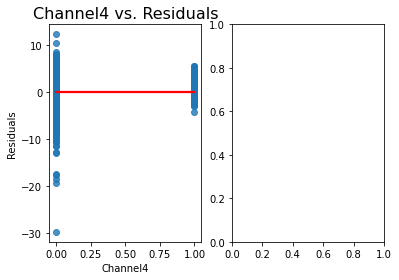

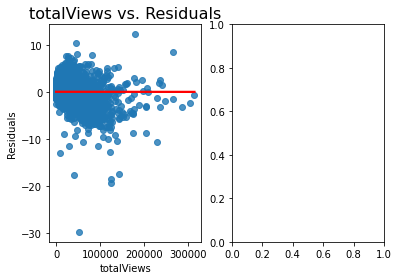

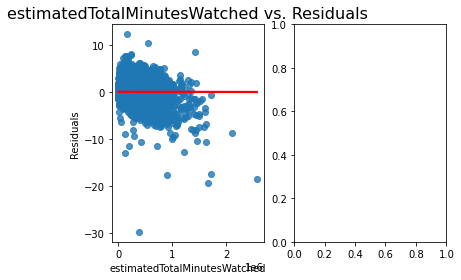

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, 1/3), X_train_rm)

R^2 adj: 0.9631787069572415
BIC: 239925.9763530837
MSE: 753431.4348538913
Jarque-Bera test ---- statistic: 6465994.4871, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.5386, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.2985, p-value: 0.0000
Anderson-Darling test ---- statistic: 7854.9150, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 12216.911781437308, 'LM-Test p-value': 0.0, 'F-Statistic': 1344.0837146873973, 'F-Test p-value': 0.0}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


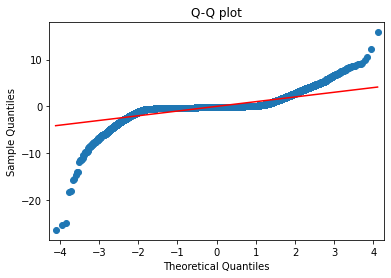

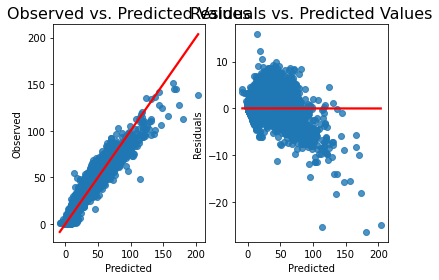

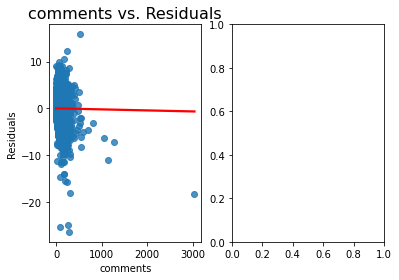

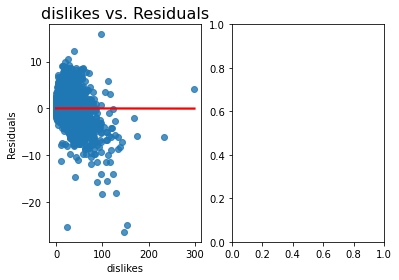

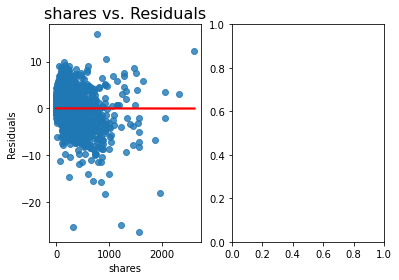

...

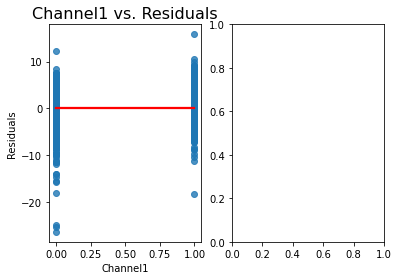

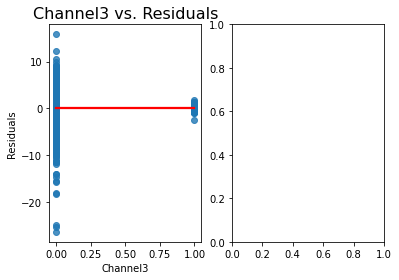

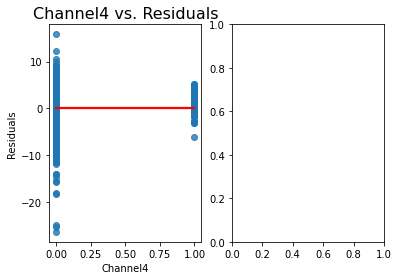

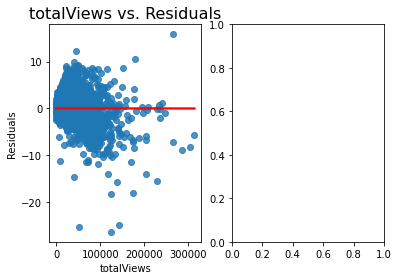

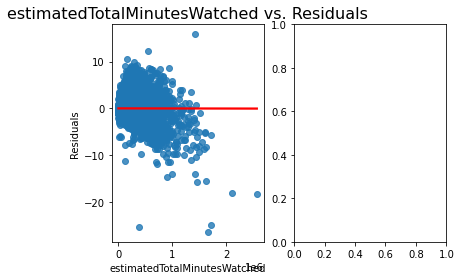

In [ ]:
test_normality_homoscedasticity( np.power(y_train_rm + 0.001, 2/3), X_train_rm)

R^2 adj: -8.277139216716911e-05
BIC: 527637.5645461218
MSE: 1362.6931174186368
Jarque-Bera test ---- statistic: 3289958428855.0161, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.0044, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.4635, p-value: 0.0000
Anderson-Darling test ---- statistic: 18512.5879, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 6.273739508135376, 'LM-Test p-value': 0.9016588858615913, 'F-Statistic': 0.5227417439896693, 'F-Test p-value': 0.9016921959539703}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


/usr/local/lib/python3.8/dist-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


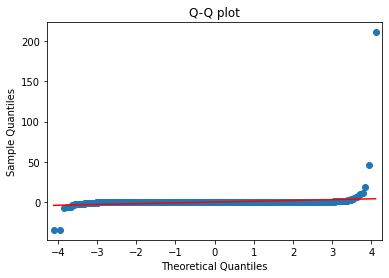

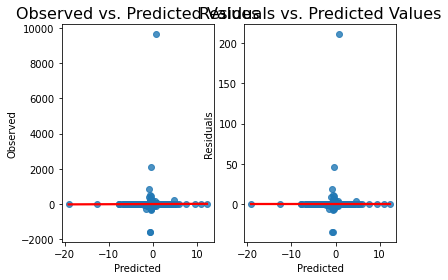

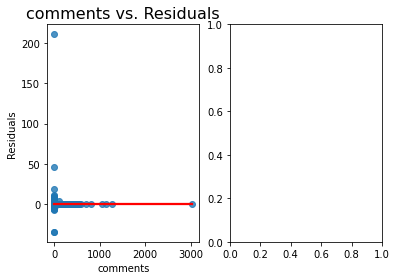

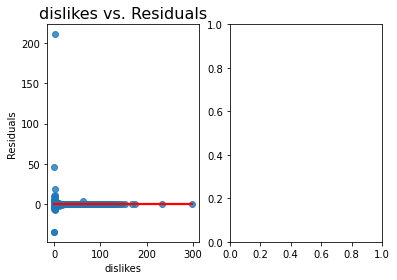

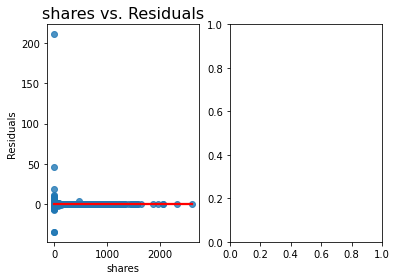

...

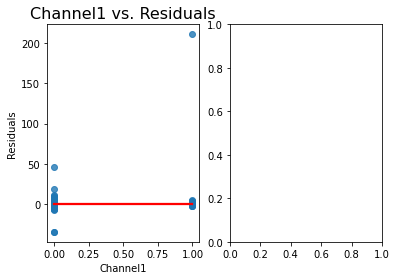

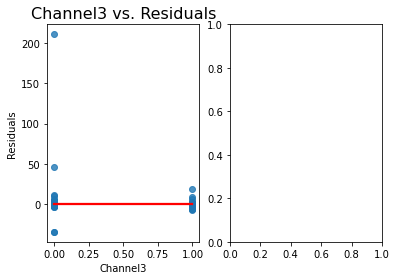

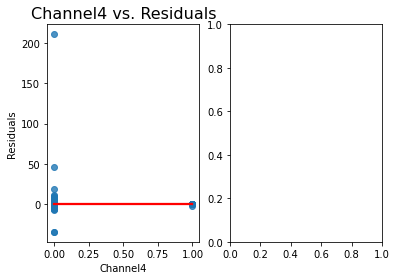

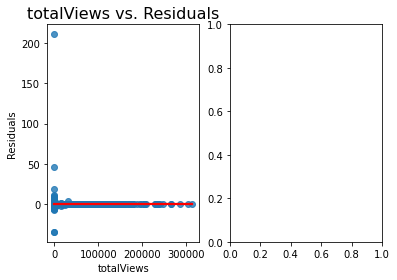

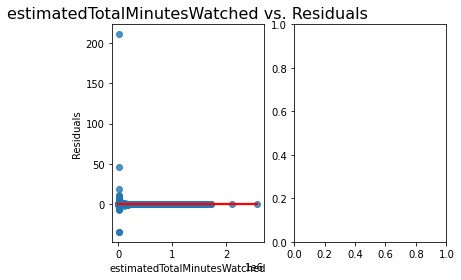

In [ ]:
test_normality_homoscedasticity( np.log(y_train_rm + 0.001)/(1- np.log(y_train_rm + 0.001)), X_train_rm)

## Best transformed model analysis

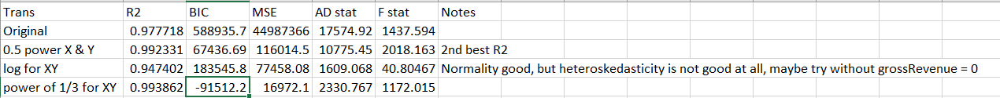

In [ ]:
# First test log for XY without zero revenue rows
no_zeroes_Xtrain_rm = X_train_rm

In [ ]:
zero_revenue_index = y_train_rm[y_train_rm <= 0.5].index
print(zero_revenue_index[:3])
print(len(y_train_rm) - len(zero_revenue_index))
no_zeroes_Xtrain_rm = X_train_rm.drop(zero_revenue_index)
no_zeroes_ytrain_rm = y_train_rm[y_train_rm > 0.5]
no_zeroes_Xtrain_rm

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


R^2 adj: 0.9841405979929879
BIC: 5937.133727914666
MSE: 6237.112575406475
Anderson-Darling test ---- statistic: 214.8905, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 
{'LM Statistic': 682.1569293156463, 'LM-Test p-value': 2.90395350698706e-138, 'F-Statistic': 59.86399313588035, 'F-Test p-value': 4.707102543234305e-142}
If the returned test are smaller than the 5% significance level, the null hypothesis that the data come from a distribution with constant variance should be rejected. 


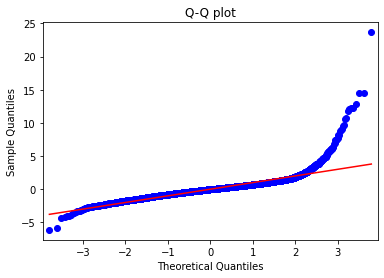

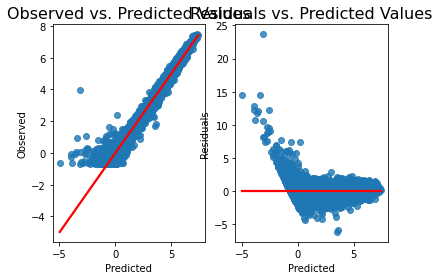

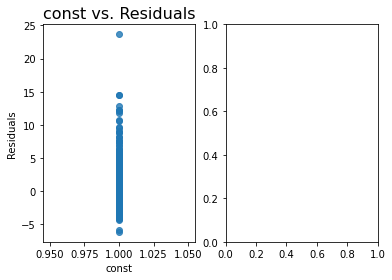

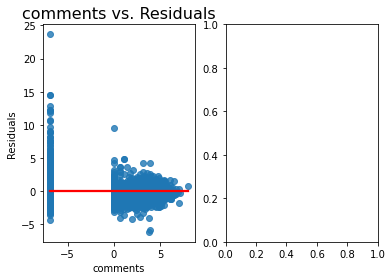

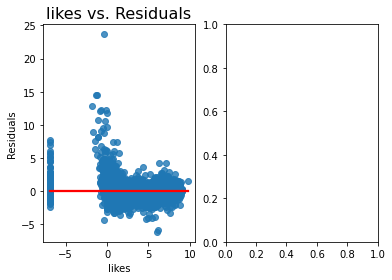

...

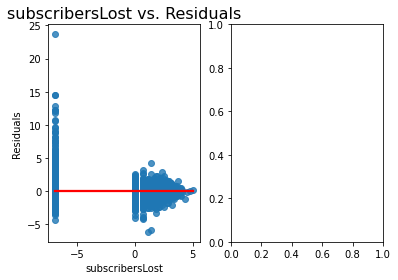

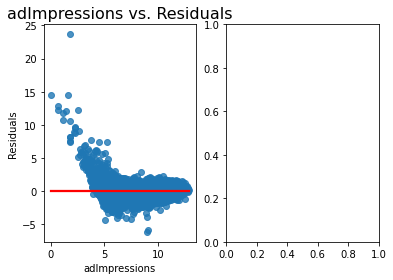

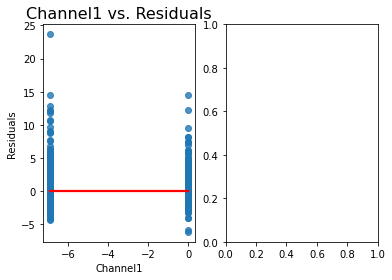

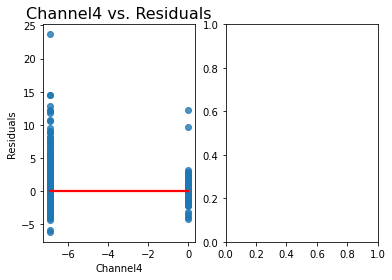

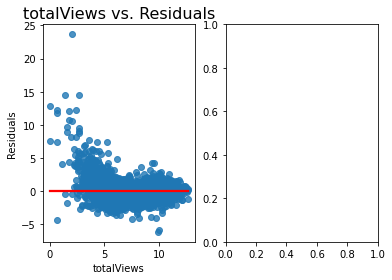

In [ ]:
# Try with new data
temp_X_rm = np.log(no_zeroes_Xtrain_rm + 0.001)
temp_X_rm = temp_X_rm.drop(['const'], axis =1 , errors='ignore')
temp_X_rm = sm.add_constant(temp_X_rm)

test_normality_homoscedasticity( np.log(no_zeroes_ytrain_rm + 0.001), temp_X_rm)

Abandon above transformation and continue with cube root transformation

# Use Transformation

In [ ]:
trans_X_train = np.power(X_train_rm + 0.001, 1/3)
trans_X_train = trans_X_train.drop(['const'], axis =1 , errors='ignore')
trans_X_train = sm.add_constant(trans_X_train)

trans_Y_train = np.power(y_train_rm + 0.001, 1/3)

trans_X_test = np.power(X_test_rm + 0.001, 1/3)
trans_X_test = trans_X_test.drop(['const'], axis =1 , errors='ignore')
trans_X_test = sm.add_constant(trans_X_test)

trans_Y_test = np.power(y_test + 0.001, 1/3)

# Heteroskedastically Robust Results

In [ ]:
trans_X_train.drop(['grossRevenue'], axis = 1, errors='ignore', inplace=True)
trans_X_test.drop(['grossRevenue'], axis = 1, errors='ignore', inplace=True)

trans_X_train.reset_index(drop=True, inplace=True)
trans_Y_train.reset_index(drop=True, inplace=True)

model = sm.OLS(trans_Y_train, trans_X_train)
trans_results = model.fit(cov_type='HC3')
trans_results.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.994      
Dependent Variable:    grossRevenue        AIC:                   -50438.1133
Date:                  2022-12-19 21:00    BIC:                   -50332.1975
No. Observations:      50328               Log-Likelihood:        25231.     
Df Model:              11                  F-statistic:           2.049e+05  
Df Residuals:          50316               Prob (F-statistic):    0.00       
R-squared:             0.994               Scale:                 0.021487   
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------------------
const                        -0.0069   0.0013  -5.4457 0.0000 -0.0094 -0.0044
comments                      0.0026   0.0033   0.8022 0.4224 -0.0038  0.0091
dislikes                      0.0617   0.0045  13.7805 0.0000  0.0530  0.0705
shares                       -0.0139   0.0029  -4.8051 0.0000 -0.0195 -0.0082
videosAddedToPlaylists        0.0111   0.0018   6.1703 0.0000  0.0076  0.0146
videosRemovedFromPlaylists    0.0082   0.0010   7.7967 0.0000  0.0061  0.0102
subscribersGained             0.0213   0.0039   5.5110 0.0000  0.0137  0.0289
adImpressions                 0.1747   0.0007 234.9133 0.0000  0.1732  0.1761
Channel1                      0.0529   0.0015  34.6970 0.0000  0.0499  0.0559
Channel4                     -0.0268   0.0039  -6.8185 0.0000 -0.0344 -0.0191
totalViews                   -0.0384   0.0012 -32.1426 0.0000 -0.0407 -0.0360
estimatedTotalMinutesWatched  0.0098   0.0005  21.2409 0.0000  0.0089  0.0107
-----------------------------------------------------------------------------
Omnibus:               14987.146         Durbin-Watson:            2.017     
Prob(Omnibus):         0.000             Jarque-Bera (JB):         237263.765
Skew:                  1.009             Prob(JB):                 0.000     
Kurtosis:              13.444            Condition No.:            202       
=============================================================================

"""

# Drop Comments

In [ ]:
trans_X_train_rm = trans_X_train.drop(['comments'], axis = 1, errors='ignore')
trans_X_test_rm = trans_X_test.drop(['comments'], axis = 1, errors='ignore')
trans_X_train_rm.drop(['grossRevenue'], axis = 1, errors='ignore', inplace=True)
trans_X_test_rm.drop(['grossRevenue'], axis = 1, errors='ignore', inplace=True)

In [ ]:
model = sm.OLS(trans_Y_train, trans_X_train_rm)
trans_results = model.fit(cov_type='HC3')
trans_results.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.994      
Dependent Variable:    grossRevenue        AIC:                   -50438.2718
Date:                  2022-12-19 21:09    BIC:                   -50341.1823
No. Observations:      50328               Log-Likelihood:        25230.     
Df Model:              10                  F-statistic:           2.255e+05  
Df Residuals:          50317               Prob (F-statistic):    0.00       
R-squared:             0.994               Scale:                 0.021487   
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------------------
const                        -0.0073   0.0013  -5.8276 0.0000 -0.0098 -0.0049
dislikes                      0.0623   0.0044  14.2979 0.0000  0.0537  0.0708
shares                       -0.0135   0.0029  -4.6202 0.0000 -0.0192 -0.0077
videosAddedToPlaylists        0.0113   0.0018   6.2911 0.0000  0.0078  0.0148
videosRemovedFromPlaylists    0.0081   0.0010   7.8255 0.0000  0.0061  0.0101
subscribersGained             0.0216   0.0038   5.6369 0.0000  0.0141  0.0290
adImpressions                 0.1746   0.0007 235.4334 0.0000  0.1732  0.1761
Channel1                      0.0535   0.0016  33.1057 0.0000  0.0504  0.0567
Channel4                     -0.0268   0.0039  -6.8427 0.0000 -0.0345 -0.0191
totalViews                   -0.0382   0.0012 -32.7529 0.0000 -0.0405 -0.0359
estimatedTotalMinutesWatched  0.0098   0.0005  21.2593 0.0000  0.0089  0.0107
-----------------------------------------------------------------------------
Omnibus:               14991.461         Durbin-Watson:            2.017     
Prob(Omnibus):         0.000             Jarque-Bera (JB):         237417.617
Skew:                  1.009             Prob(JB):                 0.000     
Kurtosis:              13.447            Condition No.:            202       
=============================================================================

"""

# Final Model

In [ ]:
df_anova = trans_X_train_rm
df_anova['grossRevenue'] = trans_Y_train
df_anova.drop(['const'], axis=1, inplace=True, errors='ignore')
final_lm = ols("""grossRevenue ~ dislikes + shares + videosAddedToPlaylists + videosRemovedFromPlaylists +
subscribersGained + adImpressions + Channel1 + Channel4 + totalViews + estimatedTotalMinutesWatched""",  data=df_anova).fit(cov_type='HC3', use_t=True)
final_lm.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                       Results: Ordinary least squares
=============================================================================
Model:                 OLS                 Adj. R-squared:        0.994      
Dependent Variable:    grossRevenue        AIC:                   -50438.2718
Date:                  2022-12-19 21:32    BIC:                   -50341.1823
No. Observations:      50328               Log-Likelihood:        25230.     
Df Model:              10                  F-statistic:           2.255e+05  
Df Residuals:          50317               Prob (F-statistic):    0.00       
R-squared:             0.994               Scale:                 0.021487   
-----------------------------------------------------------------------------
                              Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-----------------------------------------------------------------------------
Intercept                    -0.0073   0.0013  -5.8276 0.0000 -0.0098 -0.0049
dislikes                      0.0623   0.0044  14.2979 0.0000  0.0537  0.0708
shares                       -0.0135   0.0029  -4.6202 0.0000 -0.0192 -0.0077
videosAddedToPlaylists        0.0113   0.0018   6.2911 0.0000  0.0078  0.0148
videosRemovedFromPlaylists    0.0081   0.0010   7.8255 0.0000  0.0061  0.0101
subscribersGained             0.0216   0.0038   5.6369 0.0000  0.0141  0.0290
adImpressions                 0.1746   0.0007 235.4334 0.0000  0.1732  0.1761
Channel1                      0.0535   0.0016  33.1057 0.0000  0.0504  0.0567
Channel4                     -0.0268   0.0039  -6.8427 0.0000 -0.0345 -0.0191
totalViews                   -0.0382   0.0012 -32.7529 0.0000 -0.0405 -0.0359
estimatedTotalMinutesWatched  0.0098   0.0005  21.2593 0.0000  0.0089  0.0107
-----------------------------------------------------------------------------
Omnibus:               14991.461         Durbin-Watson:            2.017     
Prob(Omnibus):         0.000             Jarque-Bera (JB):         237417.617
Skew:                  1.009             Prob(JB):                 0.000     
Kurtosis:              13.447            Condition No.:            202       
=============================================================================

"""

In [ ]:
anova_table = sm.stats.anova_lm(final_lm, typ = 2)
anova_table

,sum_sq,df,F,PR(>F)
dislikes,4.392695,1.0,204.430799,2.778414e-46
shares,0.458676,1.0,21.346230,3.843227e-06
videosAddedToPlaylists,0.850424,1.0,39.577717,3.178455e-10
videosRemovedFromPlaylists,1.315846,1.0,61.237921,5.155948e-15
subscribersGained,0.682755,1.0,31.774620,1.740651e-08
adImpressions,1191.025063,1.0,55428.893746,0.000000e+00
Channel1,23.549937,1.0,1095.986119,8.929616e-238
Channel4,1.006104,1.0,46.822874,7.858789e-12
totalViews,23.050671,1.0,1072.750865,7.841710e-233
estimatedTotalMinutesWatched,9.711394,1.0,451.956776,7.453292e-100
